# Transfomer(年齢予測)

## import ライブラリー

In [7]:
"""%%bash
python3 -m pip install --user torch
python3 -m pip install --user scikit-learn"""

'%%bash\npython3 -m pip install --user torch\npython3 -m pip install --user scikit-learn'

In [8]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold

from scipy.stats import pearsonr
from scipy.stats import norm

import torch
import torch.nn as nn

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.device_count()
#torch.set_default_tensor_type('torch.cuda.FloatTensor')

1

## Data定義

In [9]:
%%time
#6分ぐらいかかる
df_aal = pd.read_csv('../02_data_analysis/roi_timeseries/timeseries_aal.csv')
df_ho = pd.read_csv('../02_data_analysis/roi_timeseries/timeseries_ho.csv')

#df_dynamic_aal = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_aal.csv')
#df_dynamic_ho = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_ho.csv')

df_subjects_info = pd.read_csv('../02_data_analysis/subjects_info/subjects_info.csv')

CPU times: user 3.18 s, sys: 127 ms, total: 3.3 s
Wall time: 3.31 s


In [10]:
def make_info_data(df = df_subjects_info,col = ['Age','Sex','やる気スコア(Apathy scale)']):
    subID = np.array(df.subID)
    subjects_info_list = []
    for ID in subID:
        data = np.array(df[df.subID == ID][col])[0]
        if 'Sex' in col:
            idx_sex = col.index('Sex')
            if data[idx_sex] == '男':
                data[idx_sex] = 0
            else:
                data[idx_sex] = 1
        
        subjects_info_list.append(data)
    subjects_info = np.array(subjects_info_list)
    
    if 'Age' in col:
        idx_age = col.index('Age')
    for i in range(len(col)):
        if i == idx_age:
            subjects_info[:,i] = (subjects_info[:,i] - \
                                  np.mean(subjects_info[:,i]))/np.std(subjects_info[:,i])
    return subjects_info.astype(np.float)

def make_data(df, subID = df_subjects_info.subID ,remove_list = ['time','subID']):
    data_list = []
    df_cols = list(df.columns)
    for r in remove_list:
        try:
            df_cols.remove(r)
        except:
            pass
    for ID in df_subjects_info.subID:
        data = df[df.subID == ID][df_cols]
        data = np.array(data)
        data_list.append(data)
    data = np.array(data_list)
    return data

In [11]:
%%time
data_label = make_info_data()
data_aal = make_data(df_aal)
data_ho = make_data(df_ho)

age_mean = df_subjects_info.Age.mean()
age_std = df_subjects_info.Age.std()

CPU times: user 10.1 s, sys: 30.4 ms, total: 10.1 s
Wall time: 10.1 s


In [12]:
data_label.shape
data_aal.shape
data_ho.shape

(615, 3)

(615, 140, 116)

(615, 140, 110)

In [13]:
#30秒ぐらいかかる
#data_dynamic_aal = make_data(df_dynamic_aal)
#data_dynamic_ho = make_data(df_dynamic_ho)

#data_dynamic_aal.shape
#data_dynamic_ho.shape

## Model作成

In [14]:
import math
class PositionalEncoding(nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 5000):
        super(PositionalEncoding, self).__init__()
        
        self.dropout = nn.Dropout(p=dropout)
        # Not a parameter
        self.register_buffer('pe', self._pe_table(d_model, max_len))

    def _pe_table(self, d_model: int, max_len: int) -> torch.Tensor:
        pos = torch.arange(0, max_len).unsqueeze(1)
        pe_denominator = torch.exp(
            torch.arange(0, d_model, 2) * math.log(10000) / d_model
        )

        pe = torch.zeros(max_len, d_model)
        pe[:, 0::2] = torch.sin(pos / pe_denominator)  # 偶数項にはsin
        pe[:, 1::2] = torch.cos(pos / pe_denominator)  # 奇数項にはcos

        pe = pe.unsqueeze(0)  # バッチに対応するため
        return pe

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.dropout(x + self.pe[:, :x.size(1)].clone().detach())

In [15]:
"""class Model(nn.Module):    
    def __init__(self,
                 input_dim,
                 d_model,
                 hidden_dim,
                 time_len,
                 nhead,
                 output_dim,
                 hidden_dim_transformer,
                 pos_drop,
                 trans_drop,
                 fc_drop
                ):
        super(Model, self).__init__()
        self.fc0  = nn.Linear(input_dim,d_model)
        self.pos  = PositionalEncoding(d_model = d_model,dropout=pos_drop)
        self.transformer_encoder_layer = nn.TransformerEncoderLayer(d_model,
                                                                    nhead,
                                                                    dropout=trans_drop,
                                                                    dim_feedforward=hidden_dim,
                                                                    batch_first=True)
        self.transformer_encoder       = nn.TransformerEncoder(self.transformer_encoder_layer,
                                                               num_layers=hidden_dim_transformer)
        self.fc_age1  = nn.Linear(d_model,1)
        self.fc_sex1  = nn.Linear(d_model,1)
        self.fc_age2  = nn.Linear(time_len,1)
        self.fc_sex2  = nn.Linear(time_len,1)
        self.drop  = nn.Dropout(fc_drop)
        self.time_len = time_len
        self.sigmoid = nn.Sigmoid()
        
    def forward(self,x):
        x = self.fc0(x)
        x = self.pos(x)
        x = self.transformer_encoder(x)
        age = self.fc_age1(x)
        sex = self.fc_sex1(x)
        
        age = self.drop(age)
        sex = self.drop(sex)
        
        age = torch.reshape(age, (-1, self.time_len))
        sex = torch.reshape(sex, (-1, self.time_len))
        
        age = self.fc_age2(age)
        sex = self.fc_sex2(sex)
        sex = self.sigmoid(sex)
        return age,sex"""

'class Model(nn.Module):    \n    def __init__(self,\n                 input_dim,\n                 d_model,\n                 hidden_dim,\n                 time_len,\n                 nhead,\n                 output_dim,\n                 hidden_dim_transformer,\n                 pos_drop,\n                 trans_drop,\n                 fc_drop\n                ):\n        super(Model, self).__init__()\n        self.fc0  = nn.Linear(input_dim,d_model)\n        self.pos  = PositionalEncoding(d_model = d_model,dropout=pos_drop)\n        self.transformer_encoder_layer = nn.TransformerEncoderLayer(d_model,\n                                                                    nhead,\n                                                                    dropout=trans_drop,\n                                                                    dim_feedforward=hidden_dim,\n                                                                    batch_first=True)\n        self.transformer_encoder       

In [16]:
class Model(nn.Module):    
    def __init__(self,
                 input_dim,
                 d_model,
                 hidden_dim,
                 time_len,
                 nhead,
                 output_dim,
                 hidden_dim_transformer,
                 pos_drop,
                 trans_drop,
                 fc_drop
                ):
        super(Model, self).__init__()
        self.fc0  = nn.Linear(input_dim,d_model)
        self.pos  = PositionalEncoding(d_model = d_model,dropout=pos_drop)
        self.transformer_encoder_layer = nn.TransformerEncoderLayer(d_model,
                                                                    nhead,
                                                                    dropout=trans_drop,
                                                                    dim_feedforward=hidden_dim,
                                                                    batch_first=True)
        self.transformer_encoder       = nn.TransformerEncoder(self.transformer_encoder_layer,
                                                               num_layers=hidden_dim_transformer)
        self.fc_age1  = nn.Linear(d_model,1)
        self.fc_sex1  = nn.Linear(d_model,1)
        self.fc_age2  = nn.Linear(time_len,1)
        #self.fc_sex2  = nn.Linear(time_len,1)
        self.drop  = nn.Dropout(fc_drop)
        self.time_len = time_len
        self.sigmoid = nn.Sigmoid()
        
    def forward(self,x):
        x = self.fc0(x)
        x = self.pos(x)
        x = self.transformer_encoder(x)
        age = self.fc_age1(x)
        sex = self.fc_sex1(x)
        age = self.drop(age)
        sex = self.drop(sex)
        
        age = torch.reshape(age, (-1, self.time_len))
        sex = torch.reshape(sex, (-1, self.time_len))
        
        age = self.fc_age2(age)
        sex = torch.mean(sex,axis=1)
        
        sex = torch.reshape(sex, (-1, 1))
        sex = self.sigmoid(sex)
        return age,sex

In [17]:
class MyDataset(torch.utils.data.Dataset):
    def __init__(self, data, label=None):
        self.data = data
        self.label = label
        self.test = label is None
        self.length = data.shape[0]
    def __len__(self):
        return self.length
    def __getitem__(self,idx):
        if self.test:
            data = torch.tensor(self.data[idx])
            return data
        else:
            data = torch.tensor(self.data[idx])
            label = torch.tensor(self.label[idx])
            return data, label

In [18]:
def compute_loss_age(y, t):
    criterion = nn.MSELoss()
    return criterion(y, t)

def compute_loss_sex(y, t):
    criterion = nn.BCELoss()
    return criterion(y, t)

def train_step(x,t,model,optimizer):
    model.train()
    preds_age,preds_sex = model(x)
    age = t[:,0:1]
    sex = t[:,1:]
    loss_age = compute_loss_age(preds_age, age)
    loss_sex = compute_loss_sex(preds_sex, sex)
    loss = (4/5) * loss_age + (1/4) * loss_sex
    #loss = (9/10) * loss_age + (1/10) * loss_sex
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    return loss, preds_age, preds_sex

def val_step(x,t,model):
    model.eval()
    preds_age,preds_sex = model(x)
    age = t[:,0:1]
    sex = t[:,1:]
    loss_age = compute_loss_age(preds_age, age)
    loss_sex = compute_loss_sex(preds_sex, sex)
    loss = (4/5) * loss_age + (1/4) * loss_sex
    #loss = (9/10) * loss_age + (1/10) * loss_sex
    
    return loss, preds_age, preds_sex

def test_step(x,model):
    model.eval()
    preds_age,preds_sex = model(x)
    return preds_age, preds_sex

def seed_worker(seed=0):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

In [19]:
def train_model(data,
                label,
                train_idx,
                test_idx,
                n_splits,
                epochs     = 750,
                d_model    = 128,
                hidden_dim = 512,
                nhead      = 32,
                hidden_dim_transformer = 2,
                pos_drop    = 0.1,
                trans_drop = 0.1,
                fc_drop = 0.1,
                title = ''
                ):
    
    epochs = epochs
    seed_worker()
    label = label[:,0:2]

    train_all = data[train_idx]
    test  = data[test_idx]
    
    train_label_all = label[train_idx]
    test_label  = label[test_idx]
    
    input_dim  = data.shape[2]
    time_len   = data.shape[1]
    output_dim = data_label.shape[1]
    d_model    = d_model
    hidden_dim = hidden_dim
    nhead      = nhead
    hidden_dim_transformer = hidden_dim_transformer
    pos_drop    = pos_drop
    trans_drop = trans_drop
    fc_drop = fc_drop
    
    test_dataset = MyDataset(test)
    test_dataloader = torch.utils.data.DataLoader(test_dataset,batch_size=32)
    
    kf = KFold(n_splits=n_splits,shuffle=False)
    test_pred_all = []
    test_pred_all_inverse = []
    
    for i, (train_index, val_index) in enumerate(kf.split(train_all)):
        
        early_stopping = 1e5
        save_epochs = 0
        
        train_loss_plot = []
        val_loss_plot = []
        
        train, train_label = train_all[train_index], train_label_all[train_index]
        val,   val_label   = train_all[val_index],   train_label_all[val_index]
        
        train_dataset    = MyDataset(train,train_label)
        train_dataloader = torch.utils.data.DataLoader(train_dataset,batch_size=32,shuffle=True)

        val_dataset      = MyDataset(val,val_label)
        val_dataloader   = torch.utils.data.DataLoader(val_dataset,batch_size=32)
        
        model = Model(input_dim = input_dim,
                      d_model  = d_model,
                      hidden_dim = hidden_dim,
                      time_len = time_len,
                      nhead = nhead,
                      output_dim = output_dim,
                      hidden_dim_transformer = hidden_dim_transformer,
                      pos_drop = pos_drop,
                      trans_drop = trans_drop,
                      fc_drop = fc_drop
                     ).to(device)
        
        optimizer = torch.optim.AdamW(model.parameters(),lr=1e-5)
        for epoch in range(epochs):
            train_loss = 0.
            val_loss = 0.

            for (x, t) in train_dataloader:
                x, t = x.to(device), t.to(device)
                x = x.float()
                t = t.float()
                loss, preds_age, preds_sex = train_step(x,t,model,optimizer)
                train_loss += loss.item()
            train_loss /= len(train_dataloader)
            
            for (x, t) in val_dataloader:
                x, t = x.to(device), t.to(device)
                x = x.float()
                t = t.float()
                loss, preds_age, preds_sex = val_step(x,t,model)
                val_loss += loss.item()
            val_loss /= len(val_dataloader)
            
            if (epoch+1) % 100 == 0:
                print(f'Kfold: {i+1} ::: epoch: {epoch+1}, loss: {train_loss}, val loss: {val_loss}')
            
            """if epoch+1 >= 250:
                if early_stopping >= val_loss:
                    early_stopping = val_loss
                    model_path = '../02_data_analysis/model/model_.pth'
                    torch.save(model.state_dict(), model_path)
                    save_epochs = epoch+1"""
        
            train_loss_plot.append(train_loss)
            val_loss_plot.append(val_loss)
        
        #model.load_state_dict(torch.load(model_path))
        print(f'save_epochs:{save_epochs}')
        
        train_loss_plot = np.array(train_loss_plot)
        val_loss_plot   = np.array(val_loss_plot)
        x               = np.linspace(0, len(train_loss_plot), len(train_loss_plot))
        
        plt.figure(figsize=(6, 4), dpi=80)
        plt.plot(x, train_loss_plot, label="train loss")
        plt.plot(x, val_loss_plot, label="val loss")
        plt.title('Loss Curves' + ' ' + title, fontsize=14)   # 図のタイトル
        plt.xlabel('Epochs',fontsize=14) # x軸のラベル
        plt.ylabel('MSELoss',fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()

        train_pred_age = []
        train_pred_sex = []
        train_label = []
        
        for (x, t) in train_dataloader:
            x, t = x.to(device), t.to(device)
            x = x.float()
            t = t.float()
            loss, preds_age, preds_sex= val_step(x,t,model)
            train_pred_age.append(preds_age)
            train_pred_sex.append(preds_sex)
            train_label.append(t)
        
        val_pred_age = []
        val_pred_sex = []
        for (x, t) in val_dataloader:
            x, t = x.to(device), t.to(device)
            x = x.float()
            t = t.float()
            loss, preds_age, preds_sex= val_step(x,t,model)
            val_pred_age.append(preds_age)
            val_pred_sex.append(preds_sex)
        
        train_pred_age = torch.cat(train_pred_age)
        train_pred_age = train_pred_age.to('cpu').detach().numpy().copy()
        train_pred_sex = torch.cat(train_pred_sex)
        train_pred_sex = train_pred_sex.to('cpu').detach().numpy().copy()
        
        train_label = torch.cat(train_label)
        train_label = train_label.to('cpu').detach().numpy().copy()
        
        val_pred_age = torch.cat(val_pred_age)
        val_pred_age = val_pred_age.to('cpu').detach().numpy().copy()
        val_pred_sex = torch.cat(val_pred_sex)
        val_pred_sex = val_pred_sex.to('cpu').detach().numpy().copy()
        
        new_line = '\n'
        
        corr,p = pearsonr(train_label[:,0],np.array(train_pred_age[:,0]))
        
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter((train_label[:,0]*age_std)+age_mean,(np.array(train_pred_age[:,0])*age_std)+age_mean,
                   label = f'corrcoef : {corr:.3f}{new_line}p value : {p}')
        plt.title(title + ' ' + 'scatter train', fontsize=14)   # 図のタイトル
        plt.xlabel('chronological age', fontsize=14) # x軸のラベル
        plt.ylabel('predicted age', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()
        print('r^2 train data: ', r2_score(train_label[:,0],np.array(train_pred_age[:,0])))
        
        corr,p = pearsonr(val_label[:,0],np.array(val_pred_age[:,0]))
        
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter((val_label[:,0]*age_std)+age_mean,(np.array(val_pred_age[:,0])*age_std)+age_mean,
                   label = f'corrcoef : {corr:.3f}{new_line}p value : {p}')
        plt.title(title + ' ' + 'scatter val', fontsize=14)   # 図のタイトル
        plt.xlabel('chronological age', fontsize=14) # x軸のラベル
        plt.ylabel('predicted age', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()
        print('r^2 val data: ', r2_score(val_label[:,0],np.array(val_pred_age[:,0])))
        
        acc = 0
        for i,c in enumerate(train_label[:,1]):
            if c == 1:
                if train_pred_sex[:,0][i] >= 0.5:
                    acc += 1
            else:
                if train_pred_sex[:,0][i] < 0.5:
                    acc += 1
        q = 1/2
        n = len(train_label[:,1])
        z = (acc - n*q)/np.sqrt(n*q*(1-q))
        p = norm.sf(z)
        acc = acc/len(train_label[:,1])
        
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter(train_label[:,1],train_pred_sex[:,0],
                   label = f'train accuracy : {acc:.3f}{new_line}p value : {p}')
        plt.title(title + ' ' + 'sex train', fontsize=14)   # 図のタイトル
        plt.xlabel('chronological sex', fontsize=14) # x軸のラベル
        plt.ylabel('predicted probability', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()
        
        acc = 0
        for i,c in enumerate(val_label[:,1]):
            if c == 1:
                if val_pred_sex[:,0][i] >= 0.5:
                    acc += 1
            else:
                if val_pred_sex[:,0][i] < 0.5:
                    acc += 1
        q = 1/2
        n = len(val_label[:,1])
        z = (acc - n*q)/np.sqrt(n*q*(1-q))
        p = norm.sf(z)
        acc = acc/len(val_label[:,1])
                    
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter(val_label[:,1],val_pred_sex[:,0],
                   label = f'val accuracy : {acc:.3f}{new_line}p value : {p}')
        plt.title(title + ' ' + 'sex val', fontsize=14)   # 図のタイトル
        plt.xlabel('chronological sex', fontsize=14) # x軸のラベル
        plt.ylabel('predicted probability', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()
        plt.show()
        
        lr = LinearRegression()
        lr.fit(val_label[:,0:1]*age_std+age_mean,val_pred_age[:,0]*age_std+age_mean)
        corr,p = pearsonr(val_label[:,0],np.array(val_pred_age[:,0]))
        plt.figure(figsize=(6, 6), dpi=80)
        plt.scatter(val_label[:,0]*age_std+age_mean,val_pred_age[:,0]*age_std+age_mean,
                   label = f'corrcoef : {corr:.3f}{new_line}p value : {p}')#散布図をプロット
        plt.plot(val_label[:,0]*age_std + age_mean,
                 lr.predict(val_label[:,0:1]*age_std+age_mean), color = 'red',#回帰直線をプロット
                label = f'y = {lr.coef_[0]:.3f}x + {lr.intercept_:.3f}')#回帰直線をプロット
        
        plt.title(title + ' ' + 'val', fontsize=14)   # 図のタイトル
        plt.xlabel('chronological age', fontsize=14) # x軸のラベル
        plt.ylabel('predicted age', fontsize=14) # y軸のラベル
        plt.legend(fontsize=10.5)
        plt.grid()  # グリッド線を表示
        plt.show()  # 図の表示
        print('切片:', lr.intercept_)
        print('傾き:', lr.coef_[0])
                
        test_pred_age = []
        test_pred_sex = []
        
        for x in test_dataloader:
            x = x.to(device)
            x = x.float()
            preds_age, preds_sex = test_step(x,model)
            test_pred_age.append(preds_age)
            test_pred_sex.append(preds_sex)
        test_pred_age = torch.cat(test_pred_age)
        test_pred_sex = torch.cat(test_pred_sex)
        test_pred_age = test_pred_age.to('cpu').detach().numpy().copy()
        test_pred_sex = test_pred_sex.to('cpu').detach().numpy().copy()
        test_pred_age_inverse = test_pred_age * (1 / lr.coef_[0])
        test_pred     = np.concatenate([test_pred_age, test_pred_sex],1)
        test_pred_all.append(test_pred)
        test_pred_inverse  = np.concatenate([test_pred_age_inverse, test_pred_sex],1)
        test_pred_all_inverse.append(test_pred_inverse)
        
    return np.array(test_pred_all),np.array(test_pred_all_inverse),test_label

In [20]:
n_splits = 5

## 学習(AAL)

### Bold 1

Nested Kfold ::: 1
save_epochs:0


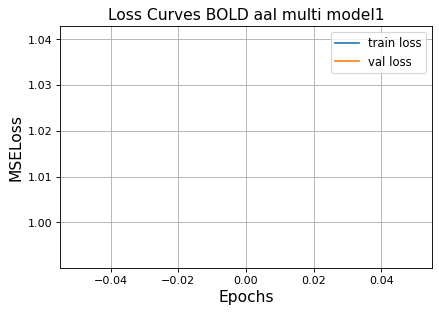

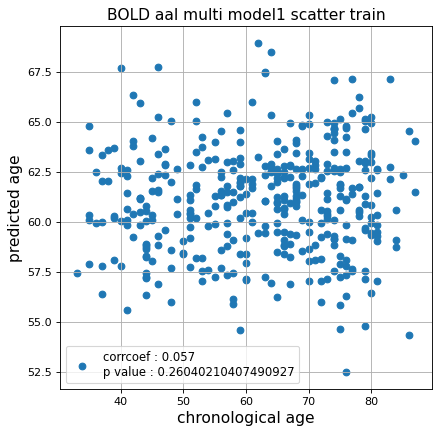

r^2 train data:  -0.02606503268118532


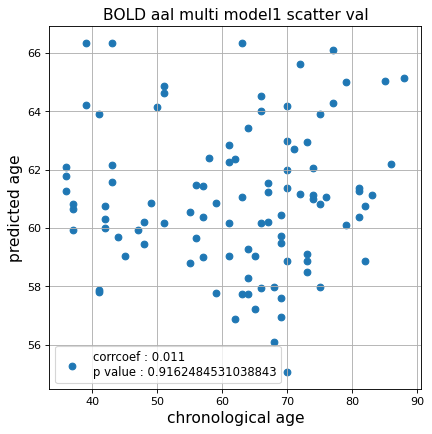

r^2 val data:  -0.03245372203397645


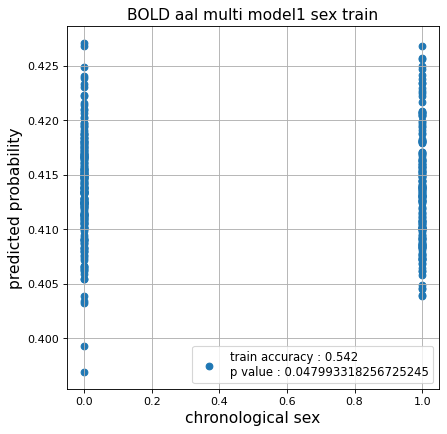

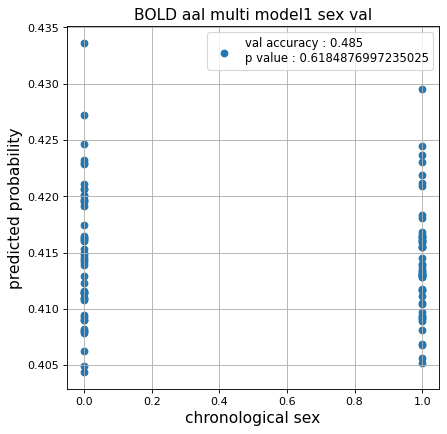

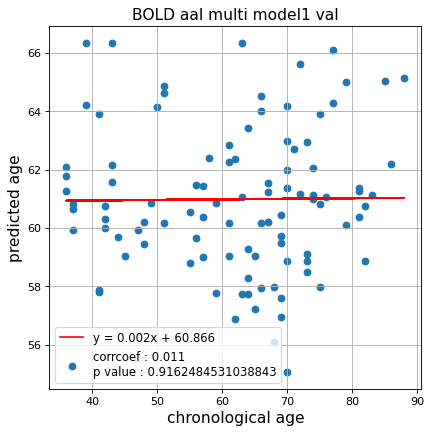

切片: 60.86591535396768
傾き: 0.0019103191851747052
save_epochs:0


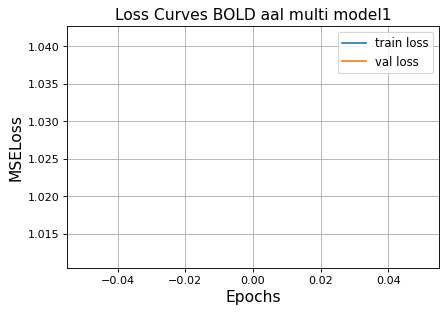

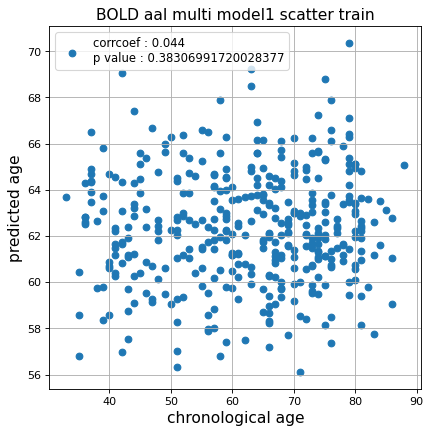

r^2 train data:  -0.017079322235303174


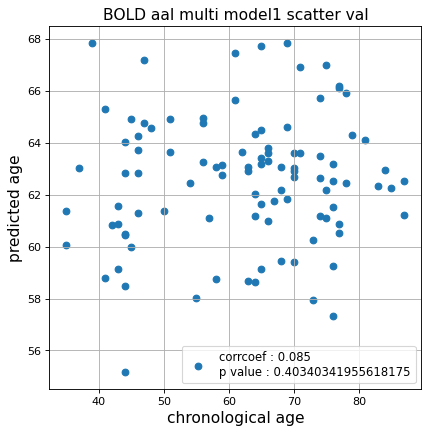

r^2 val data:  -0.00406135038214317


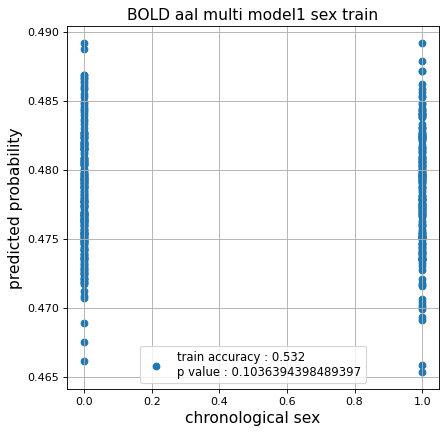

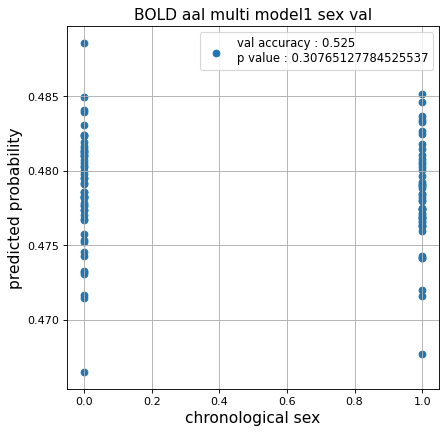

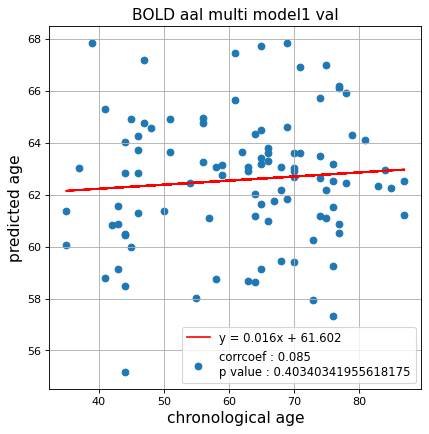

切片: 61.60160475718915
傾き: 0.015723767462475398
save_epochs:0


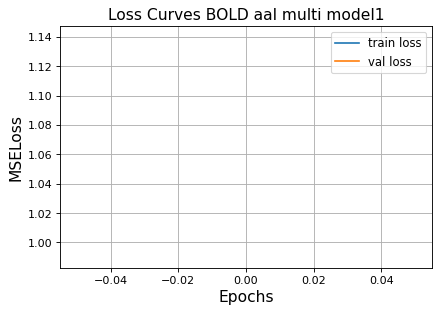

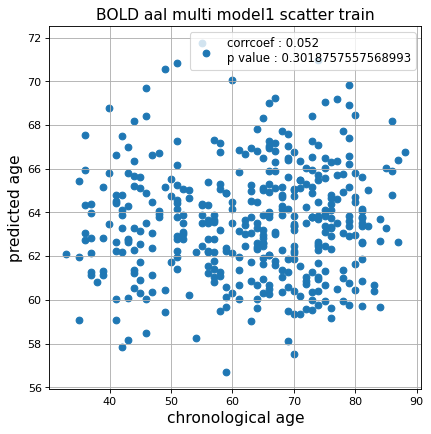

r^2 train data:  -0.021026928791095356


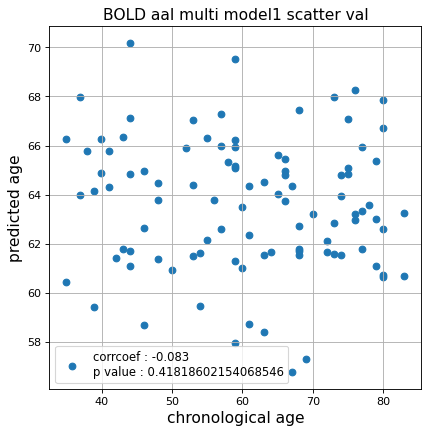

r^2 val data:  -0.11968143789579822


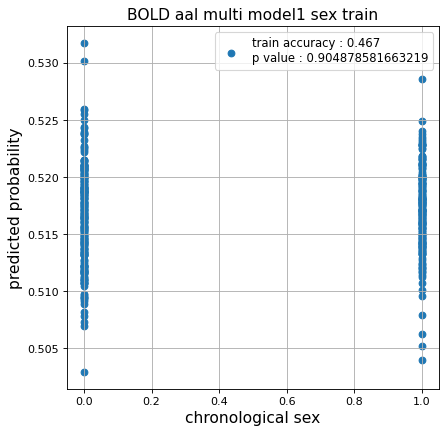

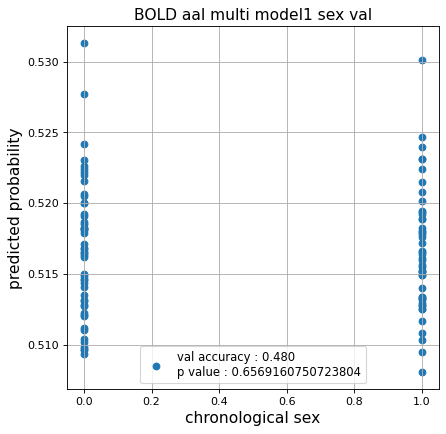

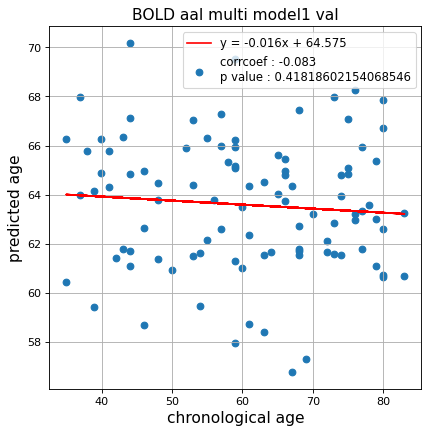

切片: 64.57458883779314
傾き: -0.01637257917654996
save_epochs:0


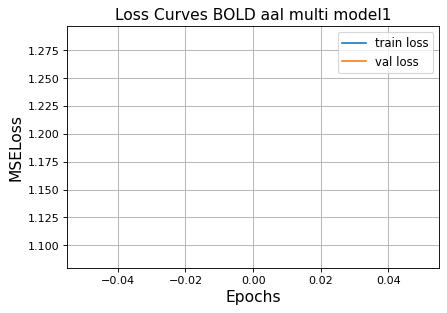

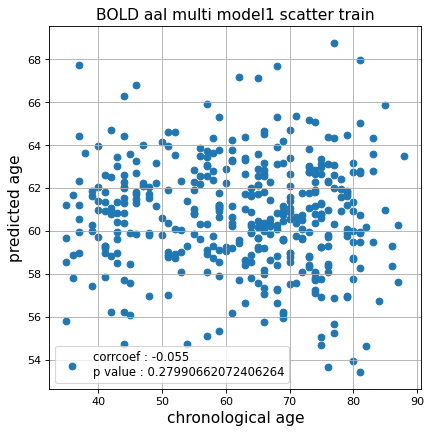

r^2 train data:  -0.07031961829182198


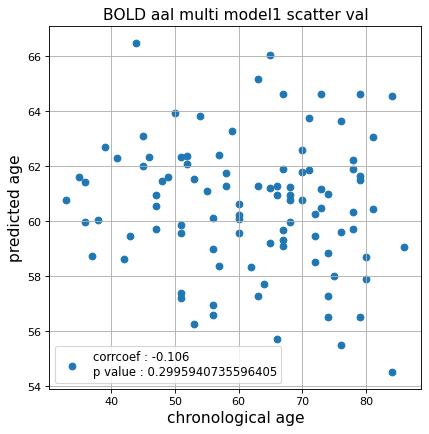

r^2 val data:  -0.08086391308921503


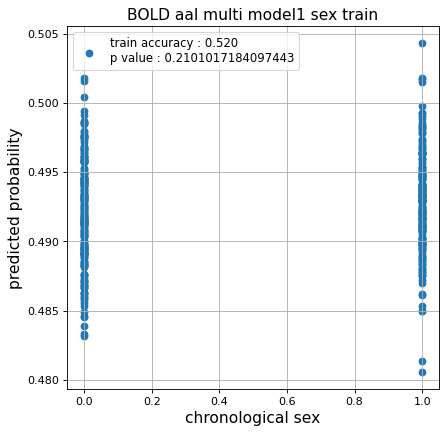

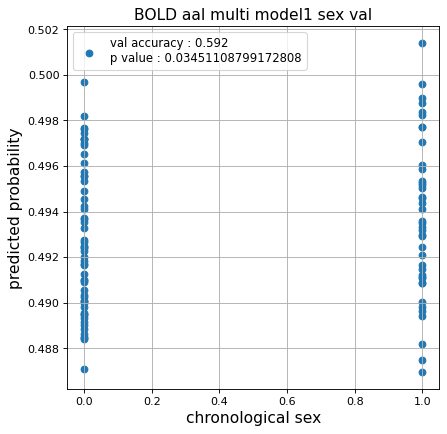

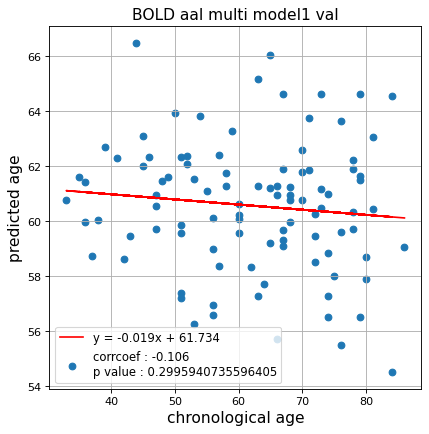

切片: 61.73401869597553
傾き: -0.018715883497116958
save_epochs:0


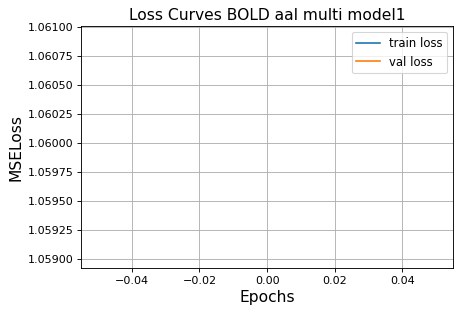

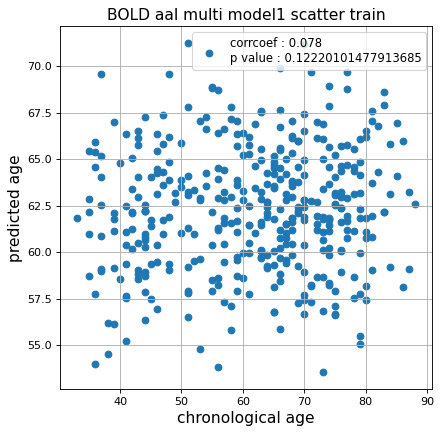

r^2 train data:  -0.023518438364837913


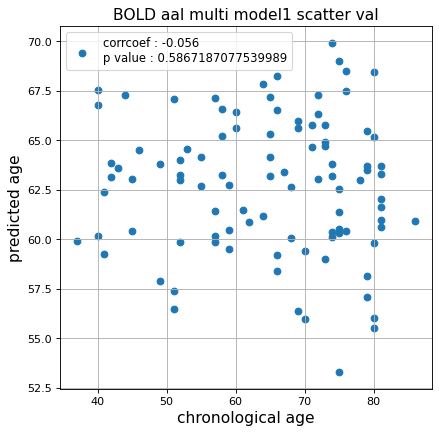

r^2 val data:  -0.12433395007821213


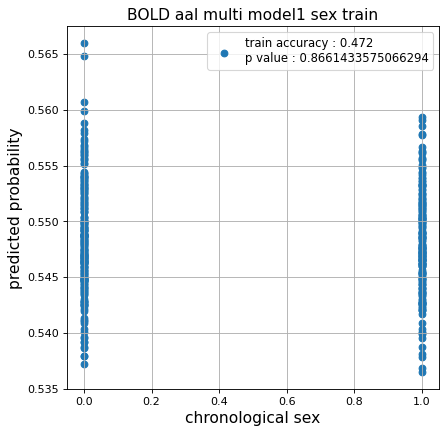

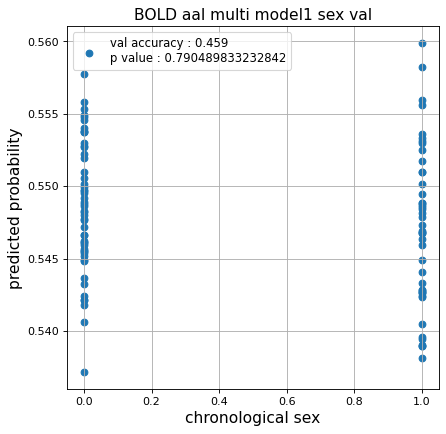

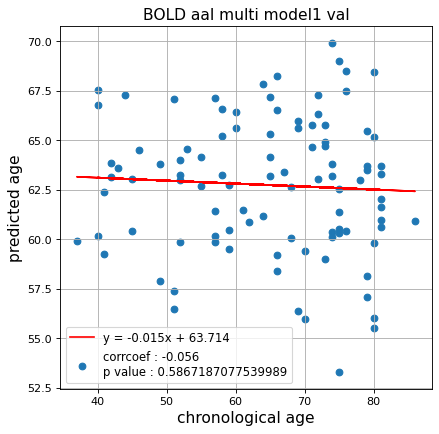

切片: 63.713890904478674
傾き: -0.014942052332338692
Nested Kfold ::: 2
save_epochs:0


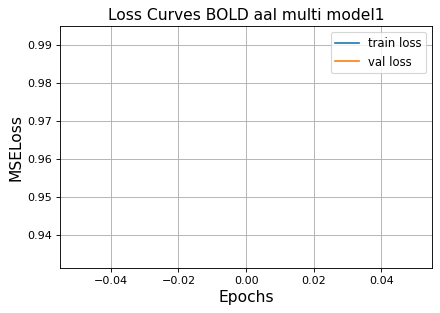

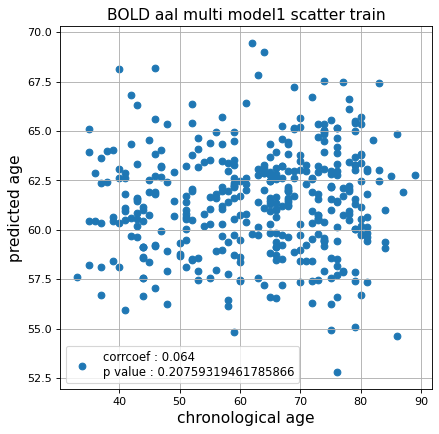

r^2 train data:  -0.024979542155015633


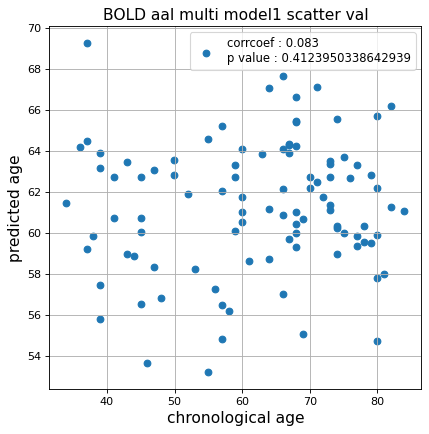

r^2 val data:  -0.01799328621170937


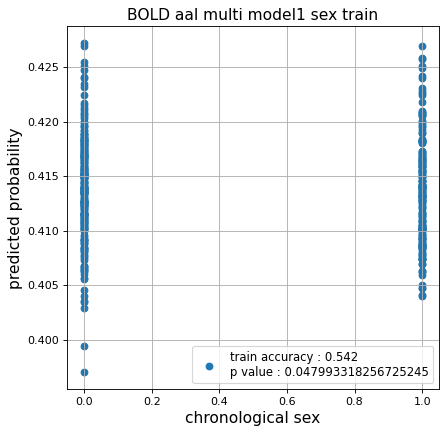

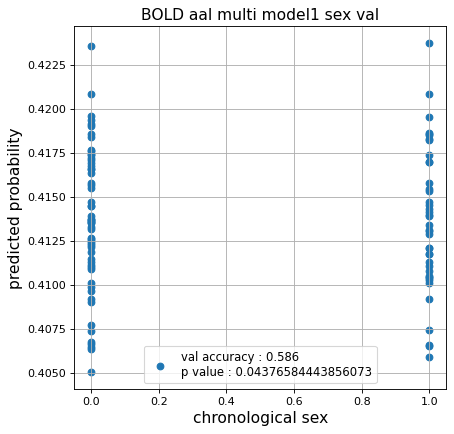

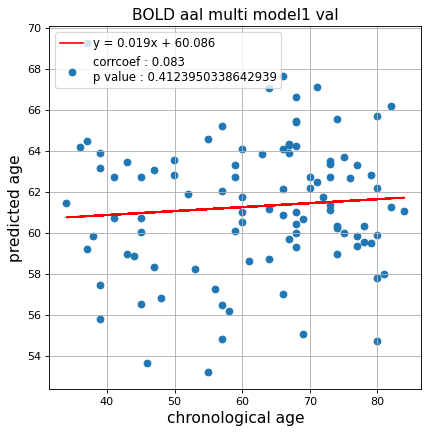

切片: 60.08636247852295
傾き: 0.019302218061811337
save_epochs:0


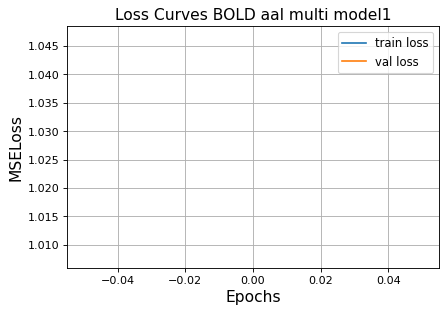

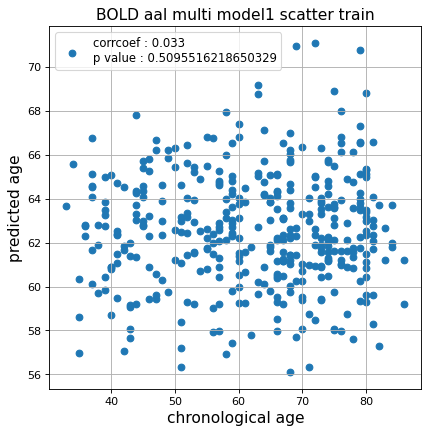

r^2 train data:  -0.02448372414751776


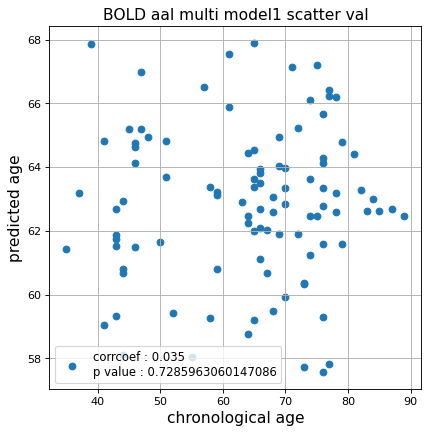

r^2 val data:  -0.024525735699639117


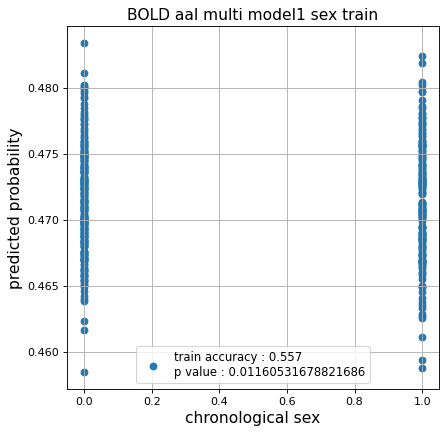

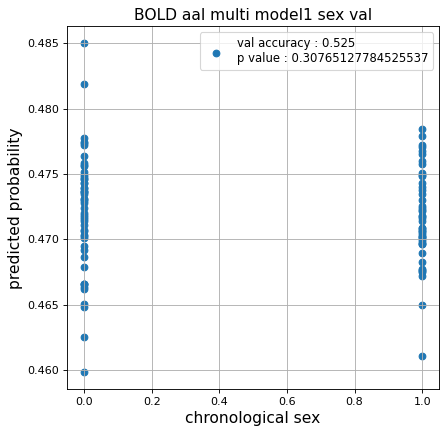

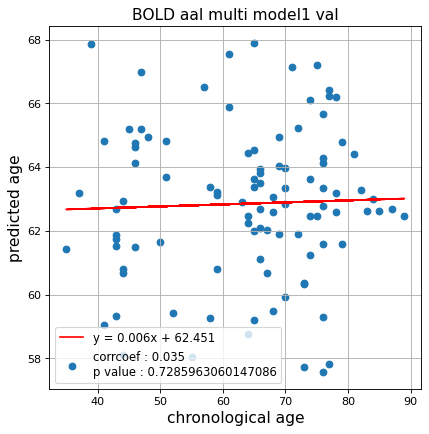

切片: 62.4513260830131
傾き: 0.006305977119053318
save_epochs:0


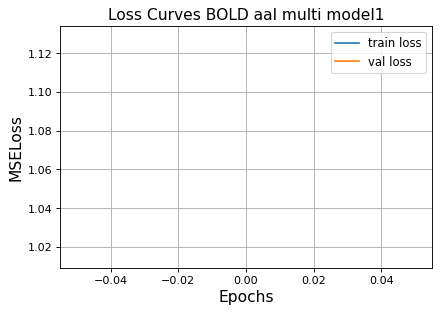

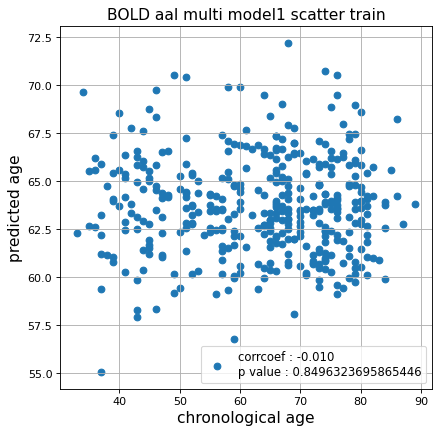

r^2 train data:  -0.042969192199229456


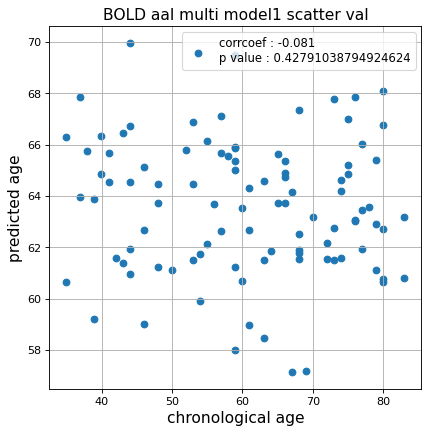

r^2 val data:  -0.11642326276003634


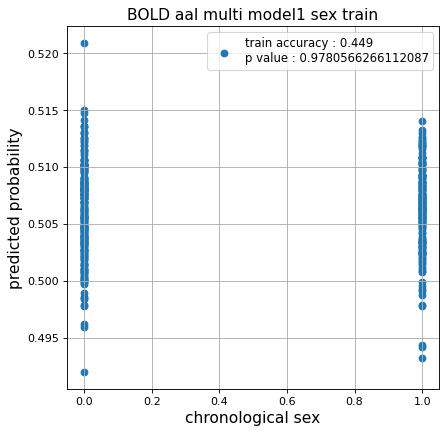

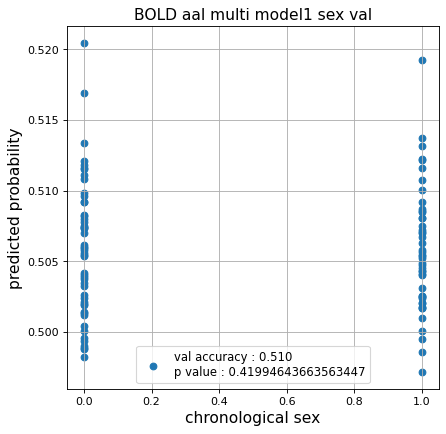

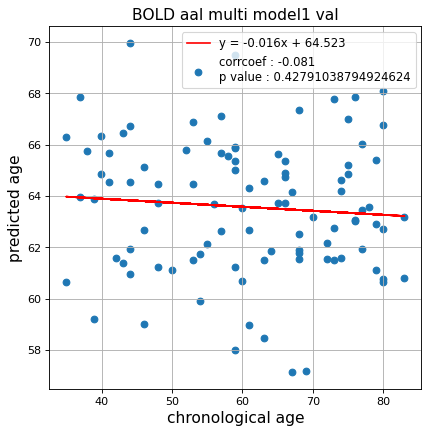

切片: 64.52303781127355
傾き: -0.015710444797478552
save_epochs:0


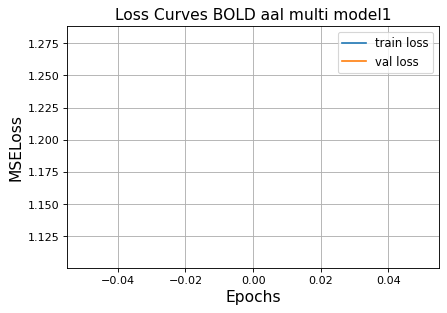

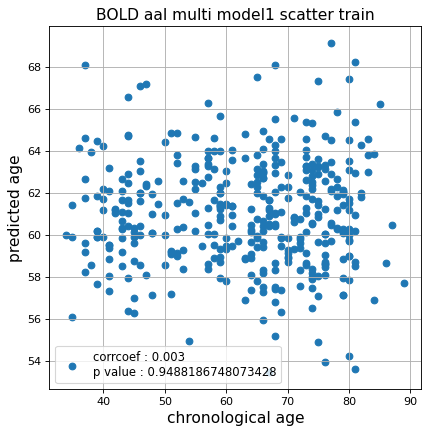

r^2 train data:  -0.051824885591807535


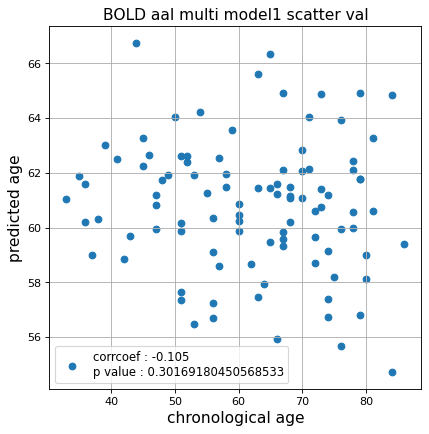

r^2 val data:  -0.07790250207969485


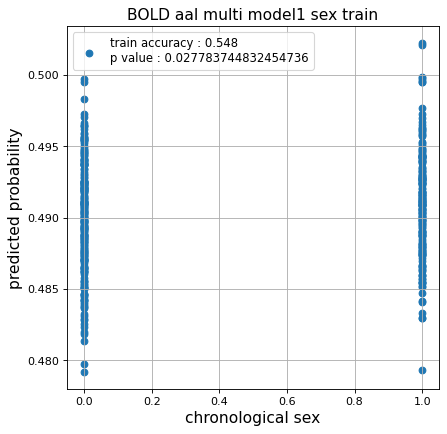

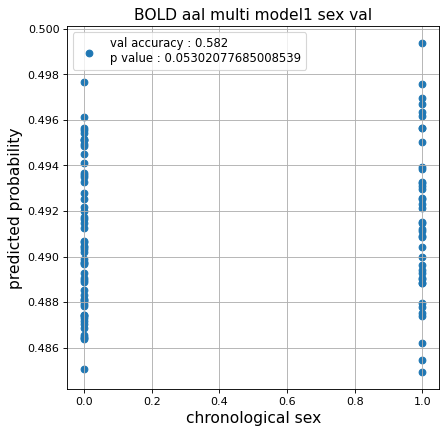

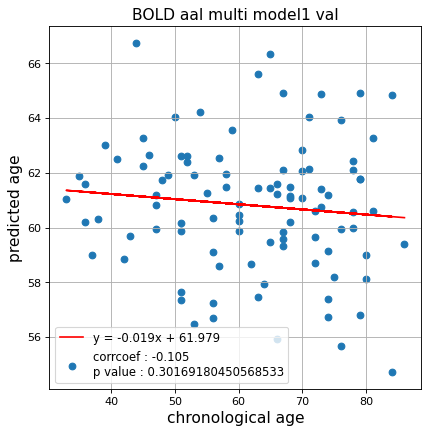

切片: 61.97928776961707
傾き: -0.01879515739480832
save_epochs:0


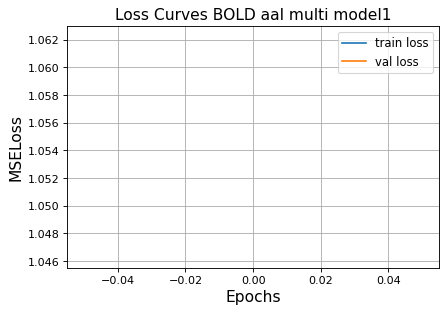

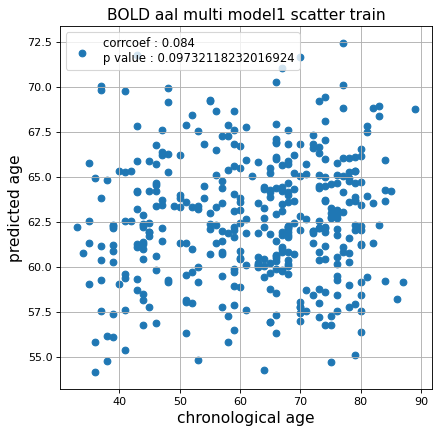

r^2 train data:  -0.024124866831641834


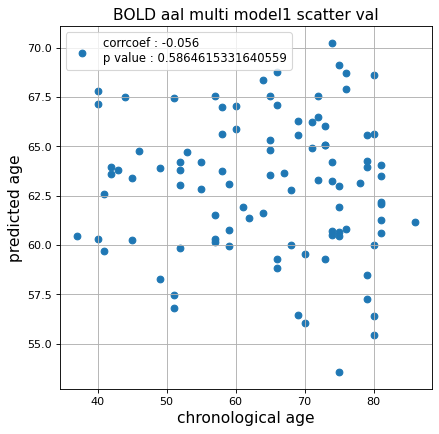

r^2 val data:  -0.12015255289090176


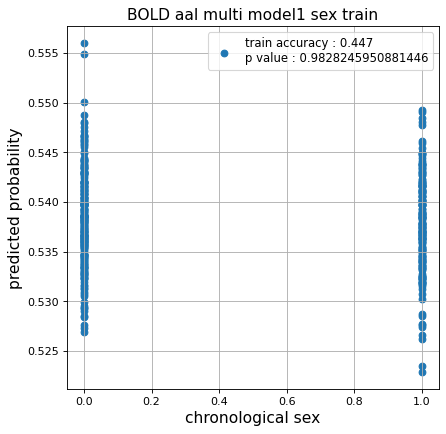

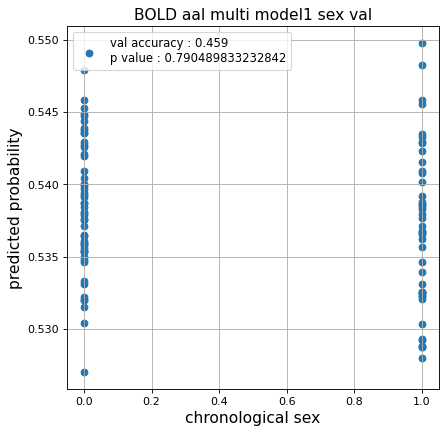

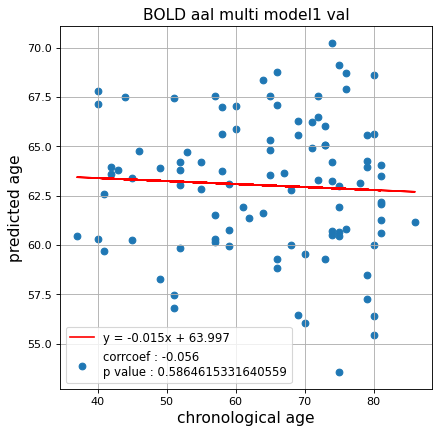

切片: 63.99698277026512
傾き: -0.015099348127886587
Nested Kfold ::: 3
save_epochs:0


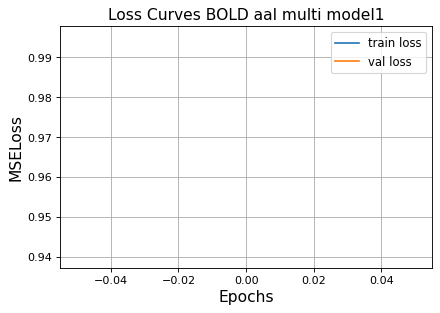

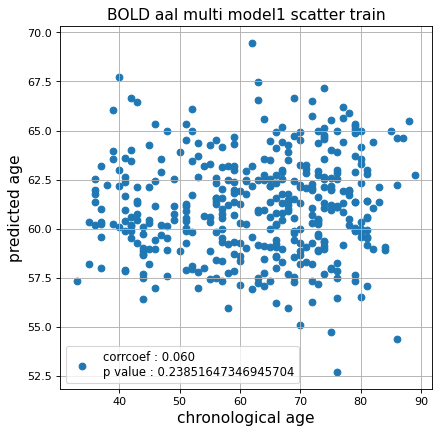

r^2 train data:  -0.027566746066733927


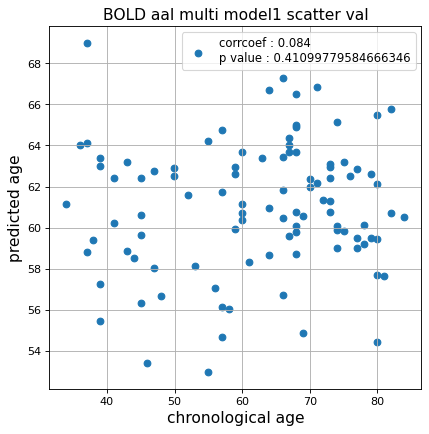

r^2 val data:  -0.019684907478915603


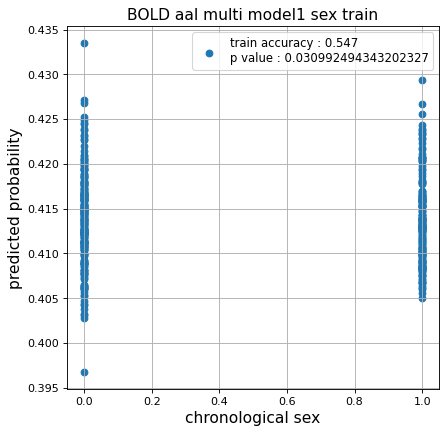

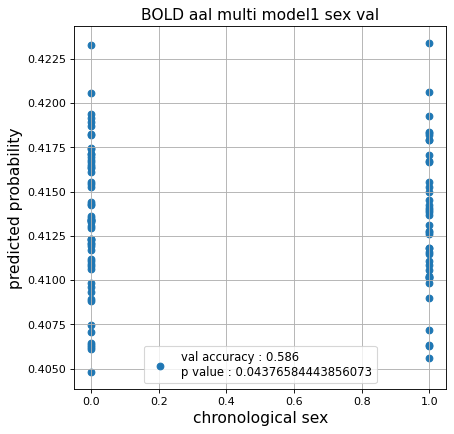

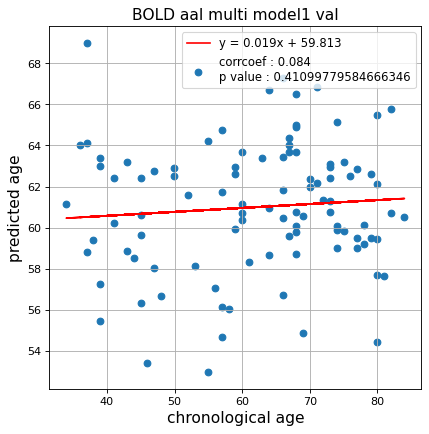

切片: 59.812770124050104
傾き: 0.019110073695408517
save_epochs:0


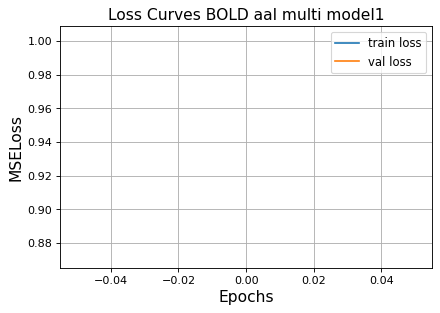

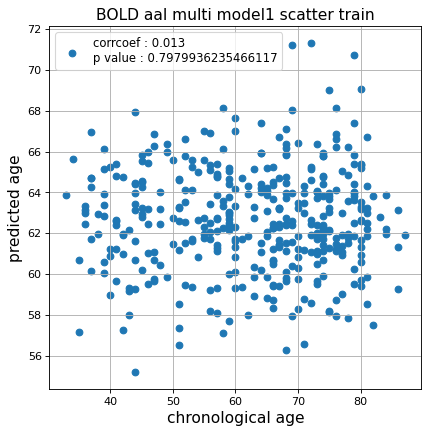

r^2 train data:  -0.031926319258155145


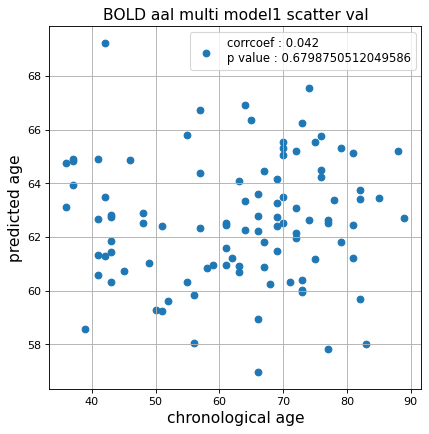

r^2 val data:  -0.012883801283819496


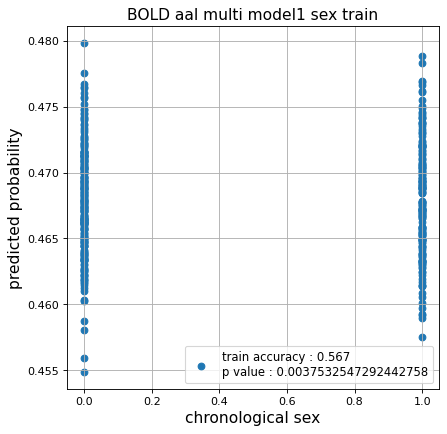

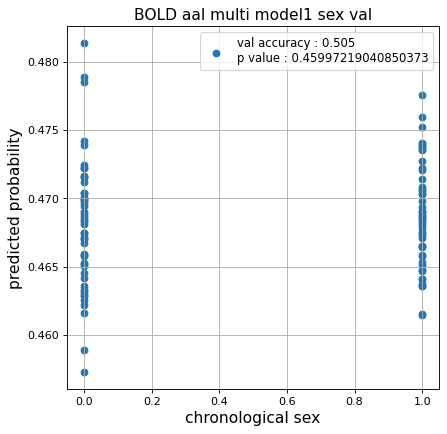

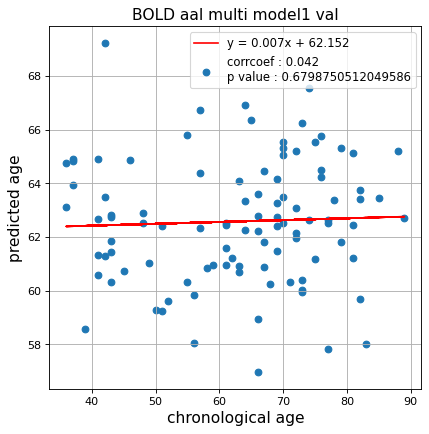

切片: 62.152008346703624
傾き: 0.0068413769573019865
save_epochs:0


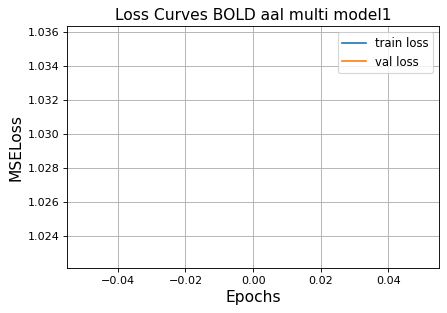

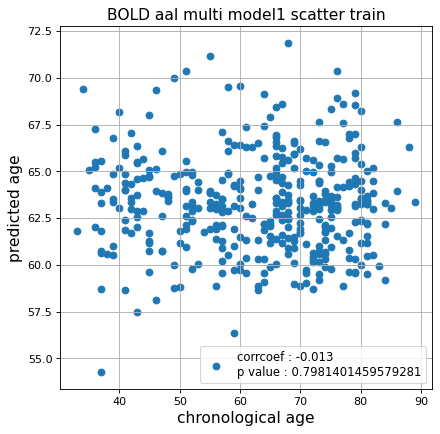

r^2 train data:  -0.042736452736358066


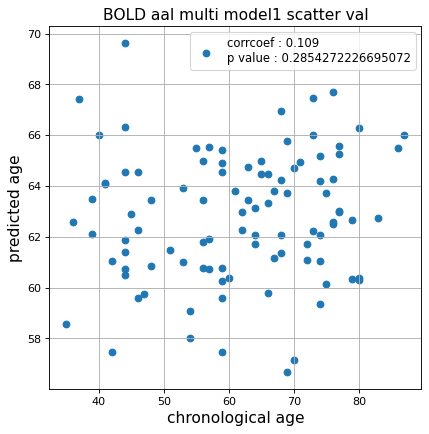

r^2 val data:  -0.005774228226602451


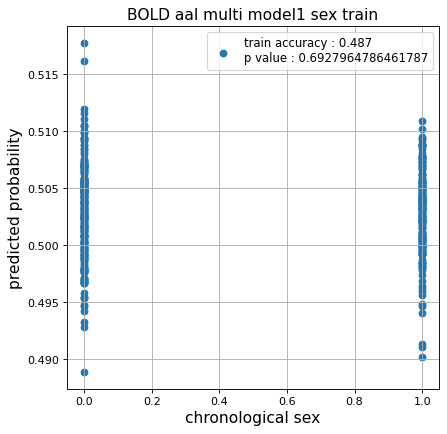

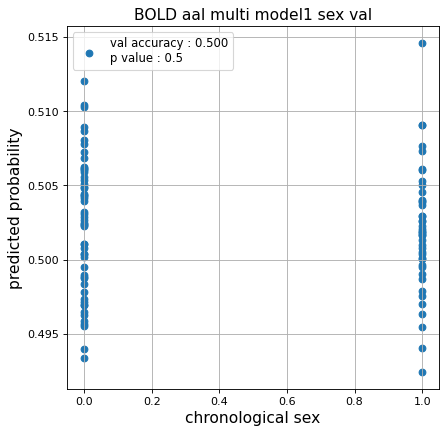

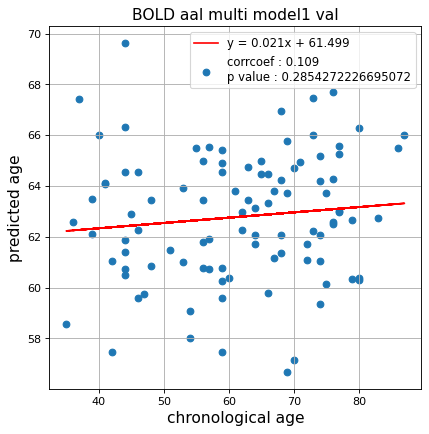

切片: 61.49858054335162
傾き: 0.020877424508799636
save_epochs:0


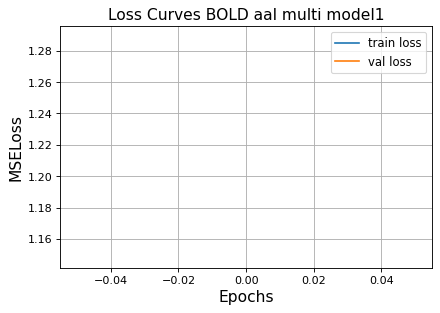

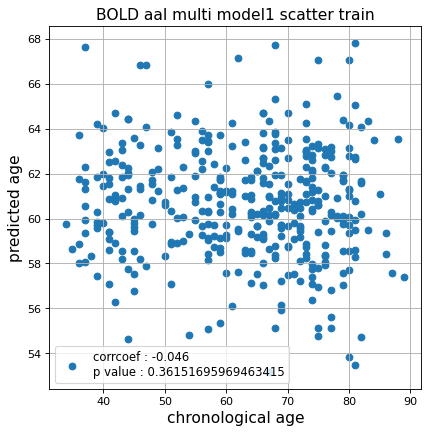

r^2 train data:  -0.07222497119783511


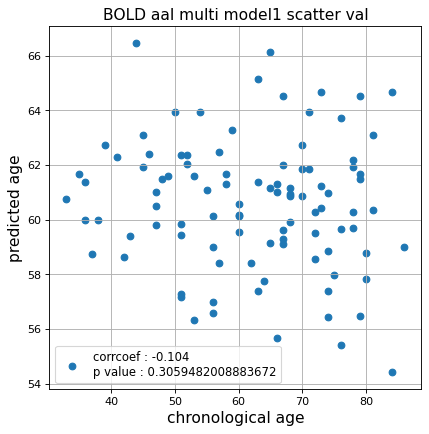

r^2 val data:  -0.0808984890719342


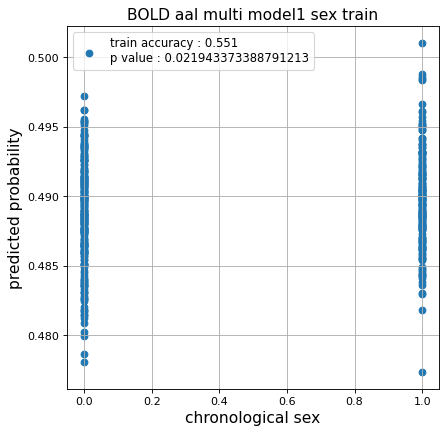

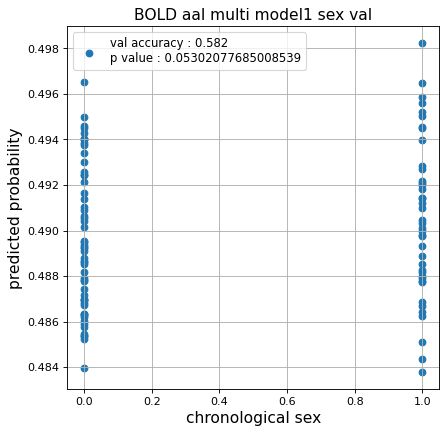

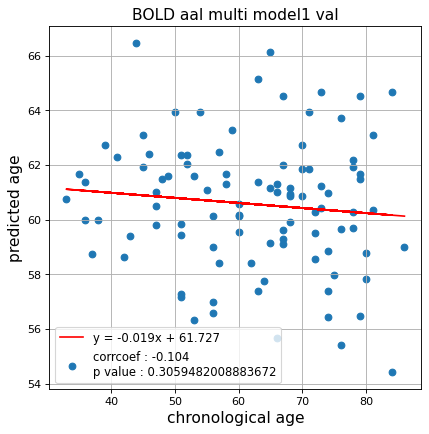

切片: 61.72687057358239
傾き: -0.018574404592513374
save_epochs:0


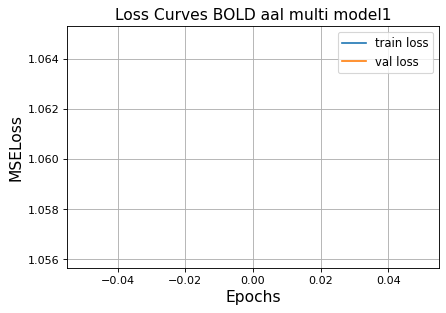

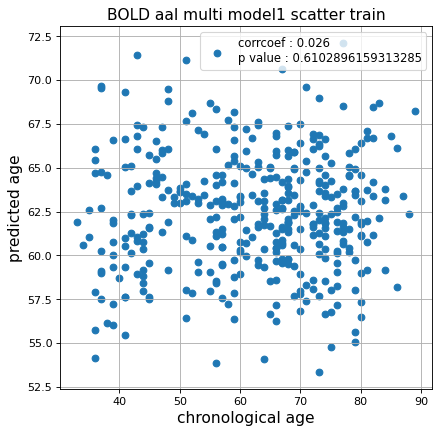

r^2 train data:  -0.04834880148169041


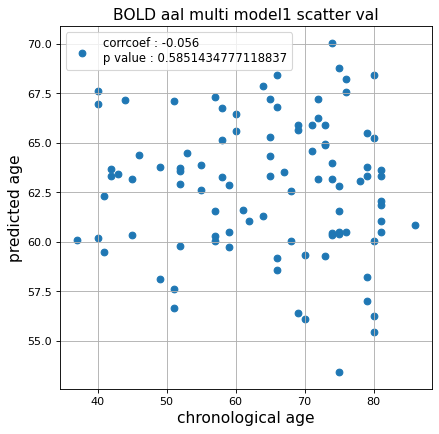

r^2 val data:  -0.12159650435139402


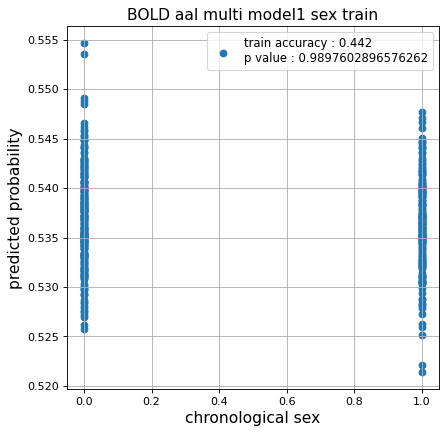

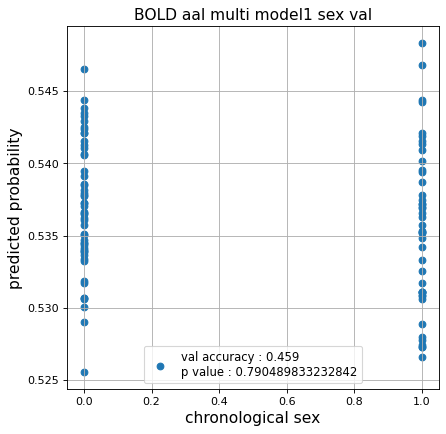

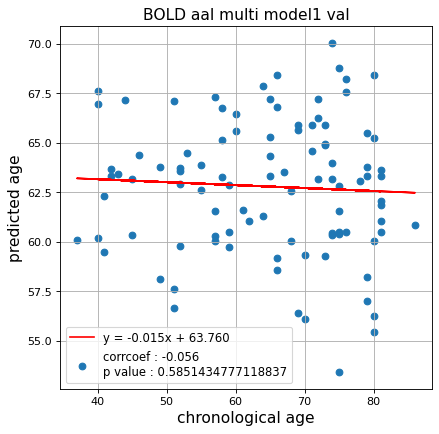

切片: 63.76000011016297
傾き: -0.014860167018010002
Nested Kfold ::: 4
save_epochs:0


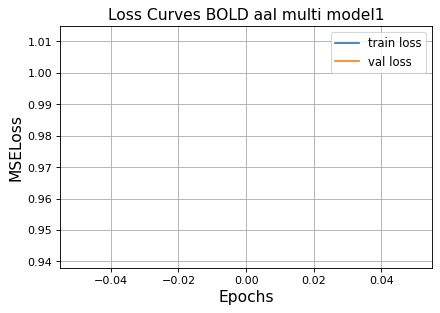

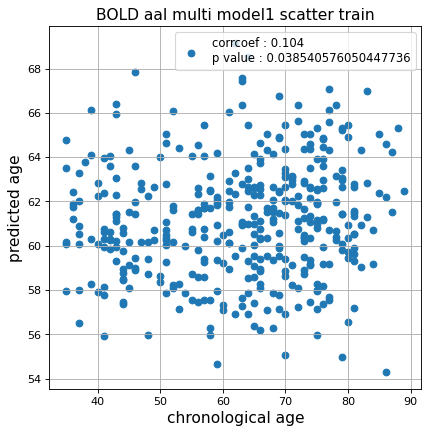

r^2 train data:  -0.008878456079889796


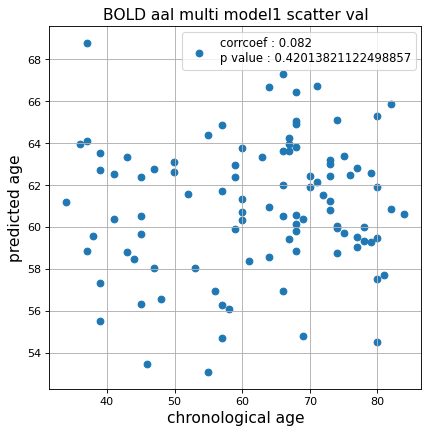

r^2 val data:  -0.020108423200555725


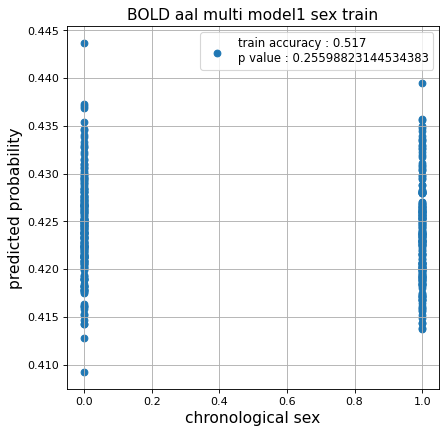

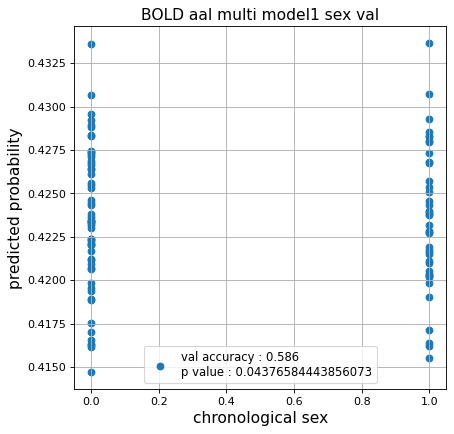

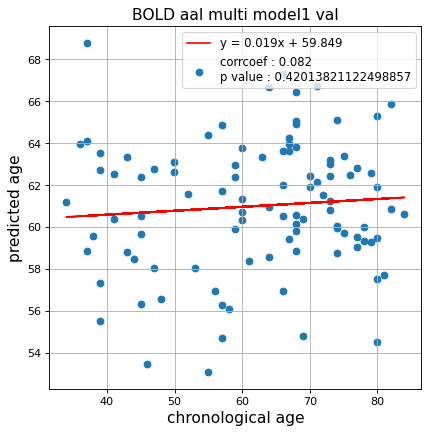

切片: 59.84904028559897
傾き: 0.018681573298091426
save_epochs:0


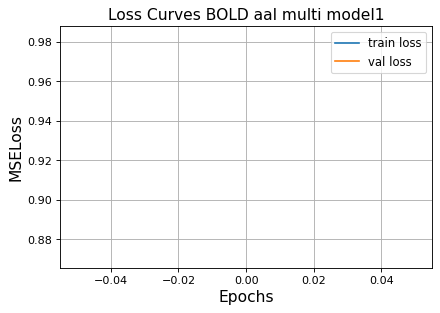

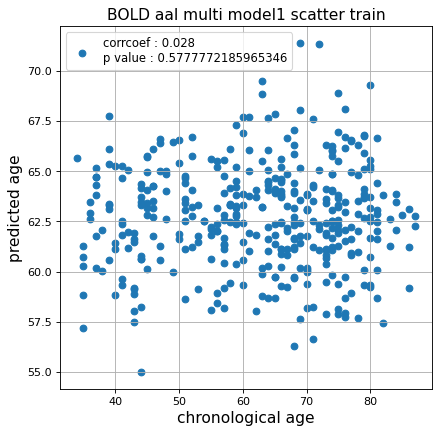

r^2 train data:  -0.02606227002124295


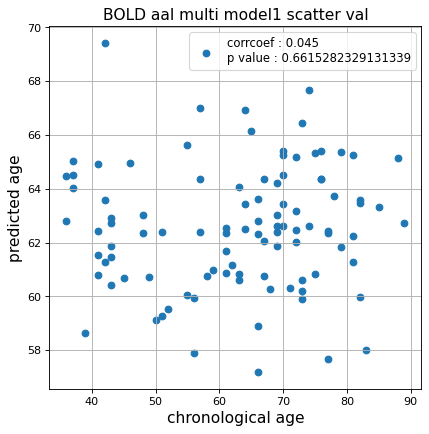

r^2 val data:  -0.012015241019197376


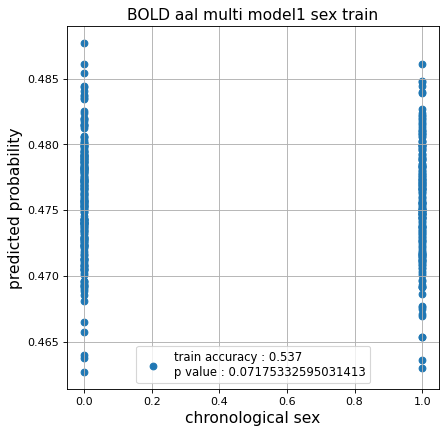

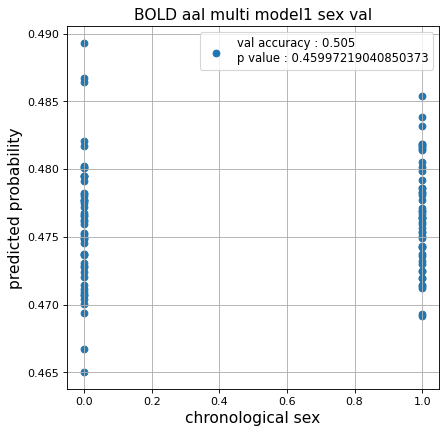

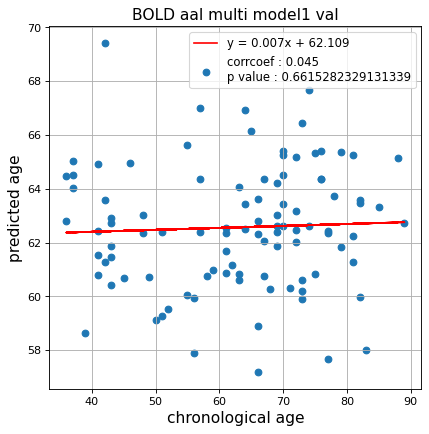

切片: 62.109074216731976
傾き: 0.007249619955207691
save_epochs:0


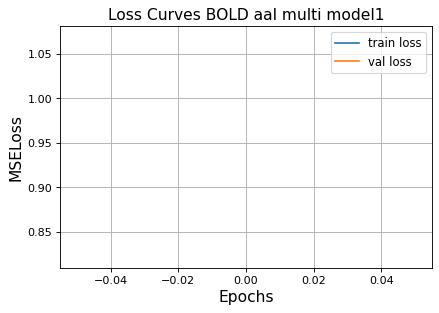

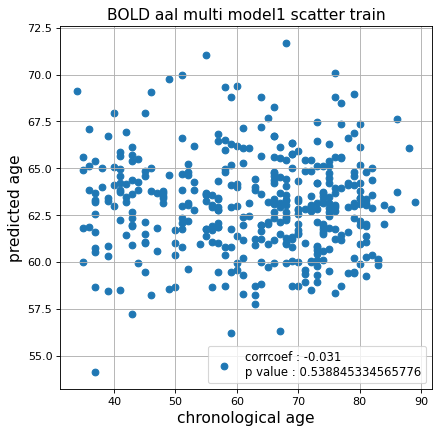

r^2 train data:  -0.04930662930115903


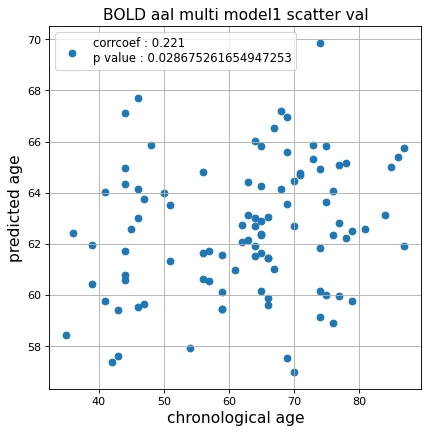

r^2 val data:  0.04811224458444119


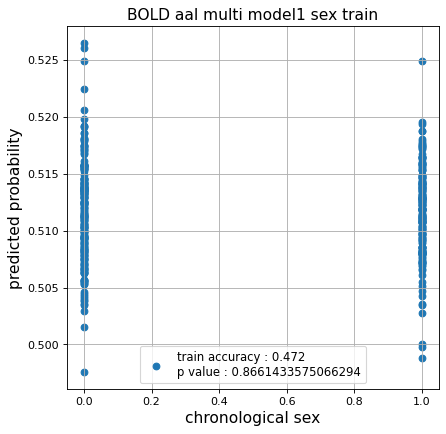

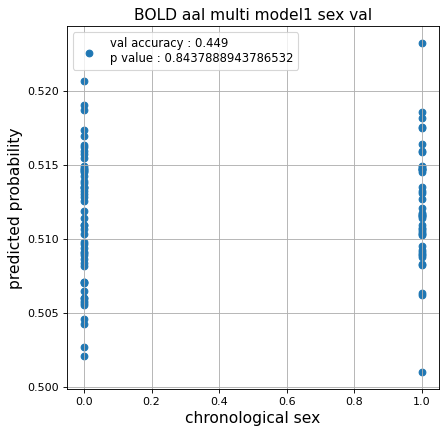

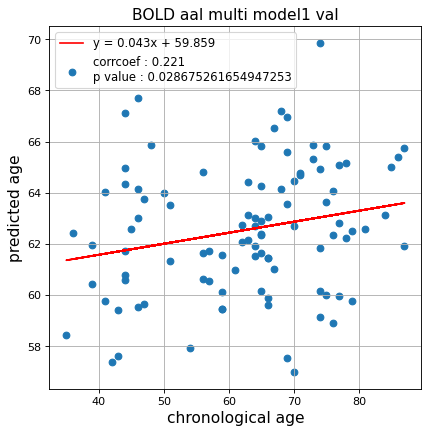

切片: 59.85946398510215
傾き: 0.04298592567522326
save_epochs:0


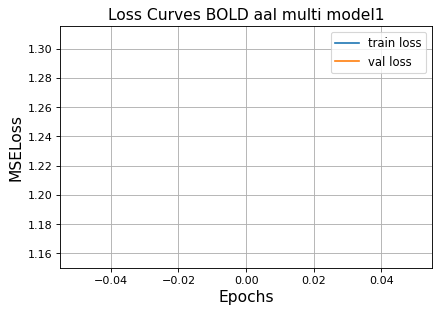

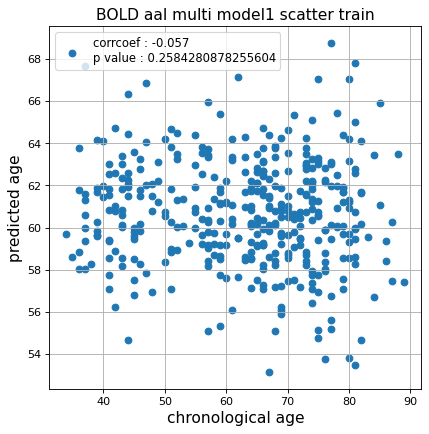

r^2 train data:  -0.0854113767900444


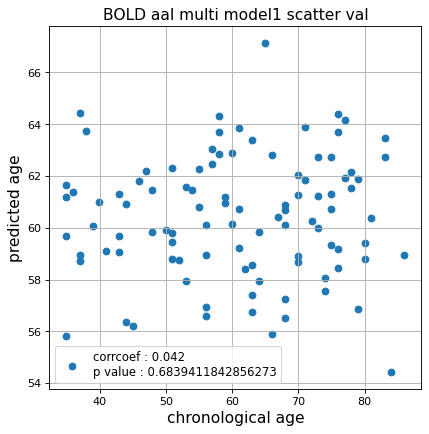

r^2 val data:  -0.01495584532857186


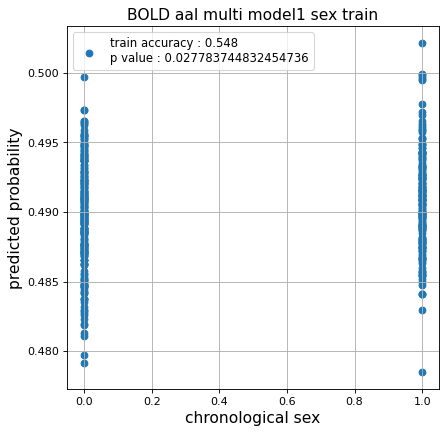

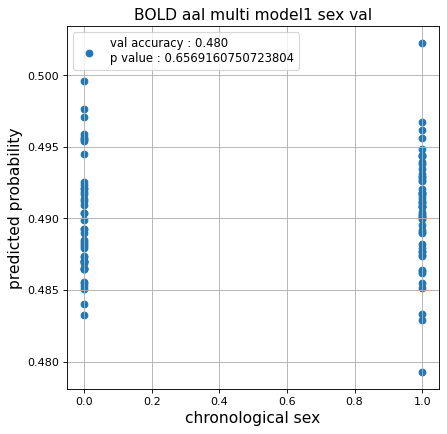

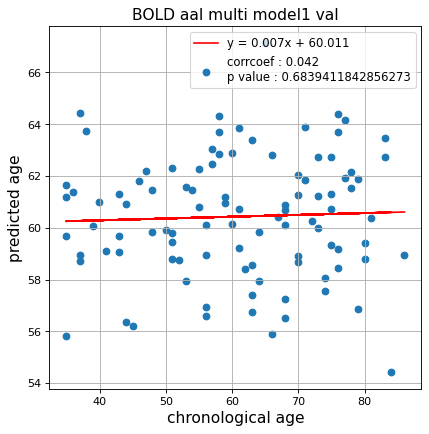

切片: 60.011138521725584
傾き: 0.00698551112912091
save_epochs:0


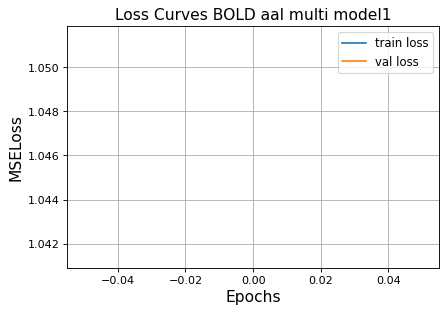

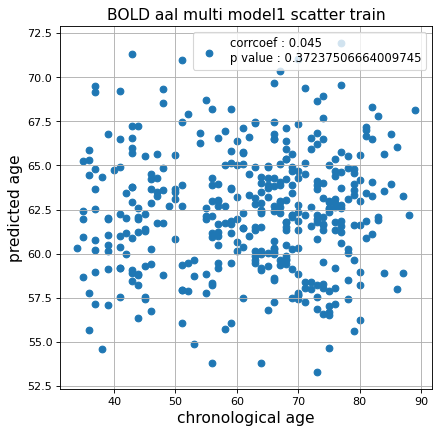

r^2 train data:  -0.039550698352736946


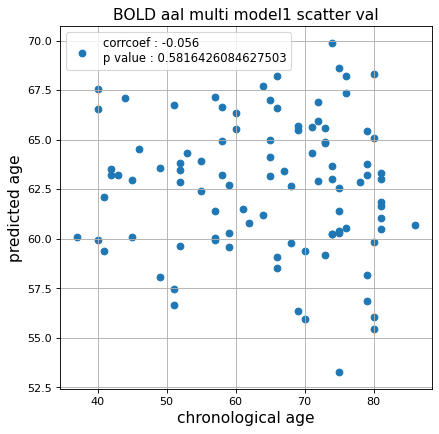

r^2 val data:  -0.1242871816579234


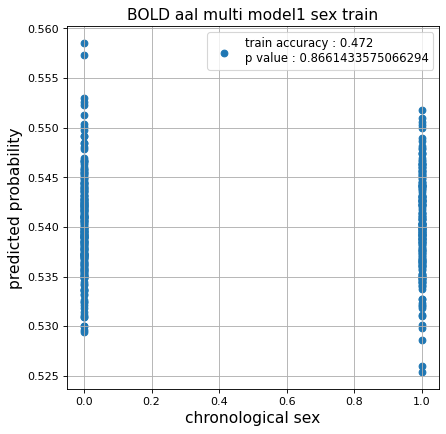

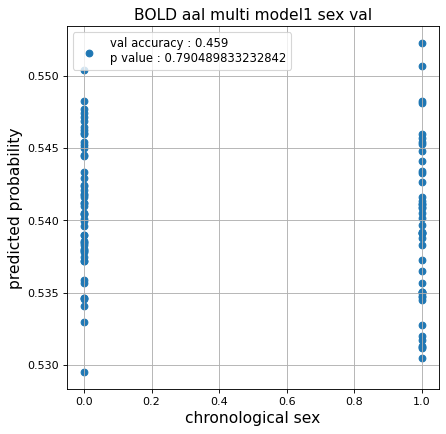

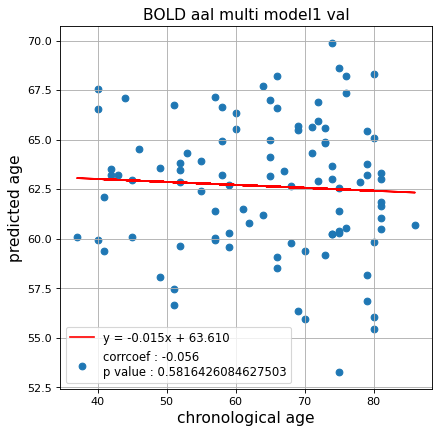

切片: 63.60995440966408
傾き: -0.014894216003989625
Nested Kfold ::: 5
save_epochs:0


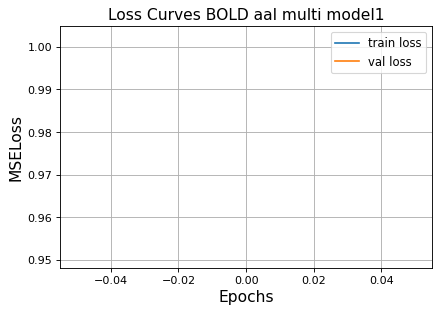

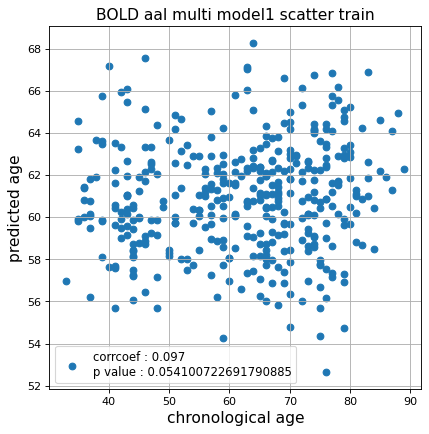

r^2 train data:  -0.0062439006958967536


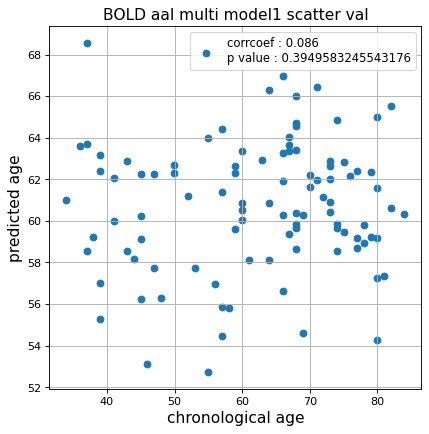

r^2 val data:  -0.021368656457560142


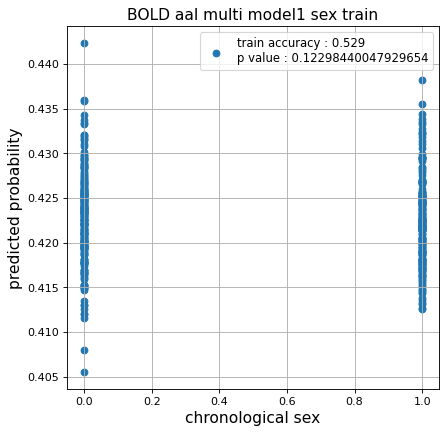

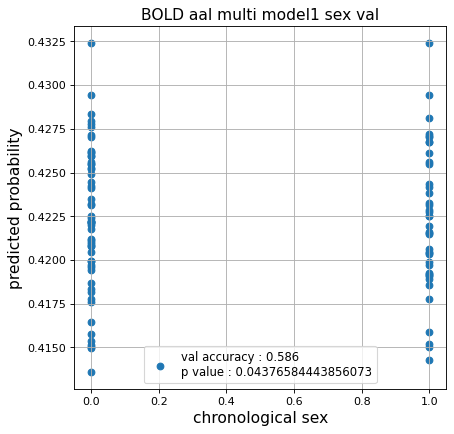

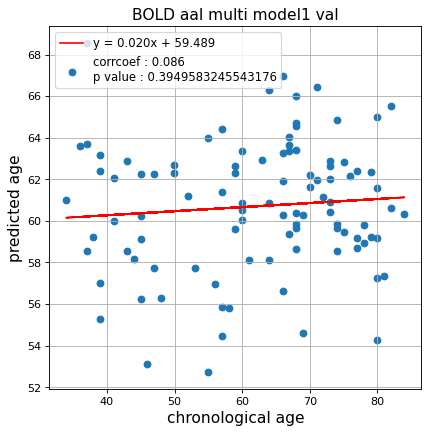

切片: 59.4889122023052
傾き: 0.0195560349140254
save_epochs:0


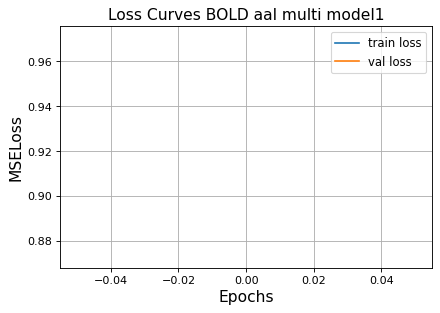

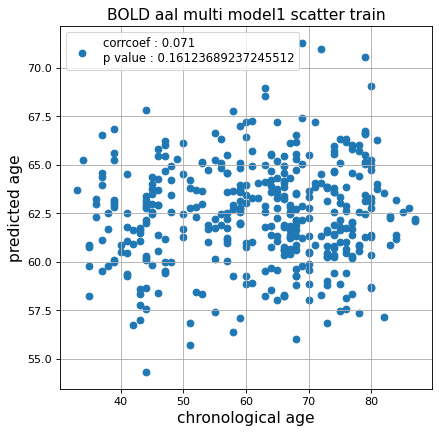

r^2 train data:  -0.012837806642280292


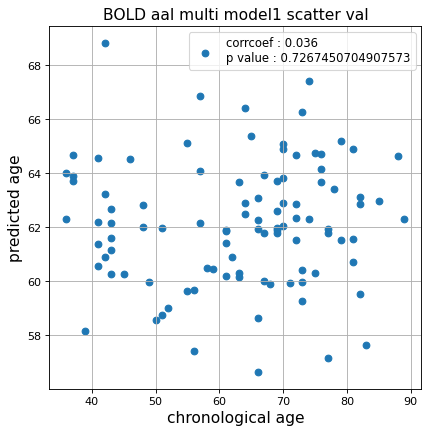

r^2 val data:  -0.016220061385813


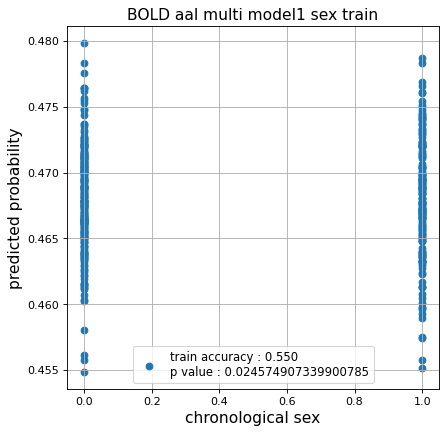

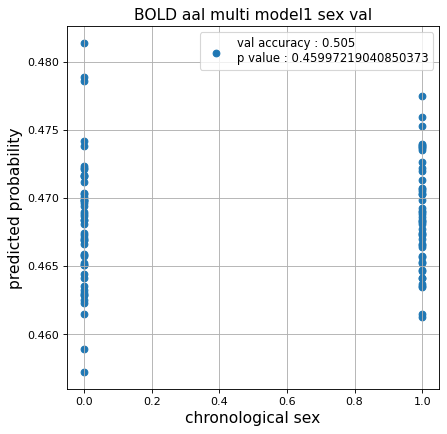

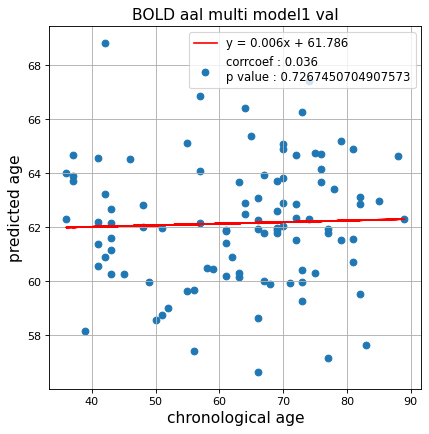

切片: 61.78606621350982
傾き: 0.005802333818356253
save_epochs:0


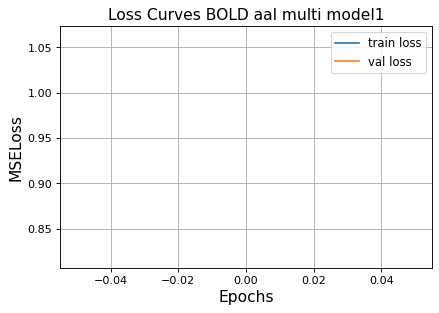

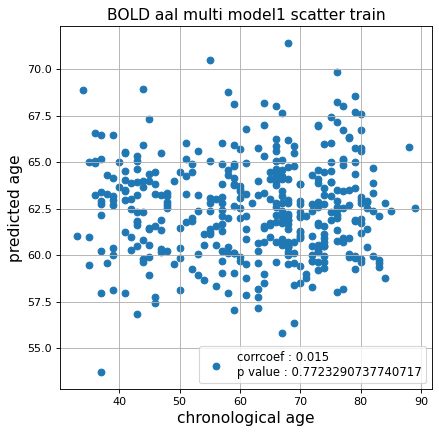

r^2 train data:  -0.03314299839461321


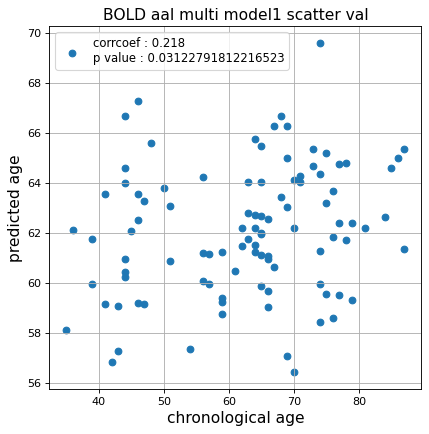

r^2 val data:  0.046248768675552276


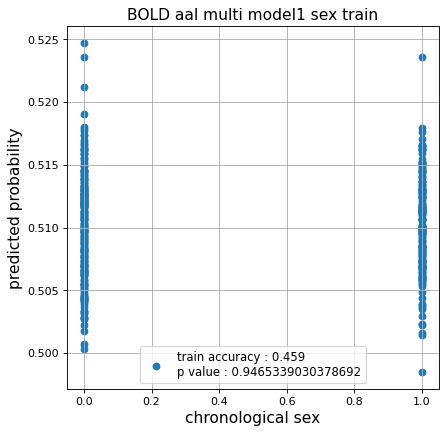

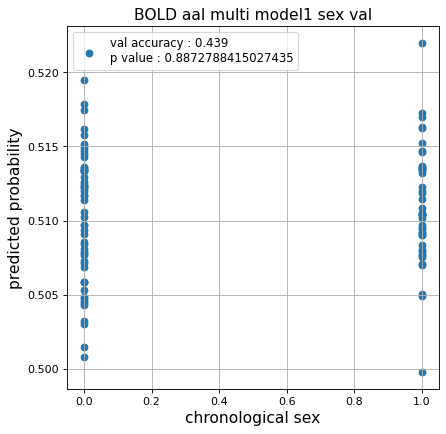

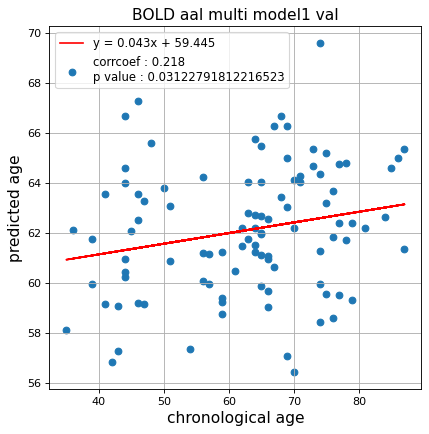

切片: 59.44541444815956
傾き: 0.042507572018572616
save_epochs:0


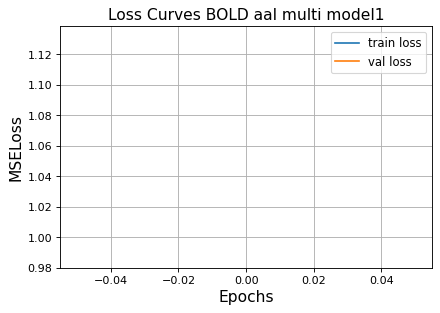

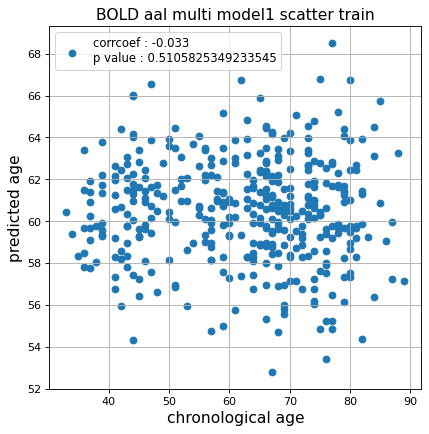

r^2 train data:  -0.06292879268501061


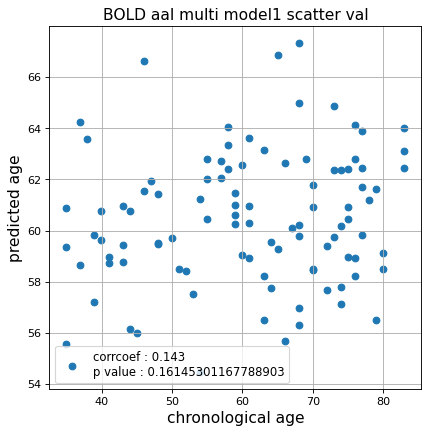

r^2 val data:  0.016216708355092035


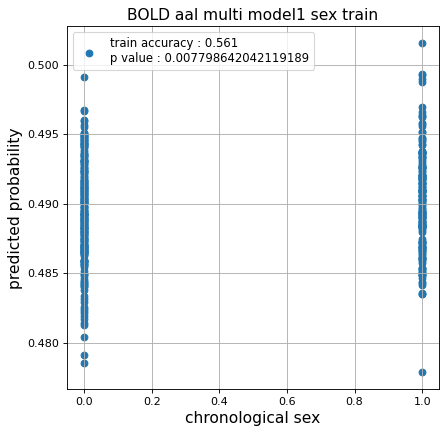

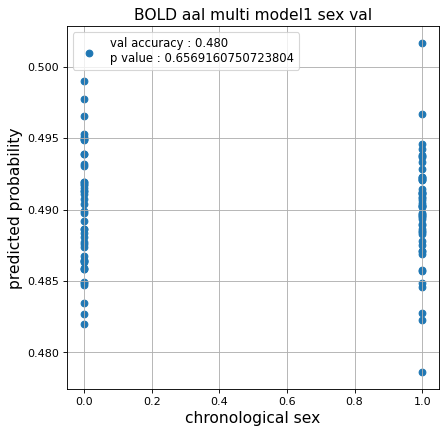

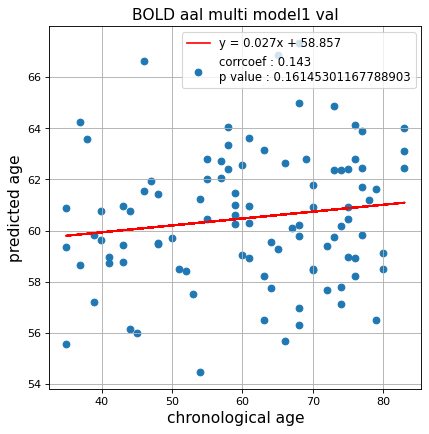

切片: 58.85650983342861
傾き: 0.026923234184148485
save_epochs:0


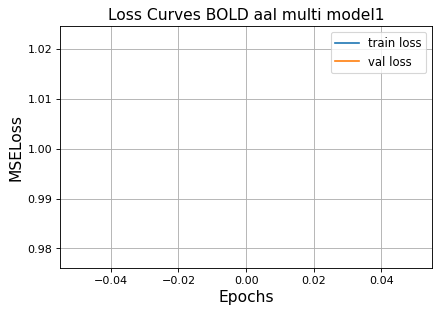

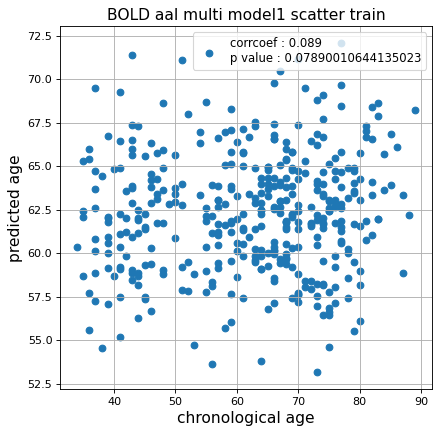

r^2 train data:  -0.018438698846754198


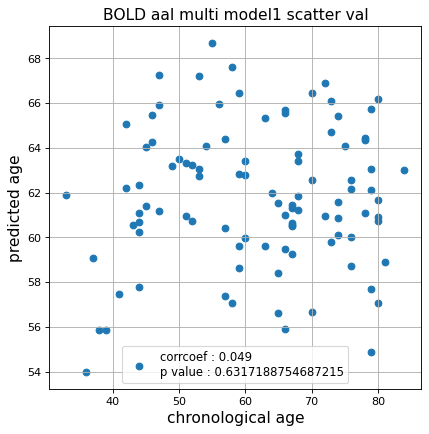

r^2 val data:  -0.032366556652614786


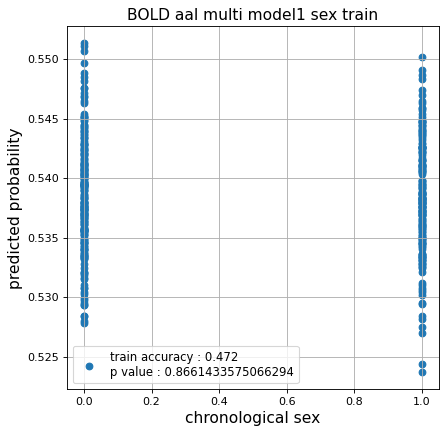

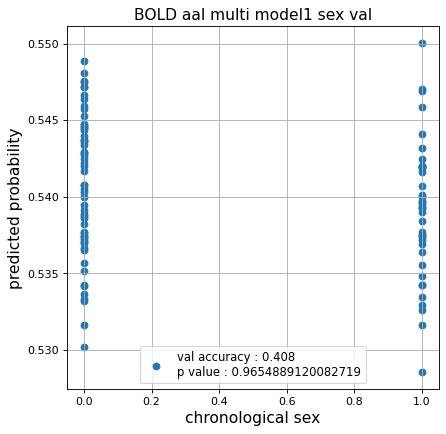

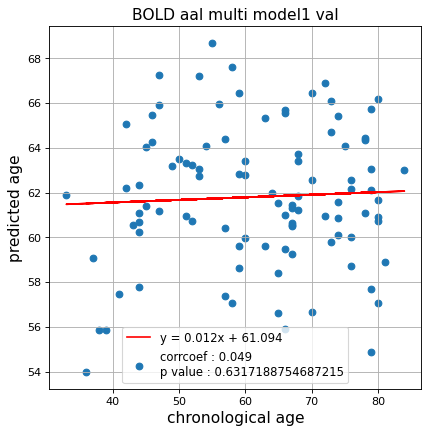

切片: 61.09449478119888
傾き: 0.011542704507676943
CPU times: user 1min 13s, sys: 7.7 s, total: 1min 21s
Wall time: 1min 7s


In [21]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_all_1  = []
test_pred_aal_all_inverse_1  = []
test_label_aal_all_1 = []

test_idx_aal_all_1   = []
train_idx_aal_all_1  = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_inverse,test_label = train_model(data_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1,
                                                           d_model    = 256,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 1024,
                                                           nhead      = 32,
                                                           hidden_dim_transformer = 2,
                                                           pos_drop    = 0.1,
                                                           trans_drop = 0.2,
                                                           fc_drop = 0.1,
                                                           title = 'BOLD aal multi model1'
                                                          )
    
    test_pred_aal_all_1.append(test_pred)
    test_pred_aal_all_inverse_1.append(test_pred_inverse)
    test_label_aal_all_1.append(test_label)

    test_idx_aal_all_1.append(test_idx)
    train_idx_aal_all_1.append(train_idx)

### Bold 2

Nested Kfold ::: 1
save_epochs:0


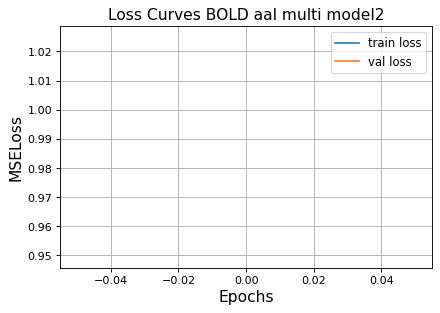

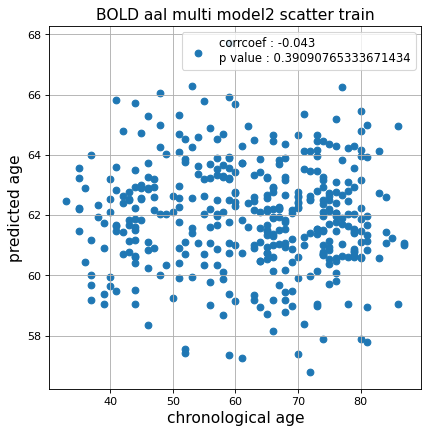

r^2 train data:  -0.03018280338666446


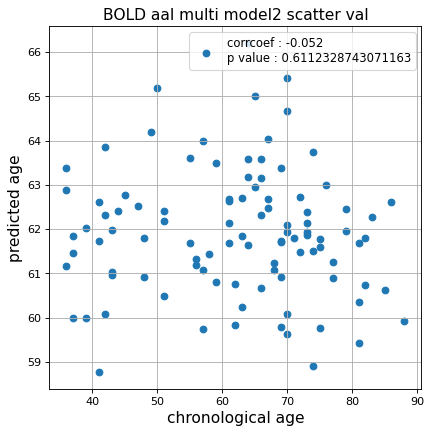

r^2 val data:  -0.021317038943347688


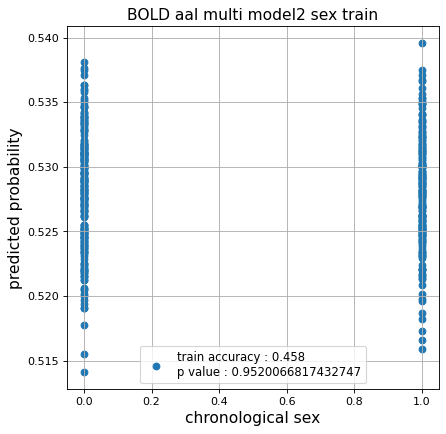

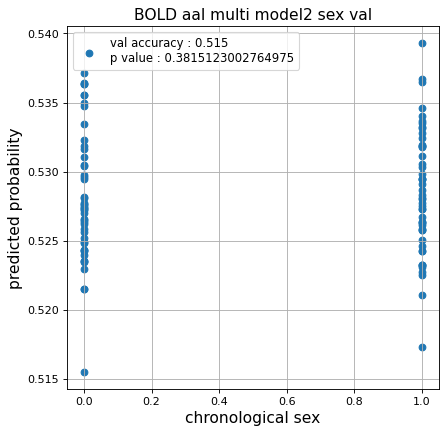

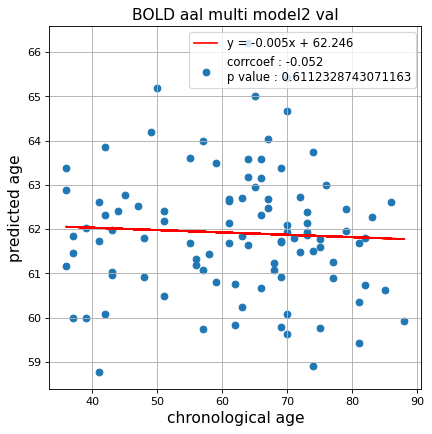

切片: 62.24604798741402
傾き: -0.005335187730548875
save_epochs:0


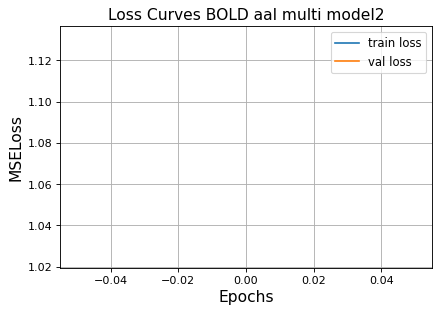

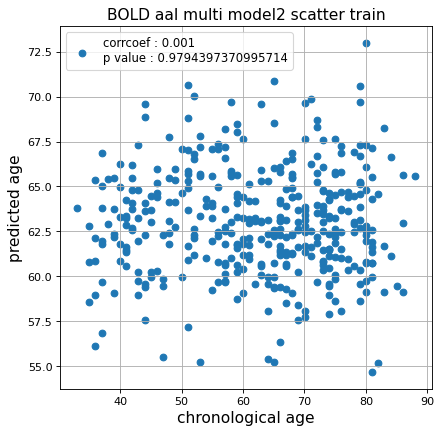

r^2 train data:  -0.05097886958989539


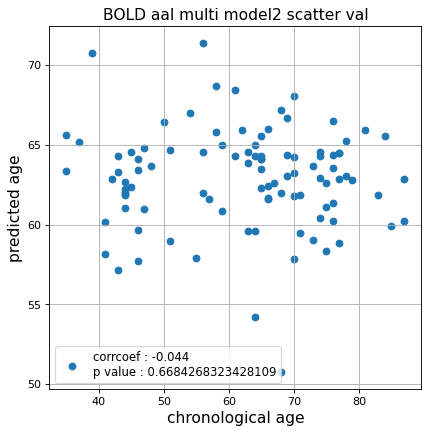

r^2 val data:  -0.07747777375804143


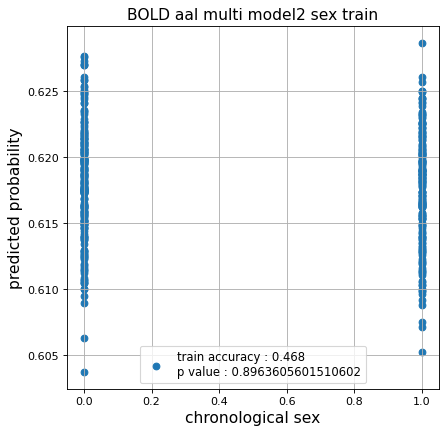

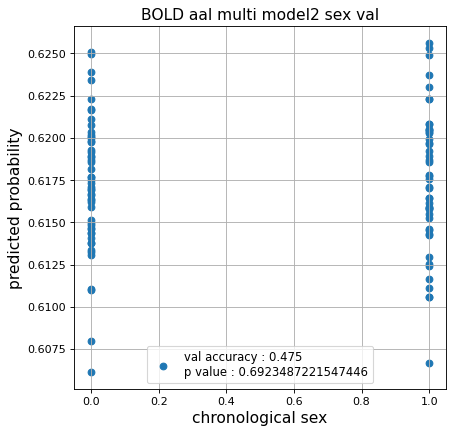

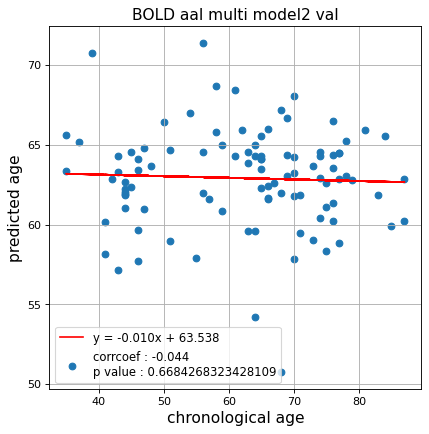

切片: 63.537507154176815
傾き: -0.010101831523784655
save_epochs:0


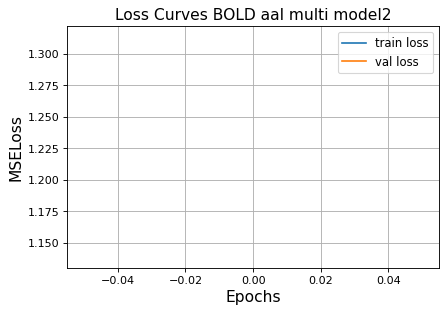

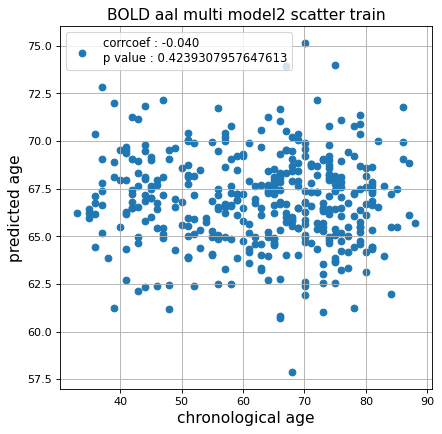

r^2 train data:  -0.14478256166568704


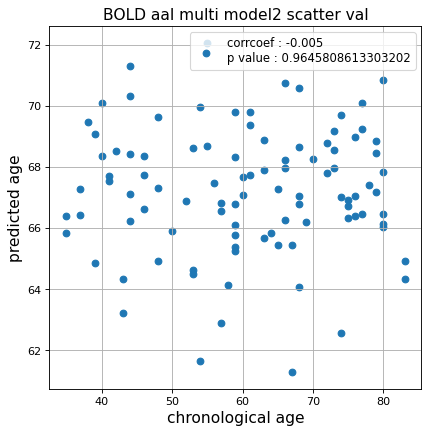

r^2 val data:  -0.26305754379166024


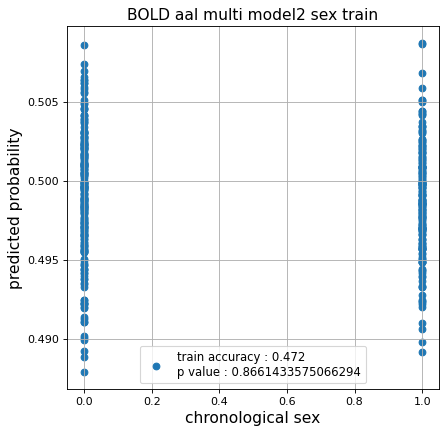

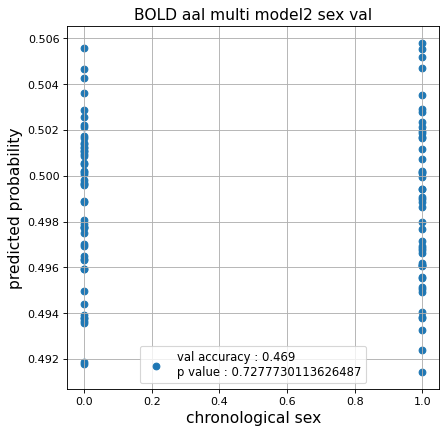

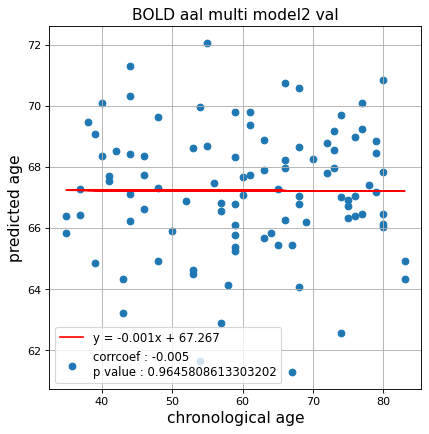

切片: 67.26699703307118
傾き: -0.000693046892947876
save_epochs:0


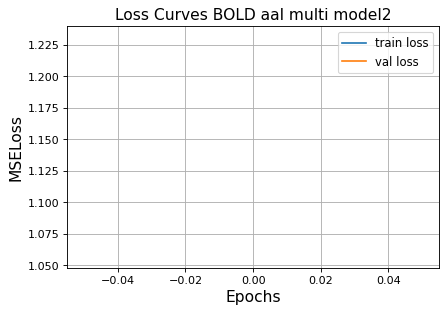

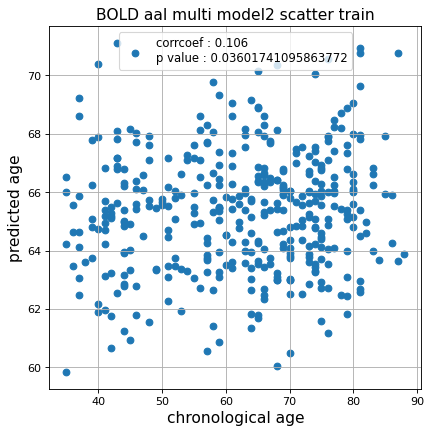

r^2 train data:  -0.041915123395537046


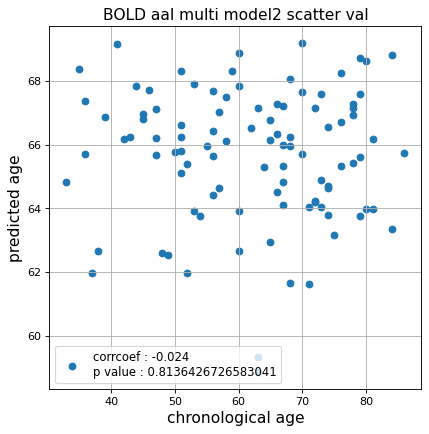

r^2 val data:  -0.10680743074952526


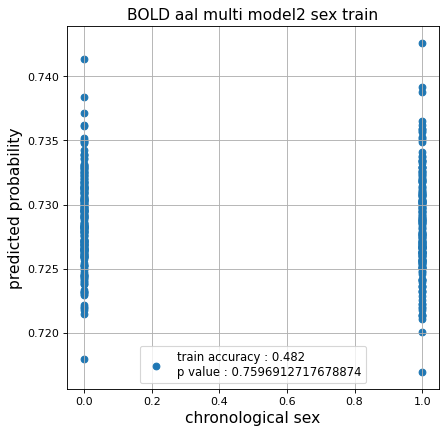

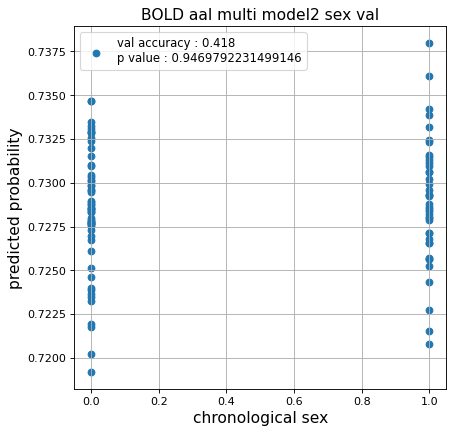

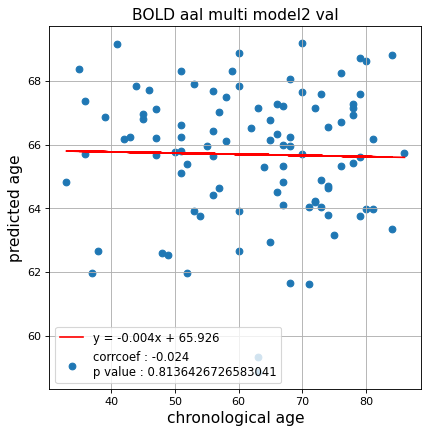

切片: 65.92587055901718
傾き: -0.0037313396999668043
save_epochs:0


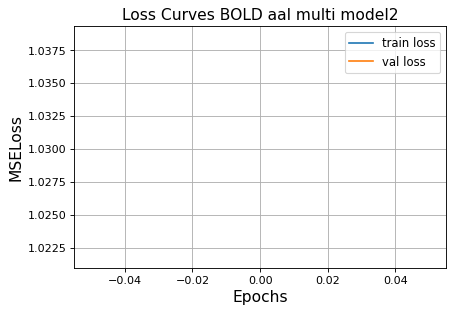

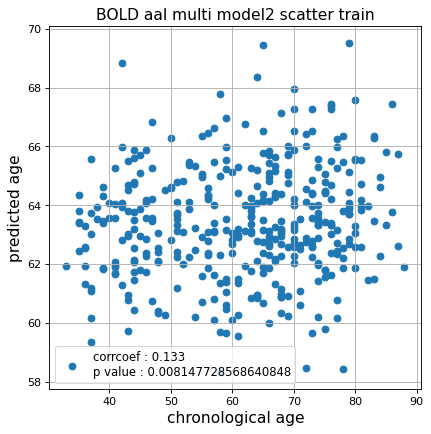

r^2 train data:  0.0012234512704600853


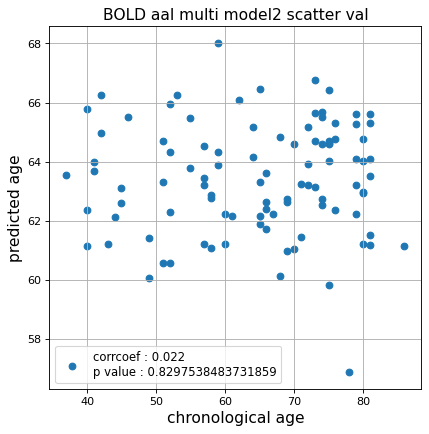

r^2 val data:  -0.02434957840685037


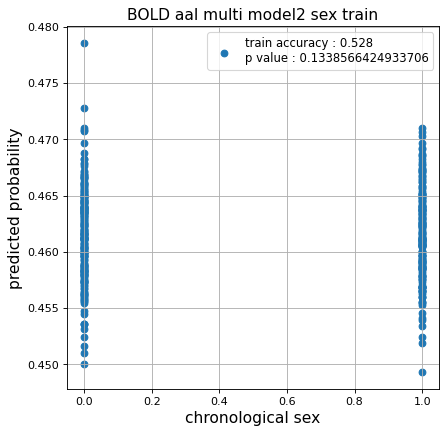

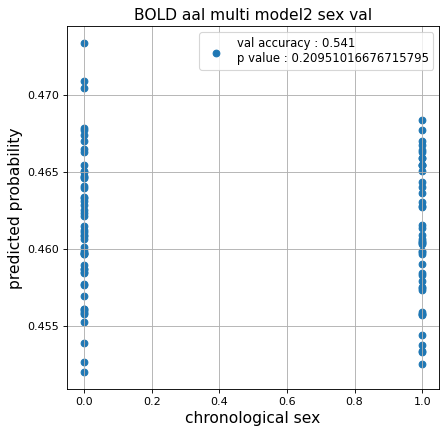

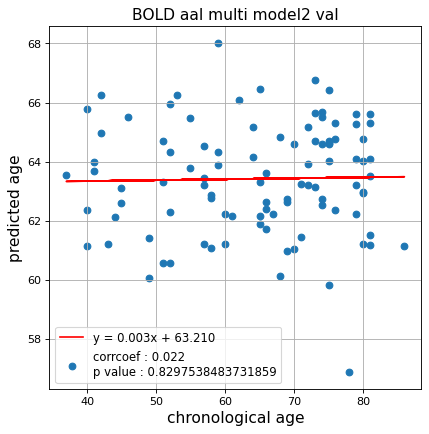

切片: 63.210192391449546
傾き: 0.0032291083699874513
Nested Kfold ::: 2
save_epochs:0


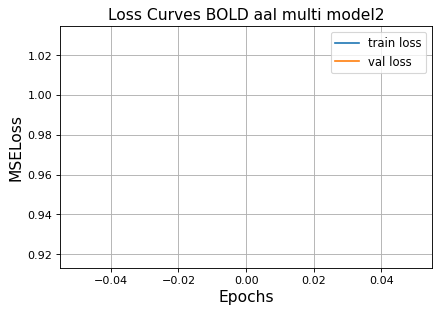

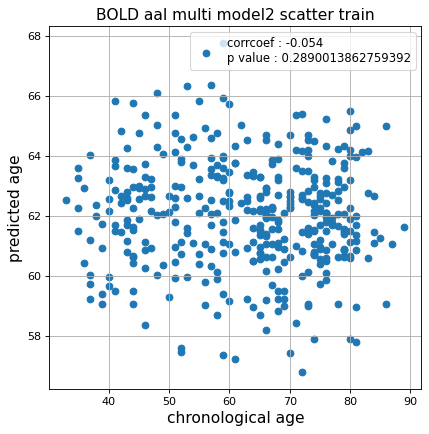

r^2 train data:  -0.03576684420557674


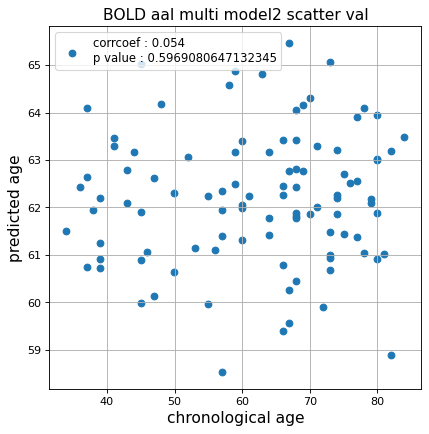

r^2 val data:  0.00043840213541845863


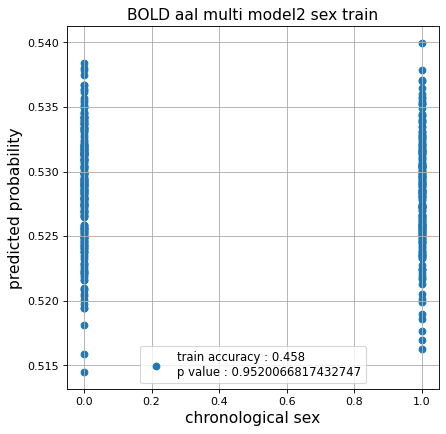

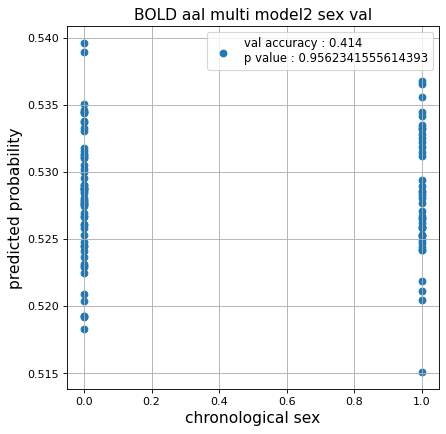

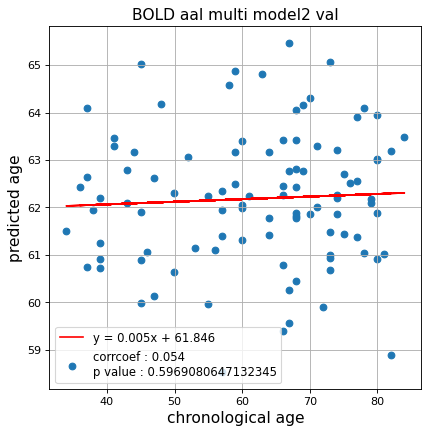

切片: 61.84555413373497
傾き: 0.005479217852224671
save_epochs:0


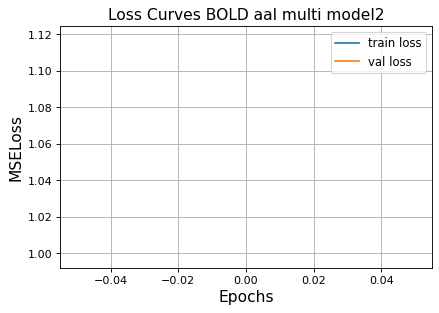

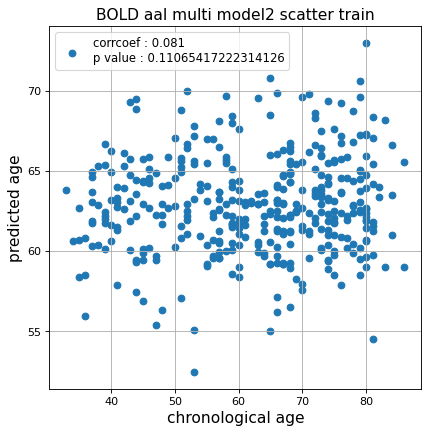

r^2 train data:  -0.01657942822244607


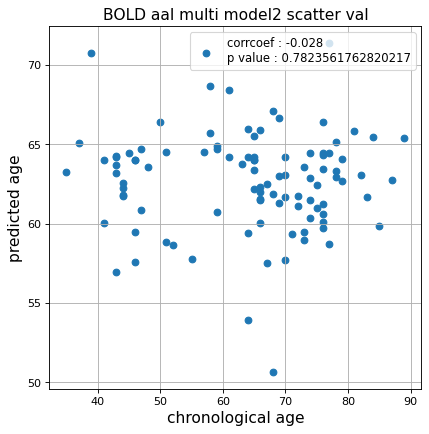

r^2 val data:  -0.07408345290364116


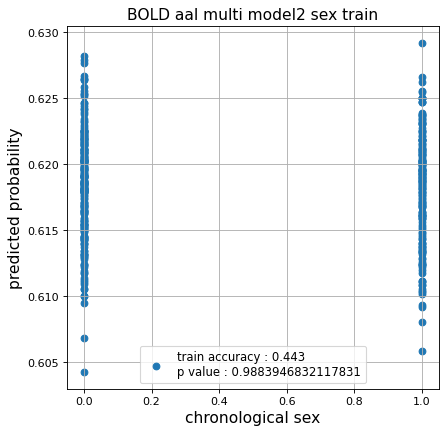

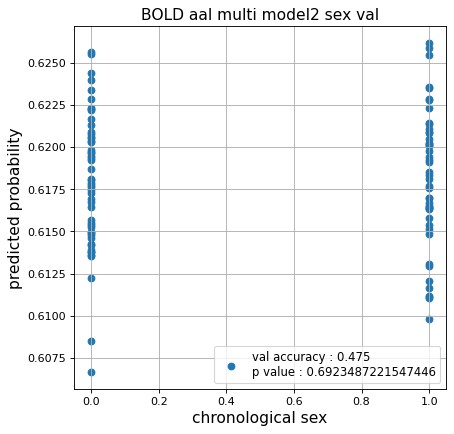

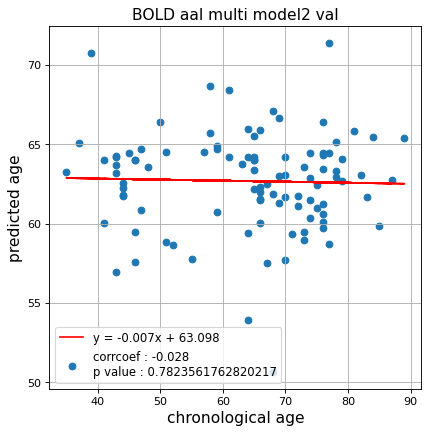

切片: 63.09824619030074
傾き: -0.006519410515800342
save_epochs:0


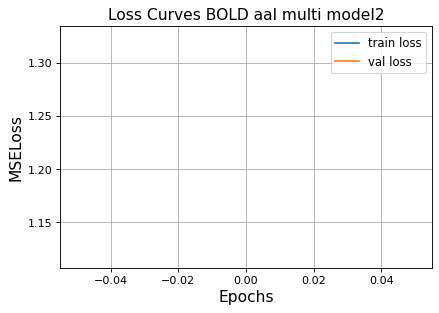

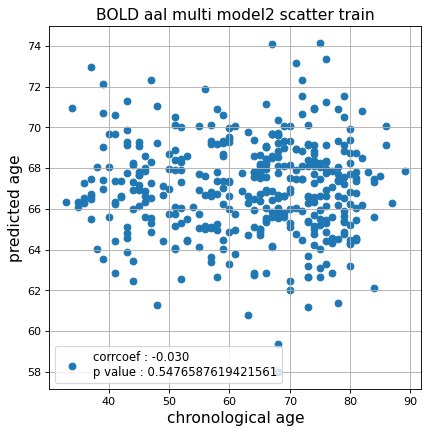

r^2 train data:  -0.12658838148607265


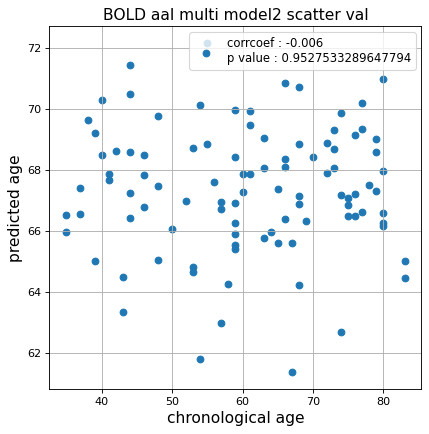

r^2 val data:  -0.27324866994626507


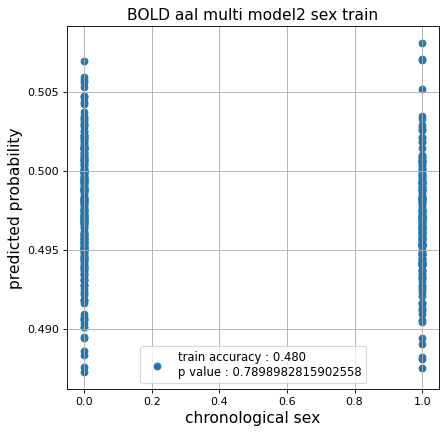

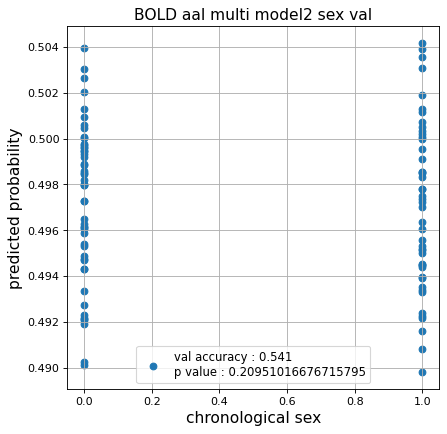

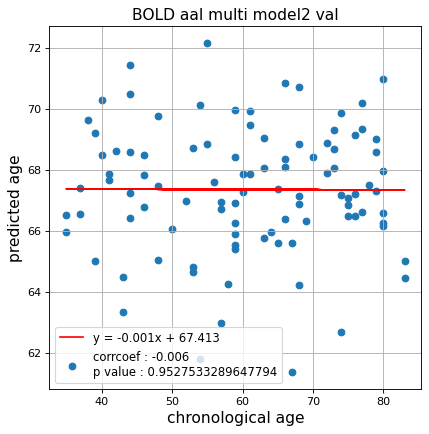

切片: 67.41313439196445
傾き: -0.0009263717411936264
save_epochs:0


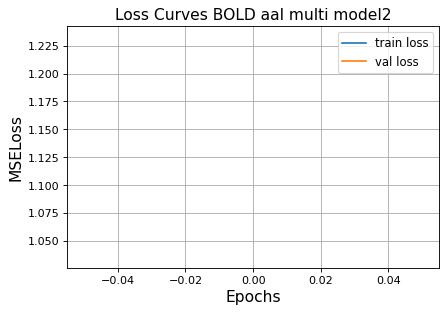

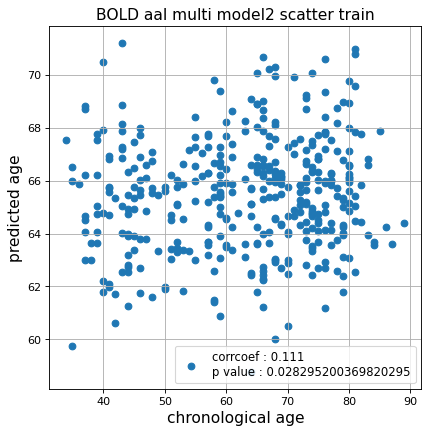

r^2 train data:  -0.03032872401967568


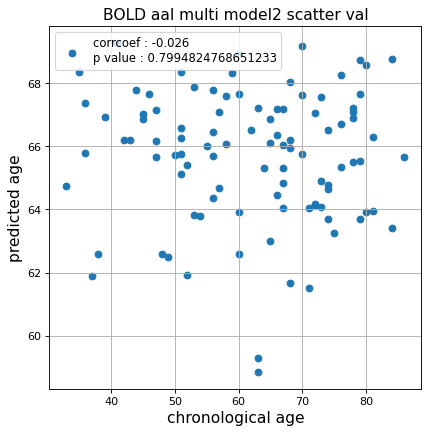

r^2 val data:  -0.10743594152934599


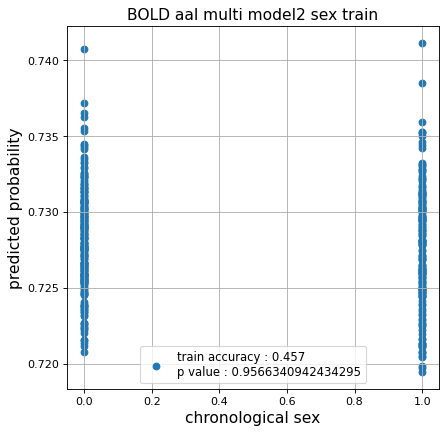

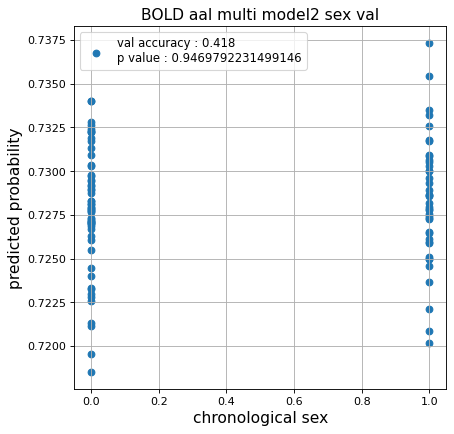

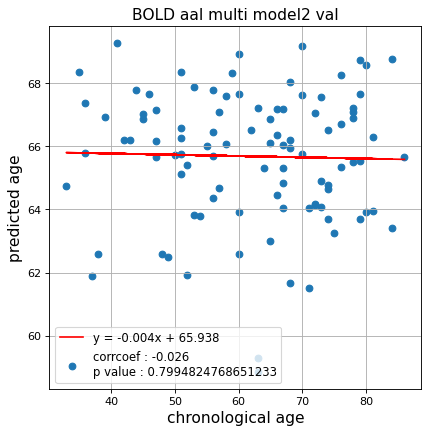

切片: 65.93789527223116
傾き: -0.004046546342629118
save_epochs:0


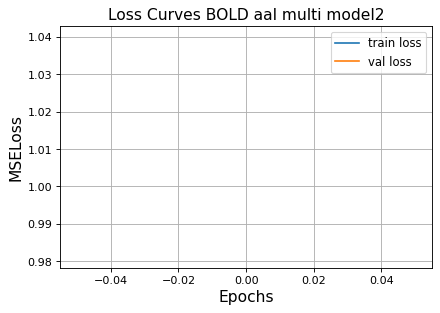

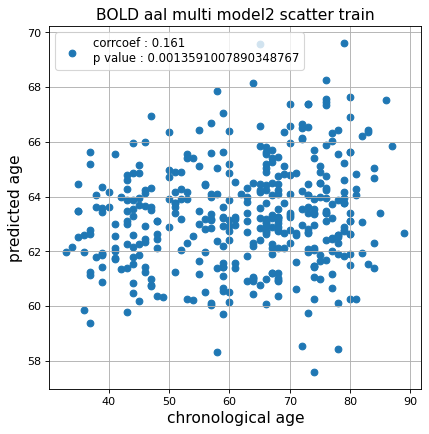

r^2 train data:  0.01797713706147175


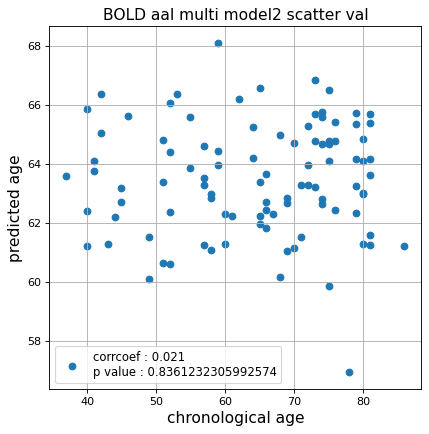

r^2 val data:  -0.023646436314801678


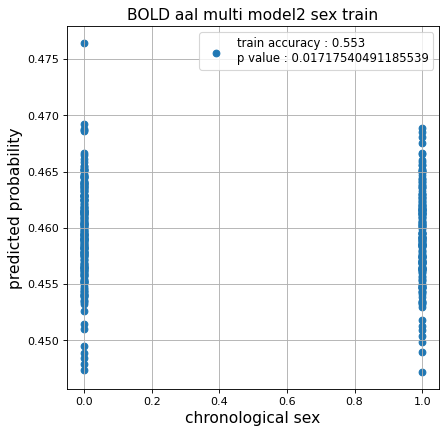

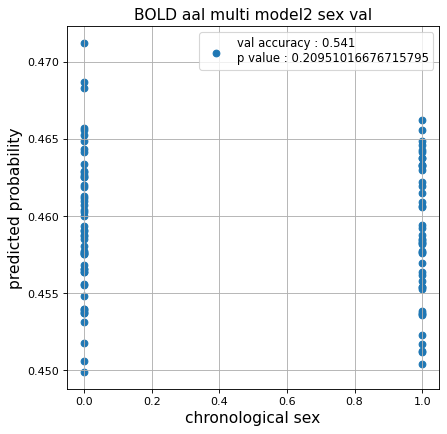

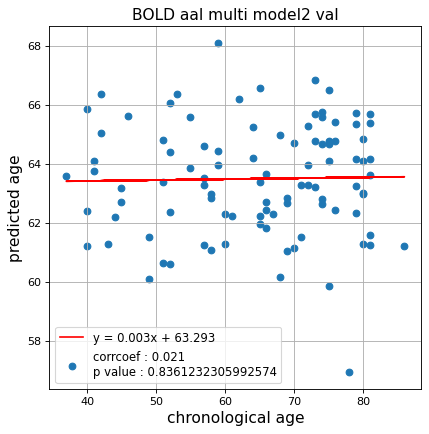

切片: 63.29280517054388
傾き: 0.0031198373730596664
Nested Kfold ::: 3
save_epochs:0


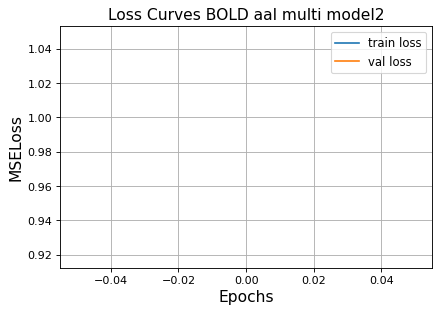

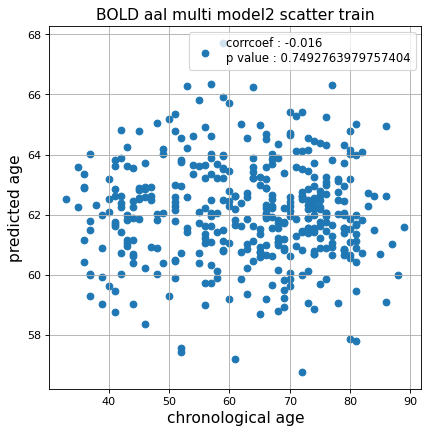

r^2 train data:  -0.022299232482430487


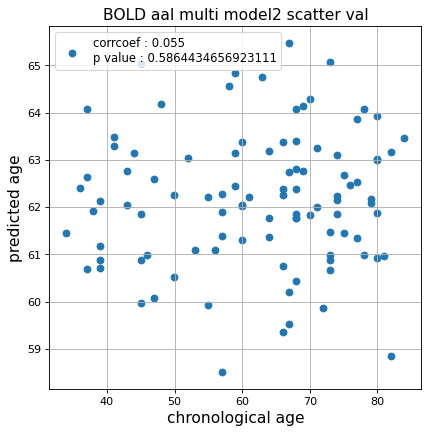

r^2 val data:  0.0007443089824472615


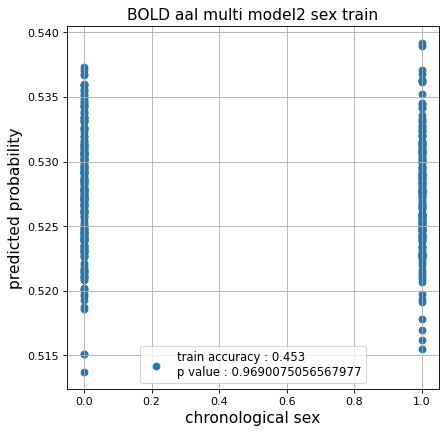

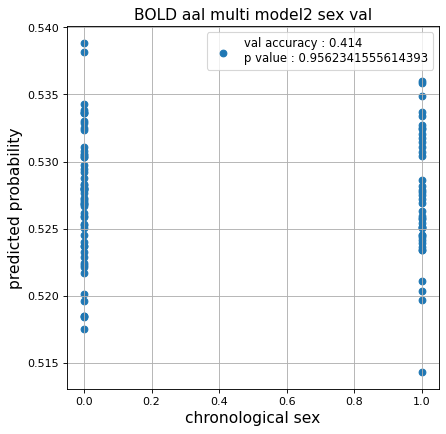

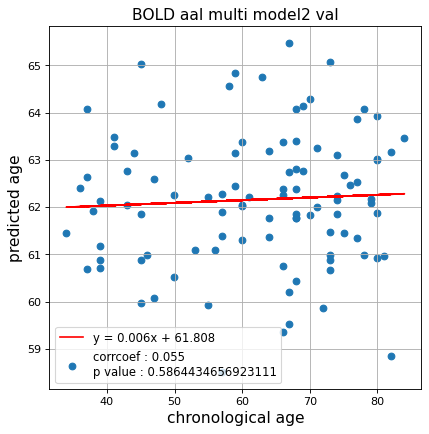

切片: 61.808478451939315
傾き: 0.005664983695745947
save_epochs:0


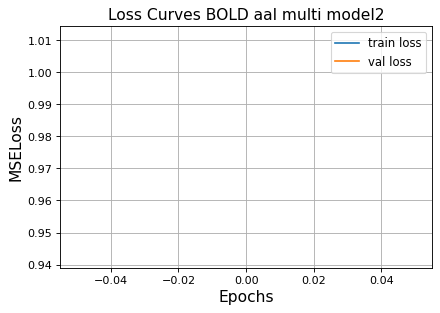

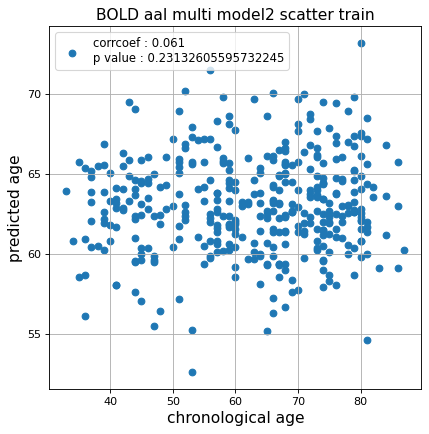

r^2 train data:  -0.026363697823814647


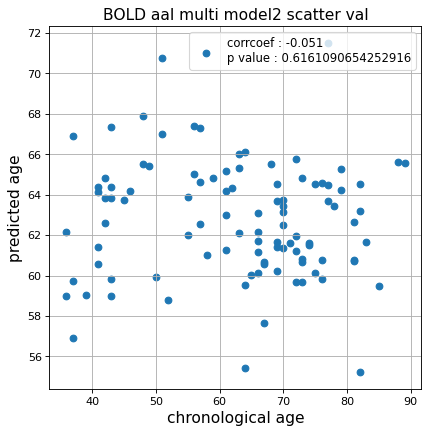

r^2 val data:  -0.06222571911345609


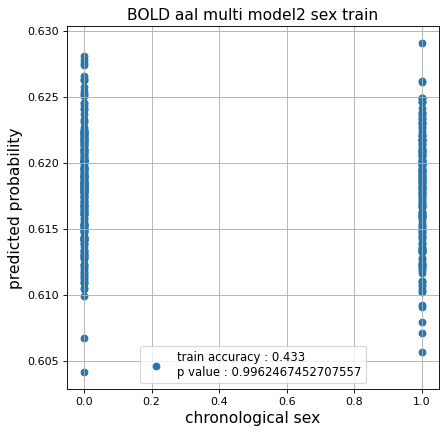

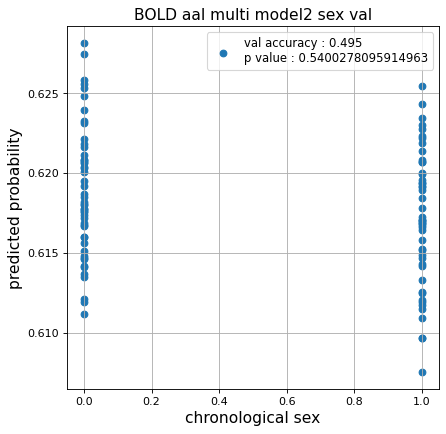

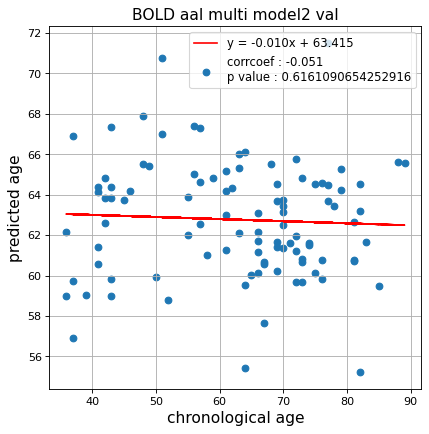

切片: 63.41500207599411
傾き: -0.010376550841560249
save_epochs:0


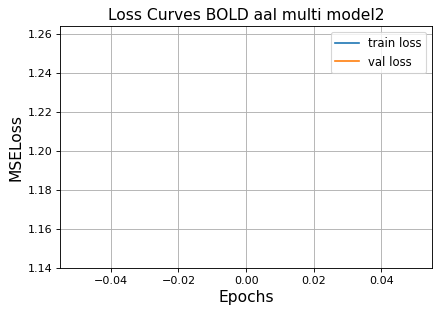

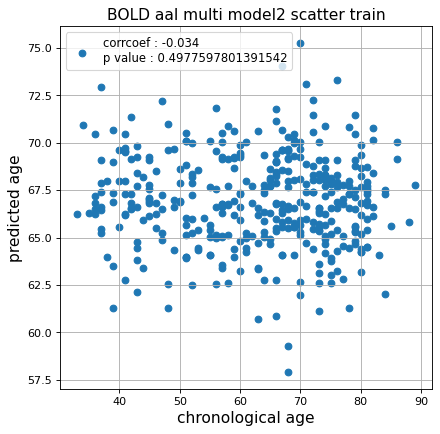

r^2 train data:  -0.13807533164868535


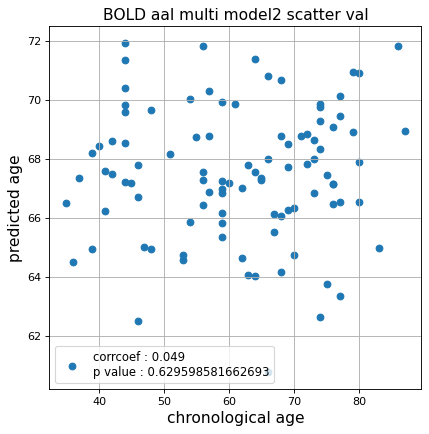

r^2 val data:  -0.22556655801881753


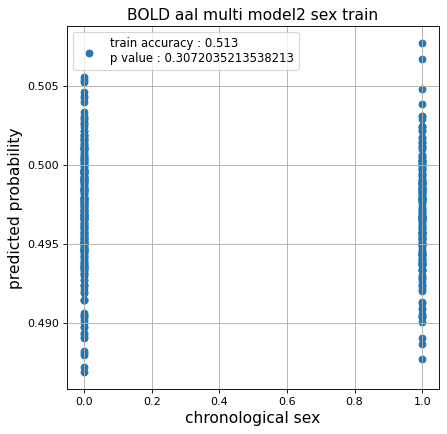

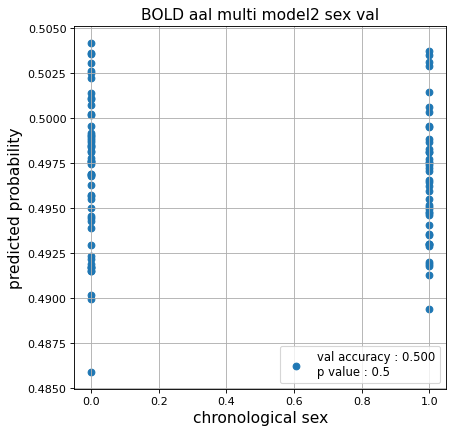

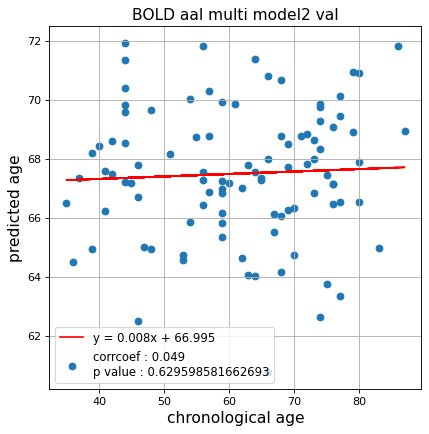

切片: 66.99536332211464
傾き: 0.008333108682655126
save_epochs:0


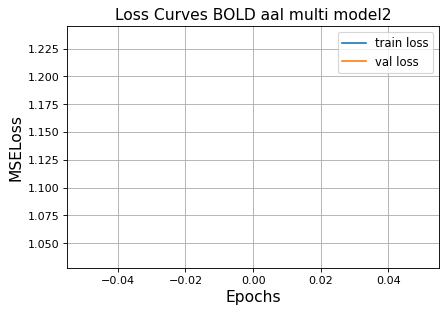

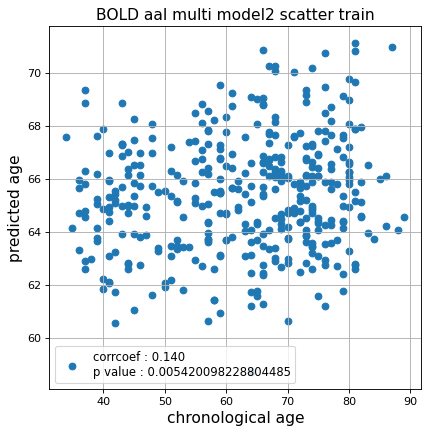

r^2 train data:  -0.021866660580335484


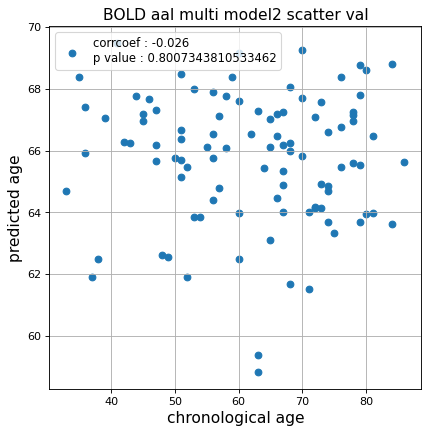

r^2 val data:  -0.11025767075999937


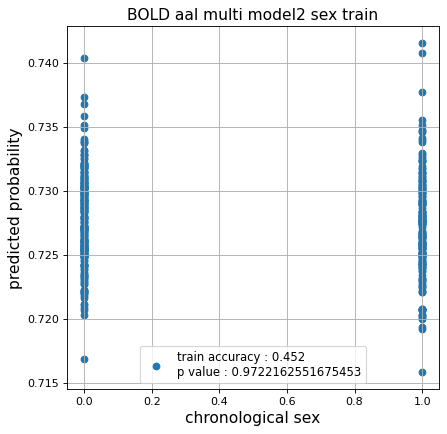

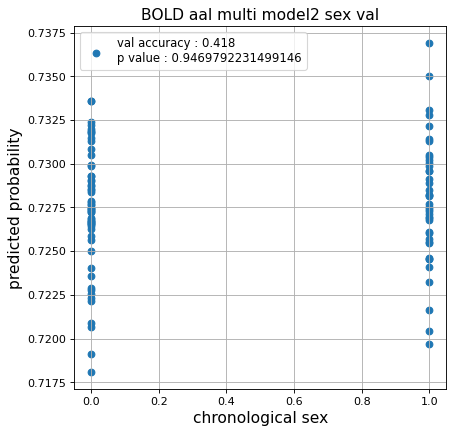

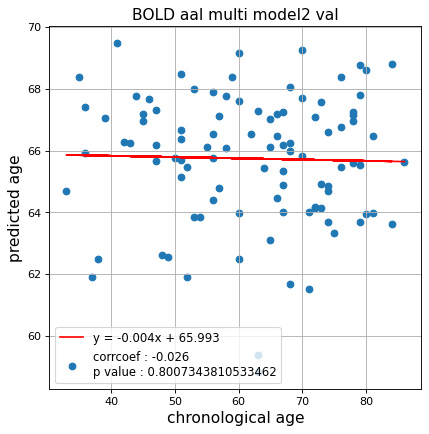

切片: 65.99280252199388
傾き: -0.004066531179413438
save_epochs:0


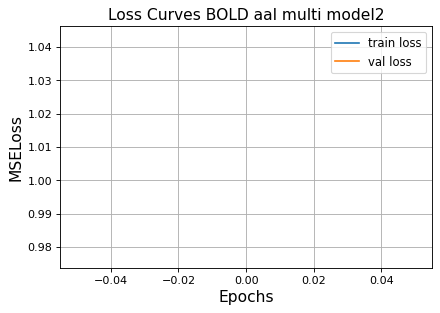

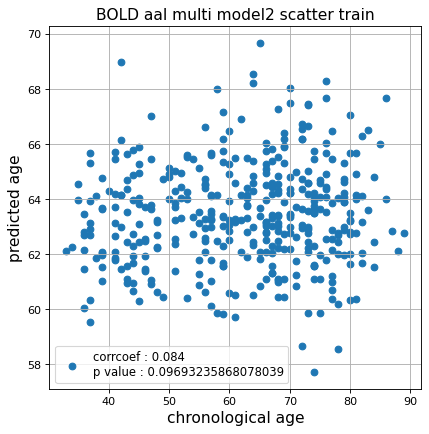

r^2 train data:  -0.007062656256064281


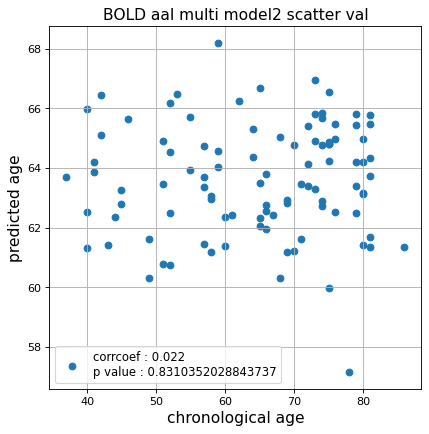

r^2 val data:  -0.021579999465721533


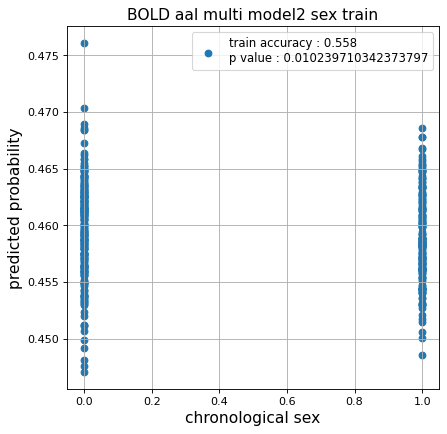

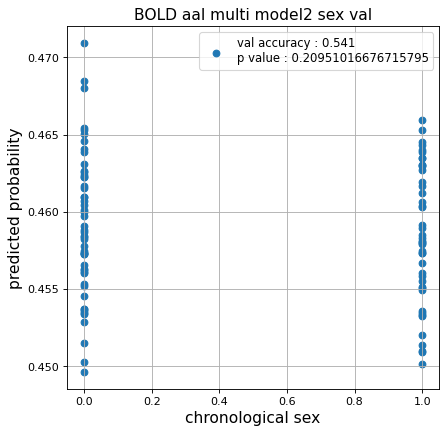

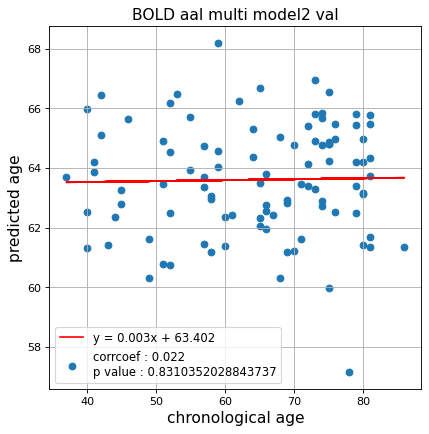

切片: 63.4021355501836
傾き: 0.0031888120706311165
Nested Kfold ::: 4
save_epochs:0


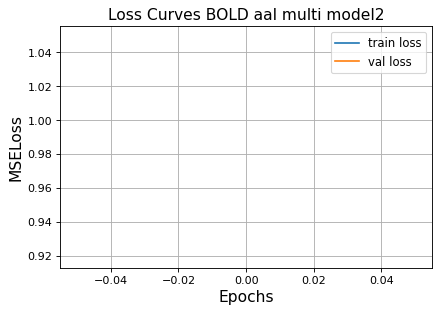

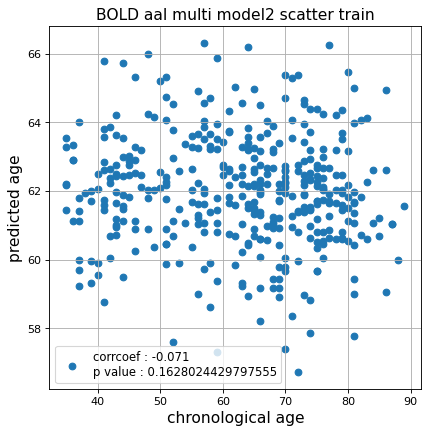

r^2 train data:  -0.034202646138056014


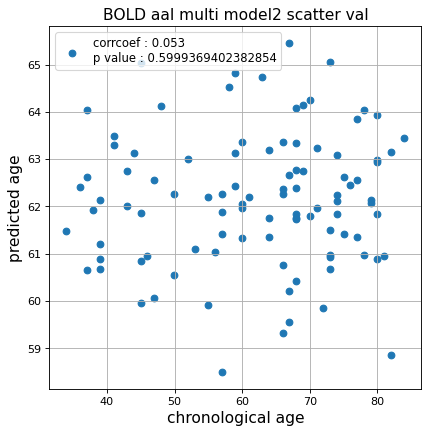

r^2 val data:  0.00039655086761591907


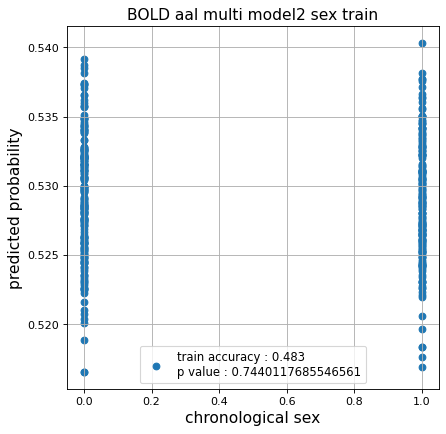

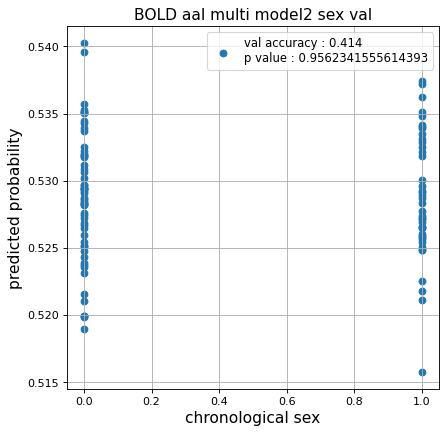

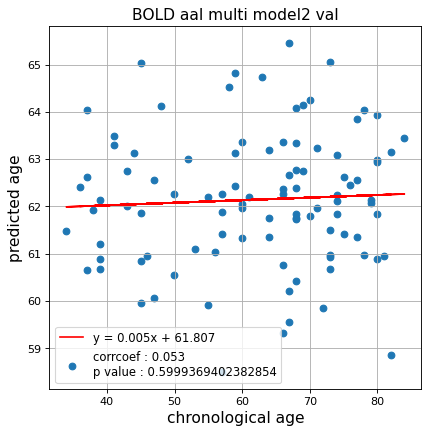

切片: 61.807019501970004
傾き: 0.005442306828200385
save_epochs:0


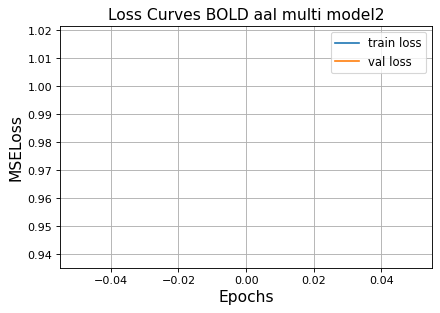

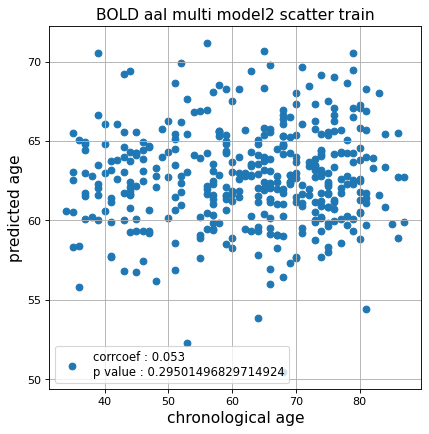

r^2 train data:  -0.02848428479960008


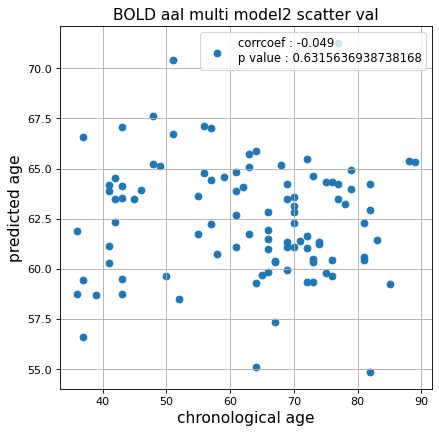

r^2 val data:  -0.06142115852530505


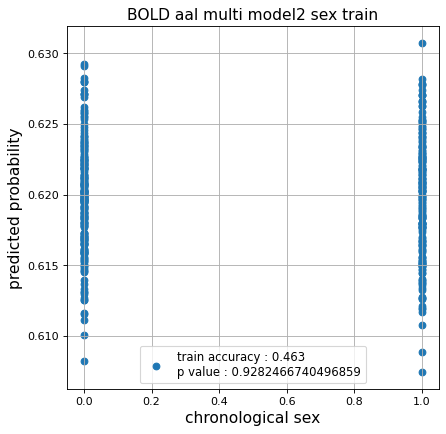

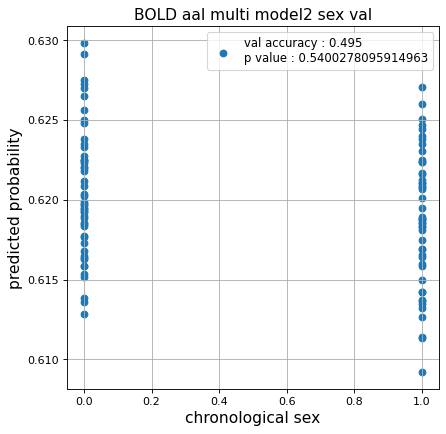

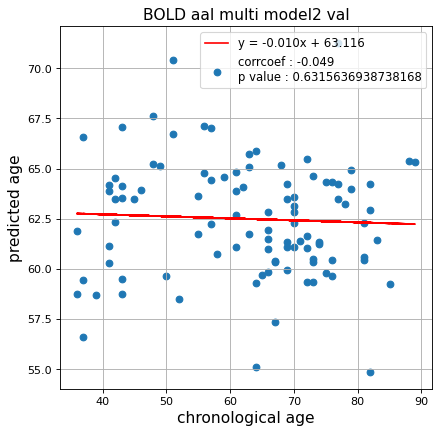

切片: 63.11609917611882
傾き: -0.009932607506137614
save_epochs:0


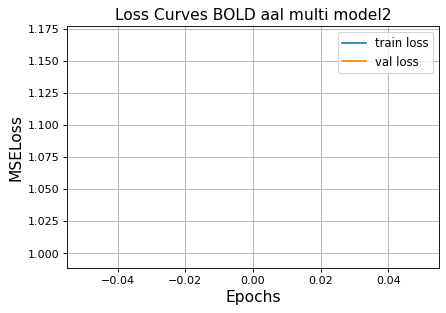

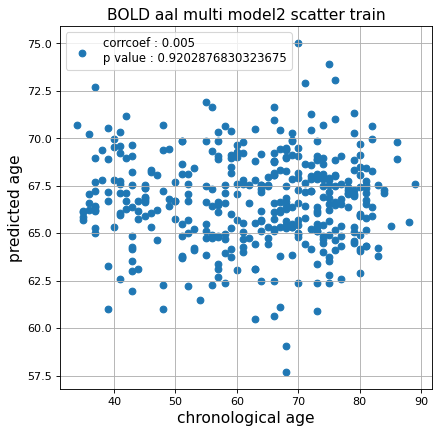

r^2 train data:  -0.12322124445296301


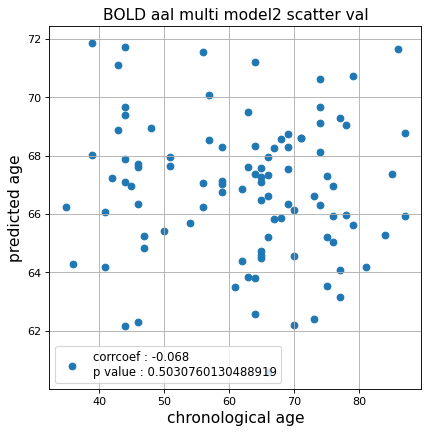

r^2 val data:  -0.1701244875709289


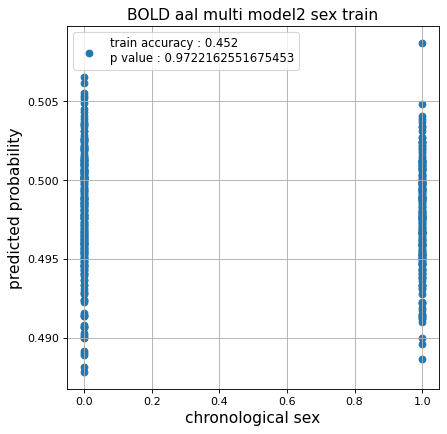

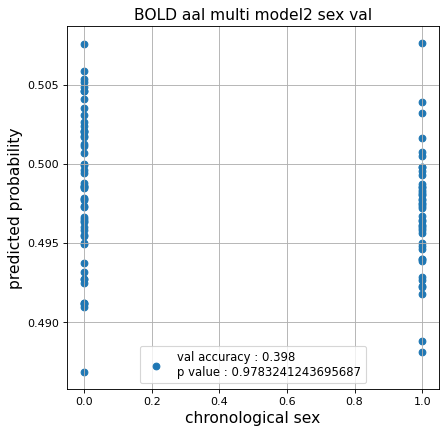

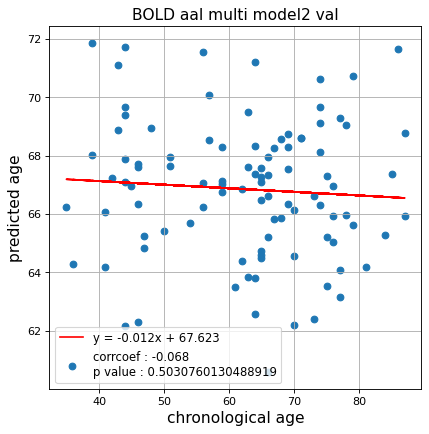

切片: 67.62270598827376
傾き: -0.012310325139335556
save_epochs:0


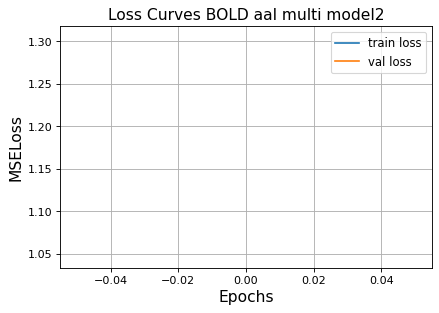

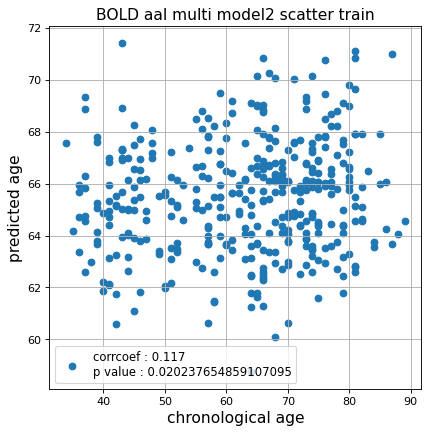

r^2 train data:  -0.024693492976897824


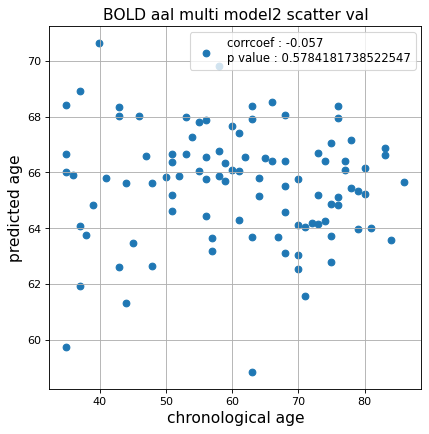

r^2 val data:  -0.15381225267195586


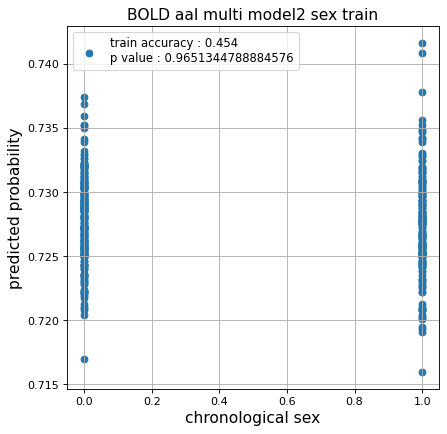

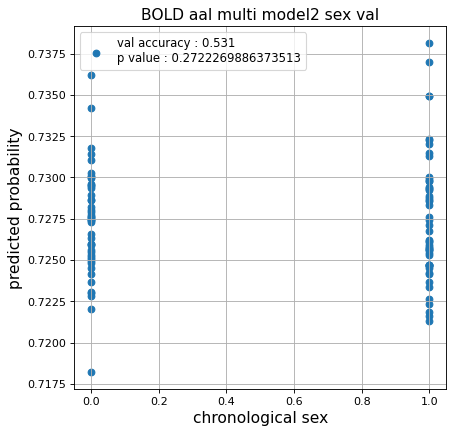

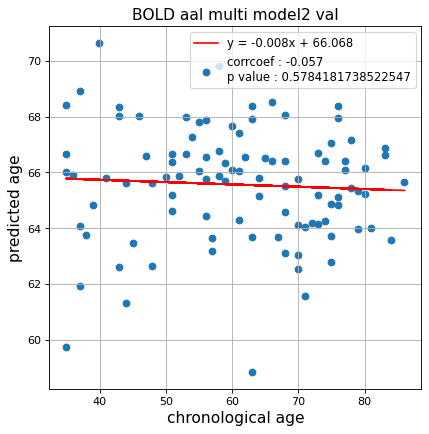

切片: 66.06842165793284
傾き: -0.008297425816212812
save_epochs:0


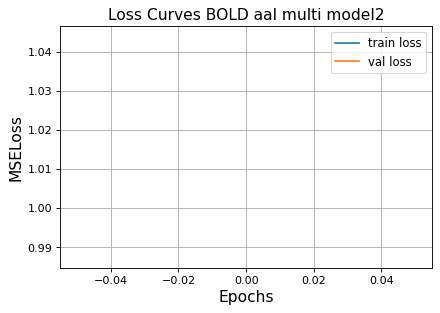

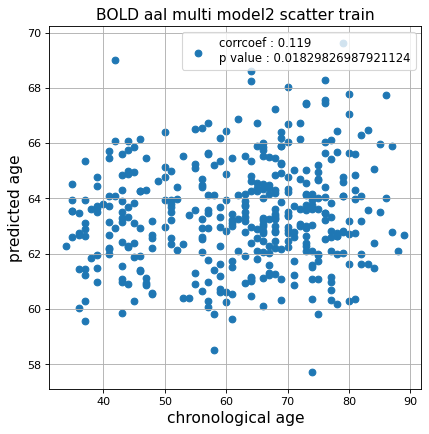

r^2 train data:  0.0029648597424525303


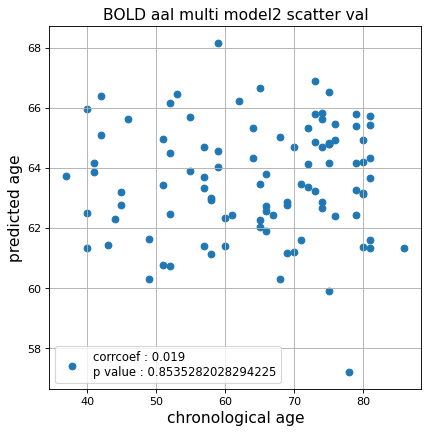

r^2 val data:  -0.02271963018599754


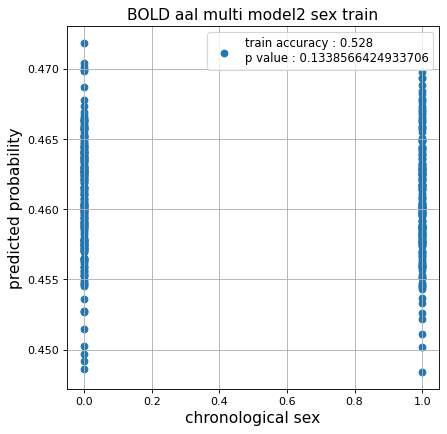

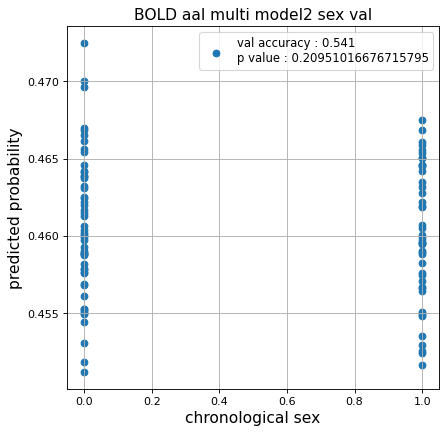

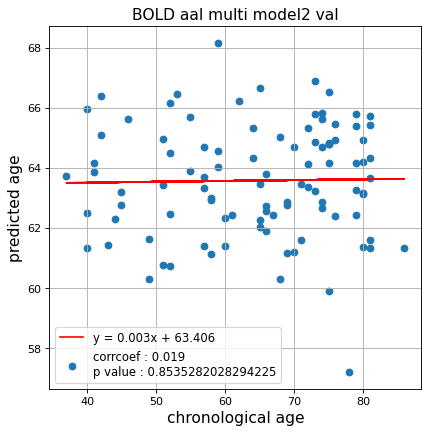

切片: 63.405668384064086
傾き: 0.00275653458096475
Nested Kfold ::: 5
save_epochs:0


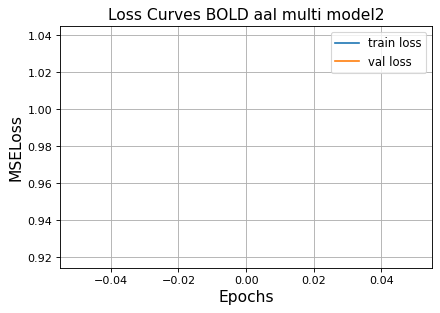

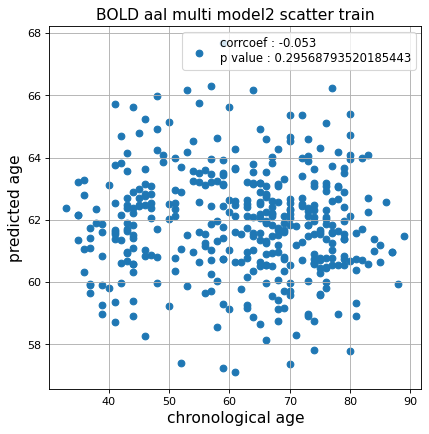

r^2 train data:  -0.029655913720432636


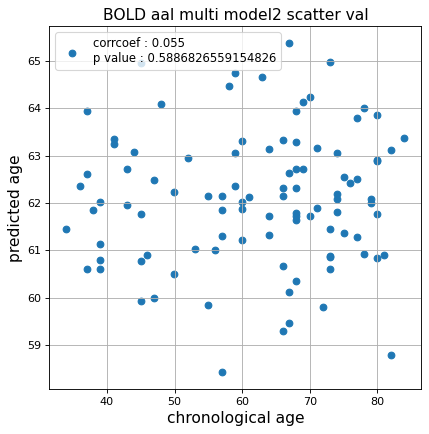

r^2 val data:  0.0007896020900105549


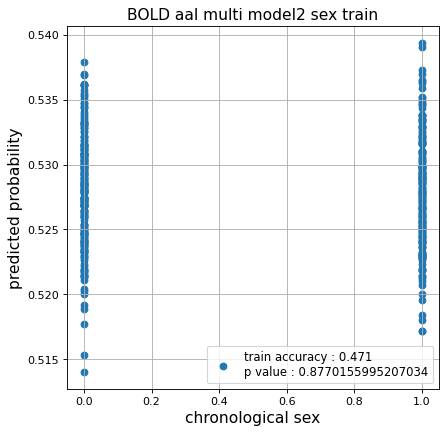

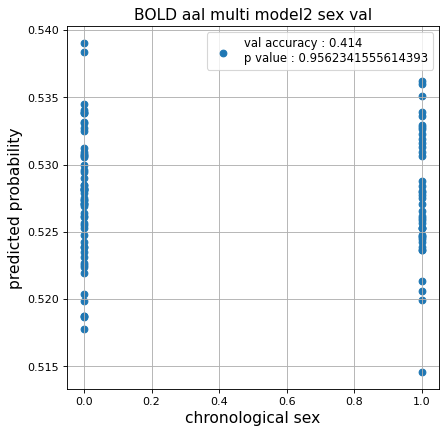

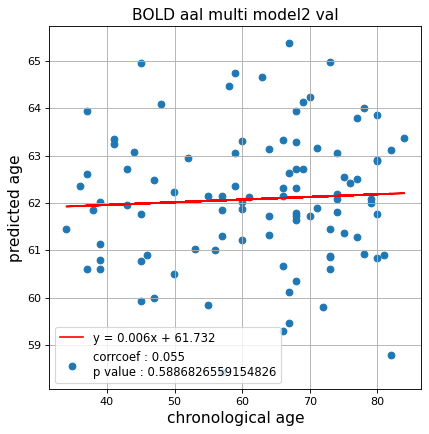

切片: 61.732499885900076
傾き: 0.0056148432917024725
save_epochs:0


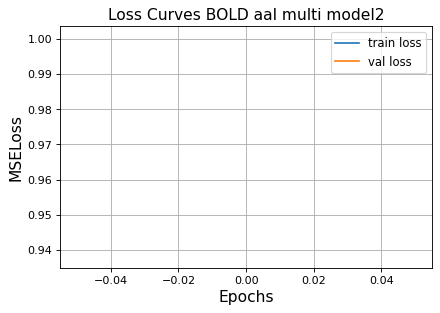

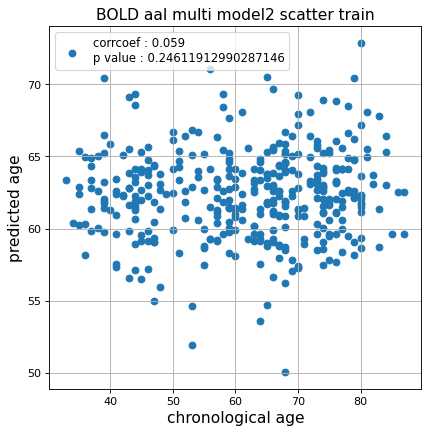

r^2 train data:  -0.02711239937561083


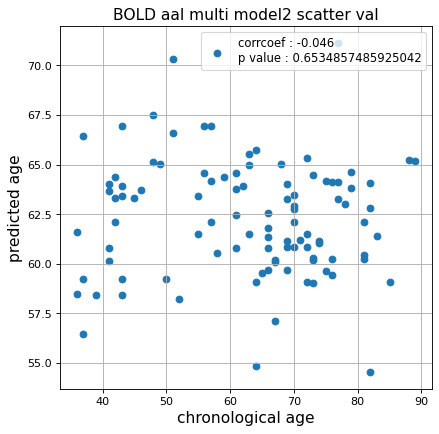

r^2 val data:  -0.061743282645023045


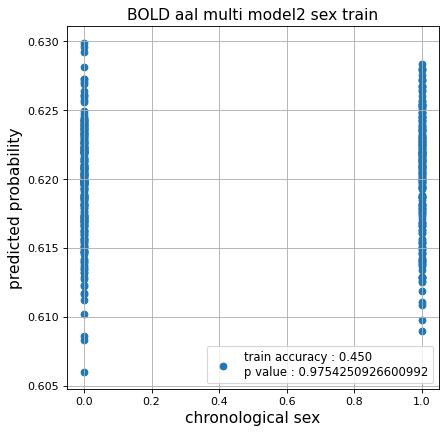

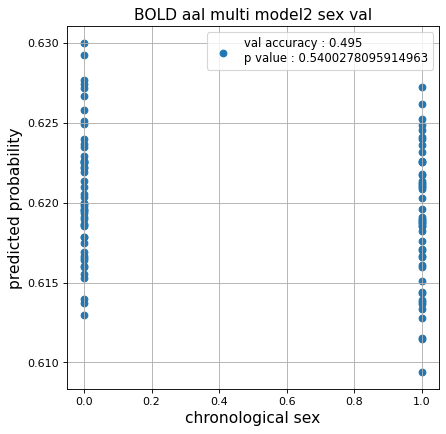

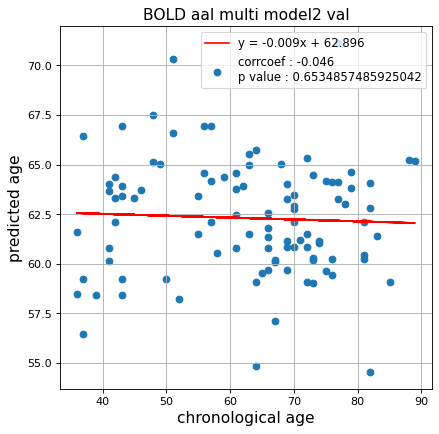

切片: 62.89557821371785
傾き: -0.009403326266490193
save_epochs:0


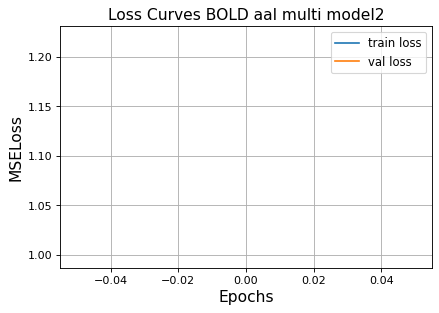

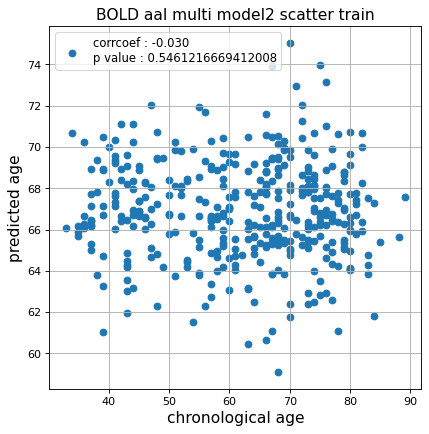

r^2 train data:  -0.1779750244857019


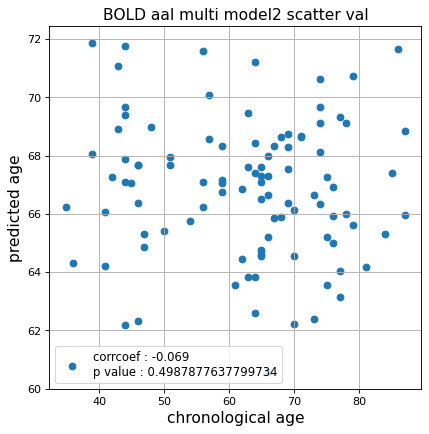

r^2 val data:  -0.17110559712116835


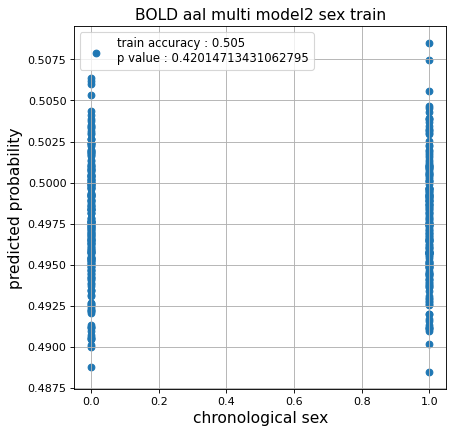

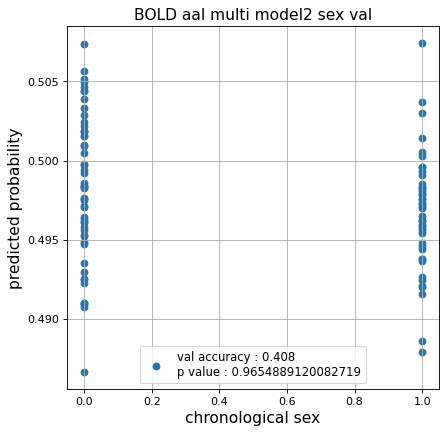

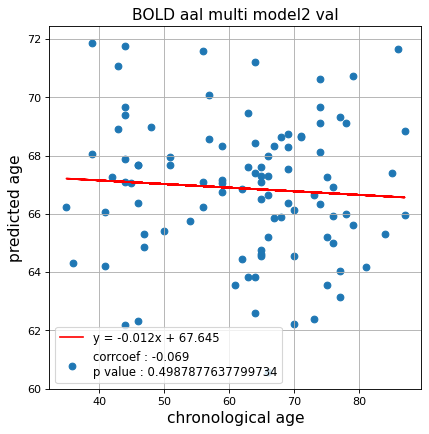

切片: 67.64501192338693
傾き: -0.012430182225300786
save_epochs:0


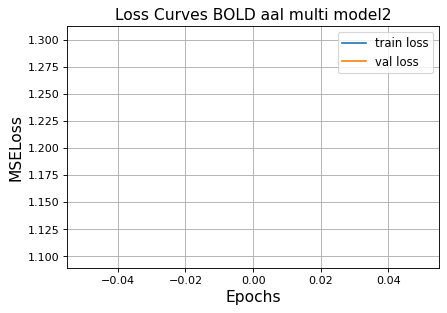

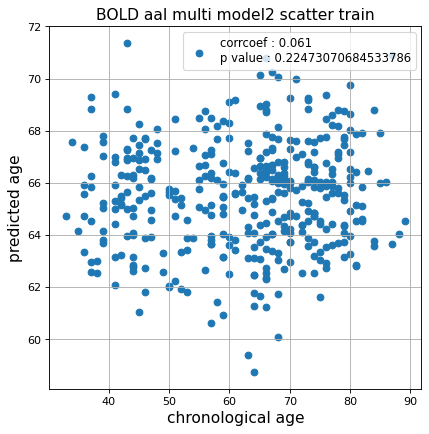

r^2 train data:  -0.06382492794647532


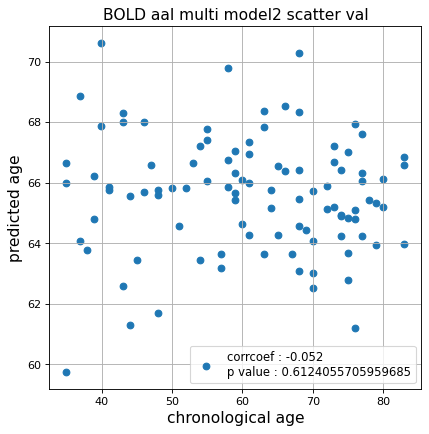

r^2 val data:  -0.14558135832365005


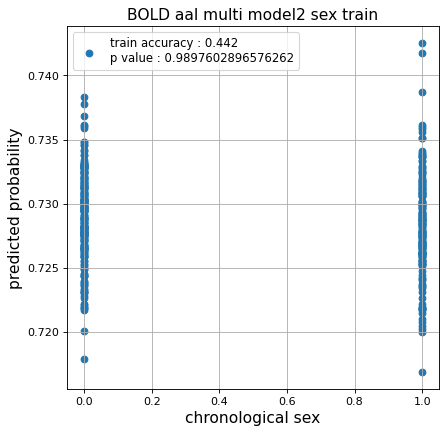

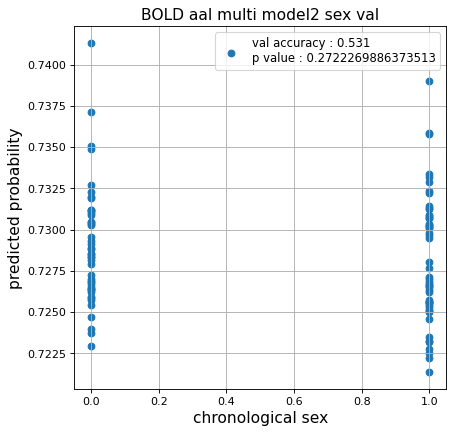

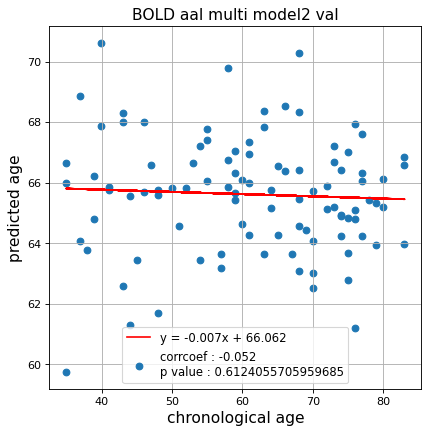

切片: 66.06199008734474
傾き: -0.00732431484540488
save_epochs:0


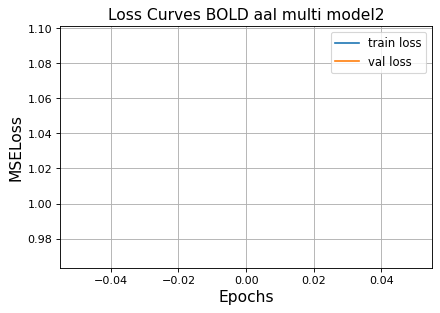

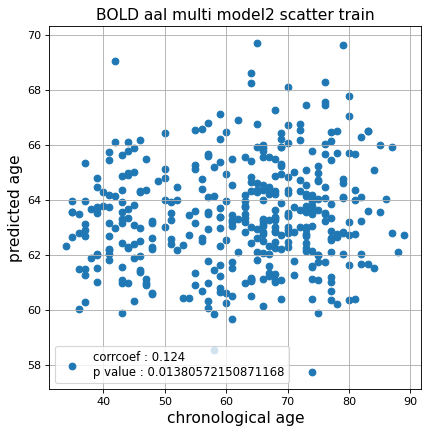

r^2 train data:  0.004443474316271456


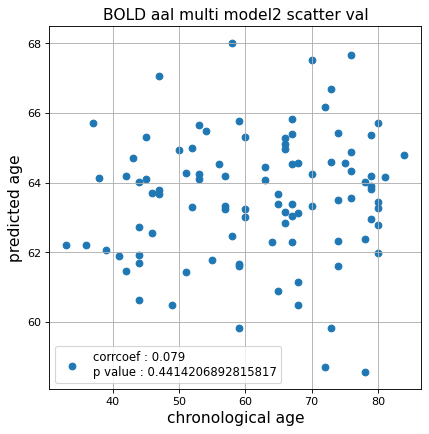

r^2 val data:  -0.015549783508771453


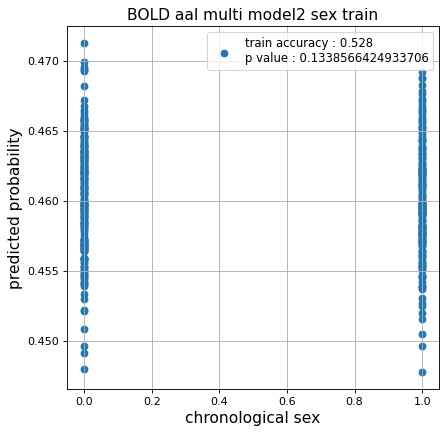

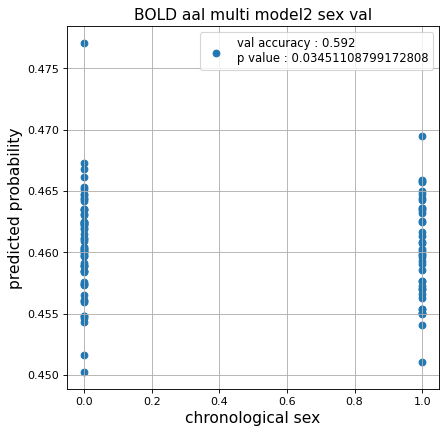

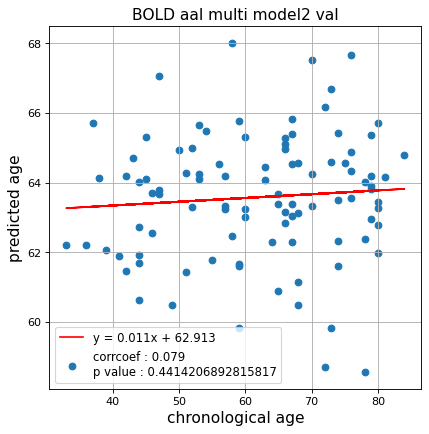

切片: 62.91310201022819
傾き: 0.01082015836667192
CPU times: user 58.7 s, sys: 5.6 s, total: 1min 4s
Wall time: 56.8 s


In [22]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_all_2  = []
test_pred_aal_all_inverse_2  = []
test_label_aal_all_2 = []

test_idx_aal_all_2   = []
train_idx_aal_all_2  = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_inverse,test_label = train_model(data_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1,
                                                           d_model    = 128,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           nhead      = 32,
                                                           hidden_dim_transformer = 2,
                                                           pos_drop    = 0.1,
                                                           trans_drop = 0.1,
                                                           fc_drop = 0.1,
                                                           title = 'BOLD aal multi model2'
                                                          )
    
    test_pred_aal_all_2.append(test_pred)
    test_pred_aal_all_inverse_2.append(test_pred_inverse)
    test_label_aal_all_2.append(test_label)

    test_idx_aal_all_2.append(test_idx)
    train_idx_aal_all_2.append(train_idx)

### Data定義(dynamic FC)

In [23]:
%%time
df_dynamic_aal = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_aal.csv')
data_dynamic_aal = make_data(df_dynamic_aal)
print(data_dynamic_aal.shape)

(615, 123, 6670)
CPU times: user 3min 8s, sys: 5.31 s, total: 3min 14s
Wall time: 3min 14s


### Dynamic FC 1

Nested Kfold ::: 1
save_epochs:0


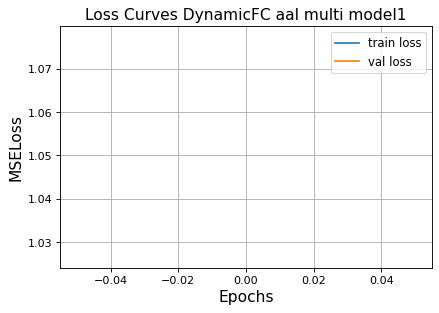

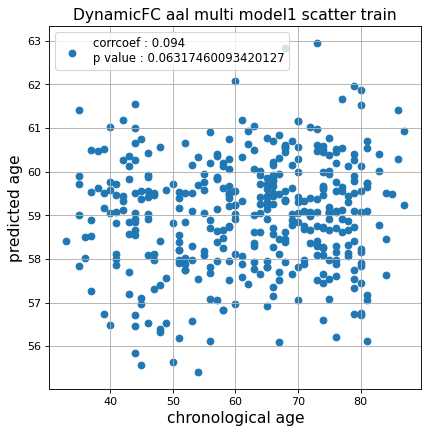

r^2 train data:  -0.0542517914578422


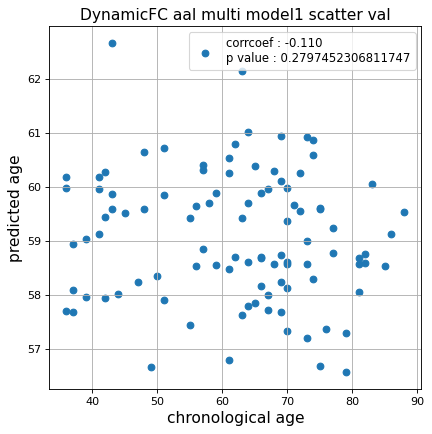

r^2 val data:  -0.06887751759333582


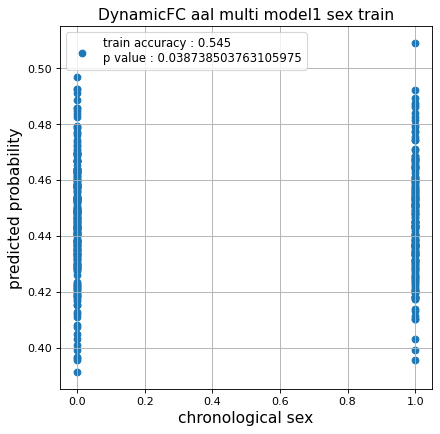

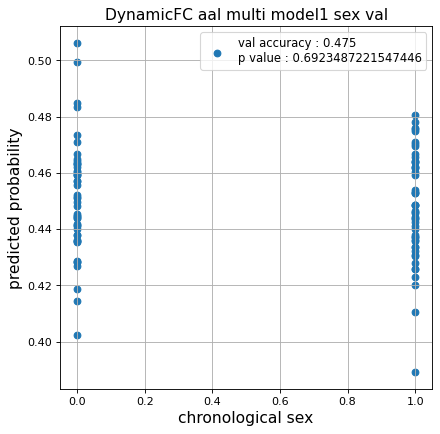

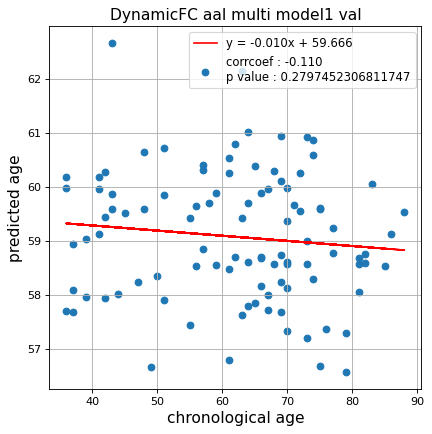

切片: 59.66554012245089
傾き: -0.009543098918129846
save_epochs:0


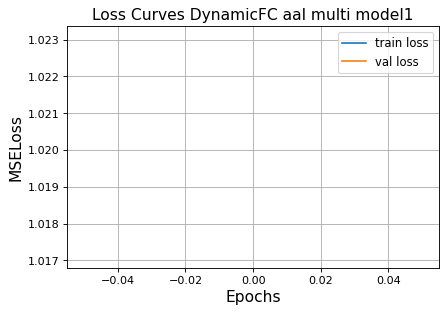

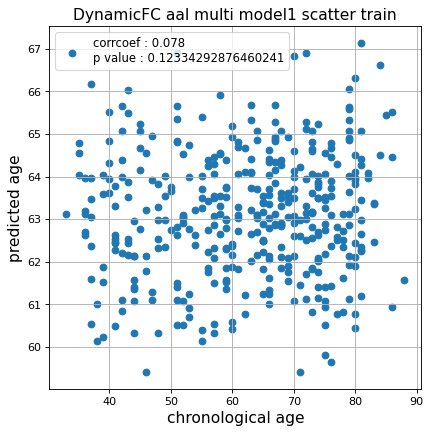

r^2 train data:  0.001591048882874424


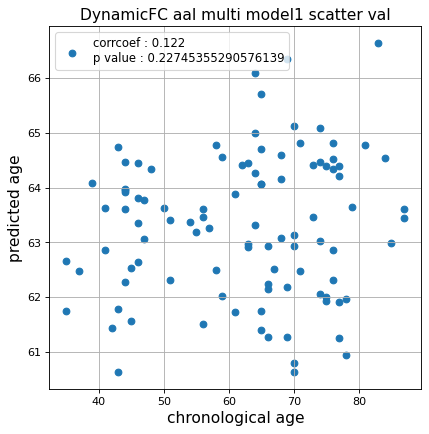

r^2 val data:  0.006467527386092131


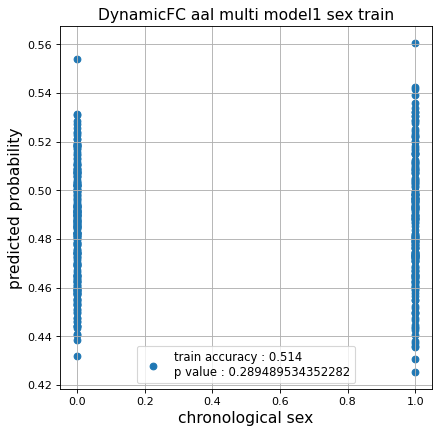

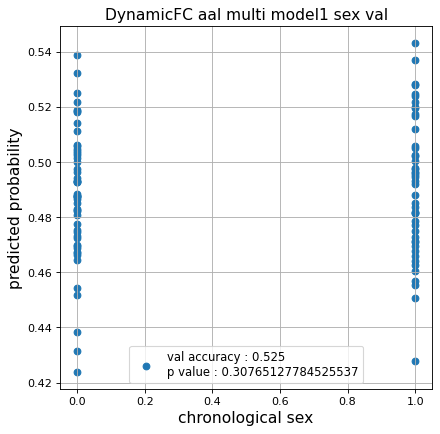

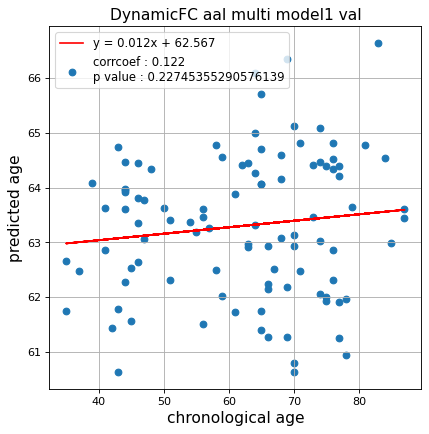

切片: 62.56679199766662
傾き: 0.011801202408721099
save_epochs:0


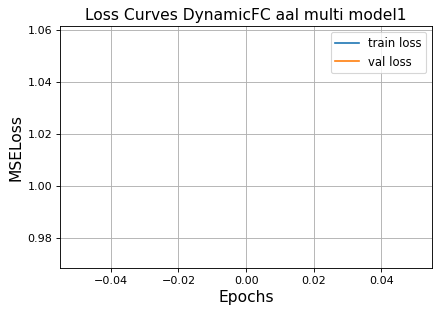

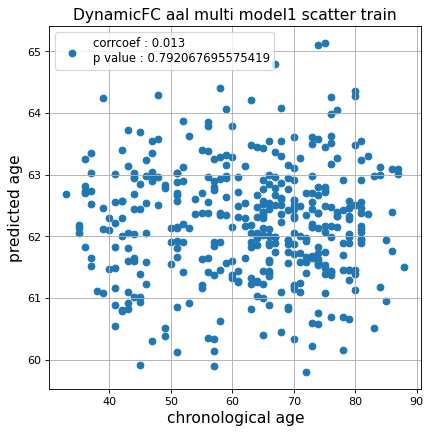

r^2 train data:  -0.004178775340928587


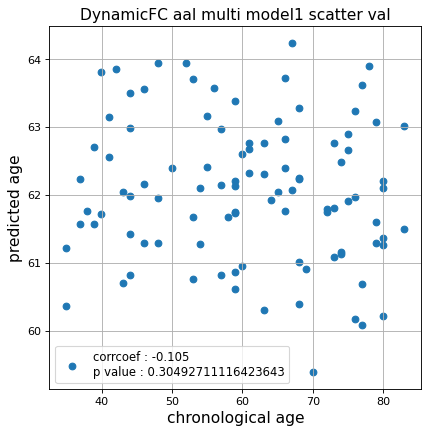

r^2 val data:  -0.03319761496984053


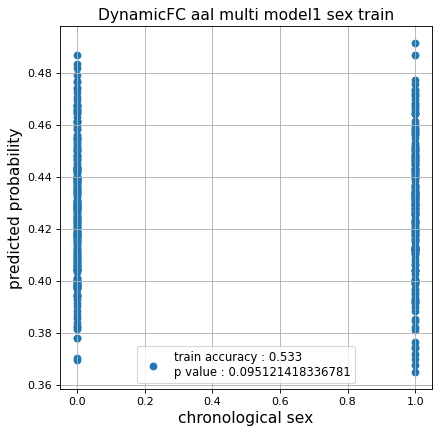

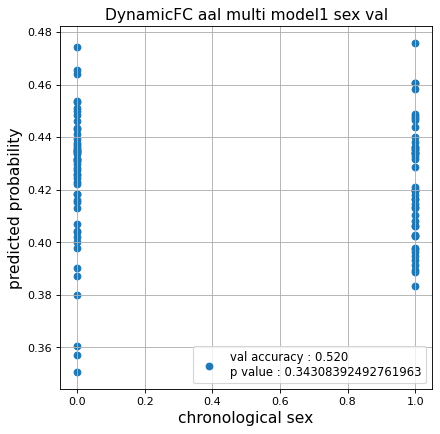

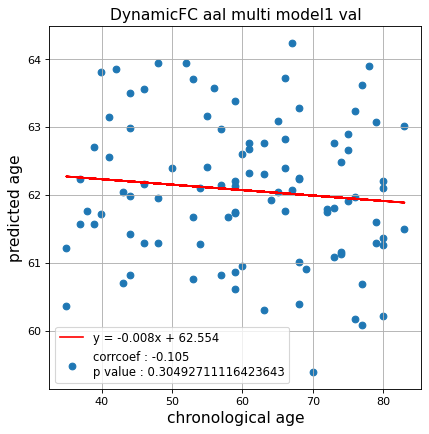

切片: 62.553618581660395
傾き: -0.008011872251878315
save_epochs:0


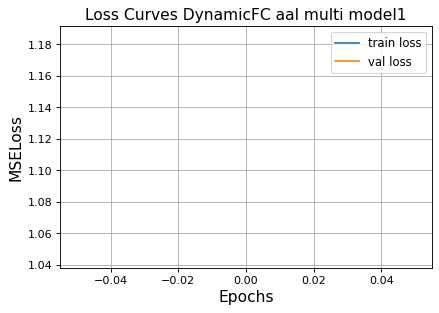

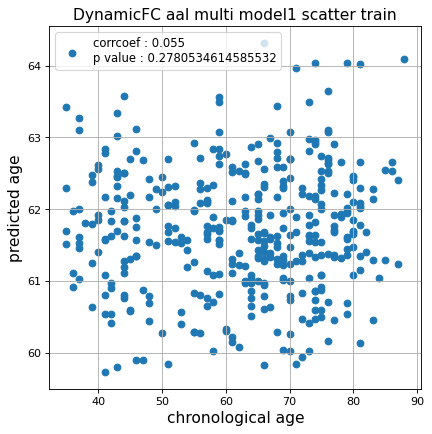

r^2 train data:  0.0009332168694883292


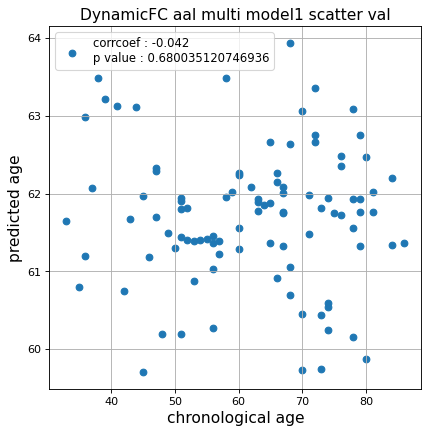

r^2 val data:  -0.010568584473209297


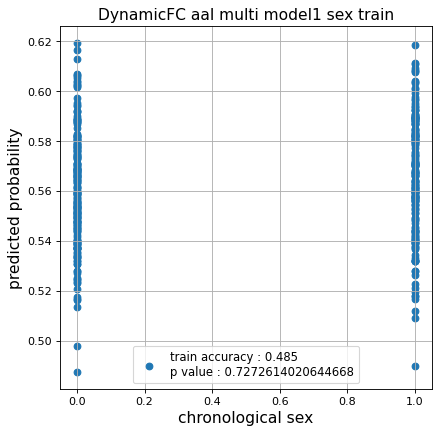

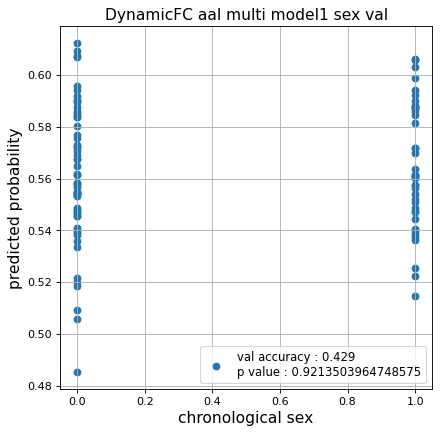

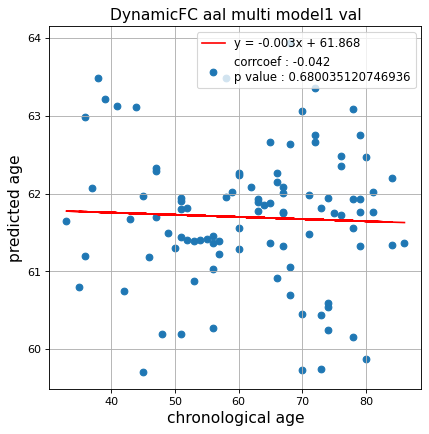

切片: 61.867614887084414
傾き: -0.0027784190798233192
save_epochs:0


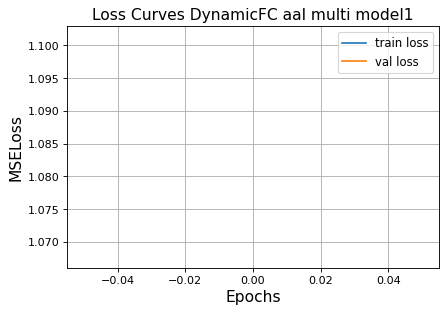

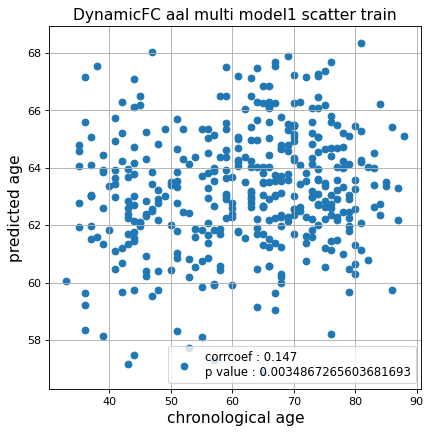

r^2 train data:  0.008288383510914432


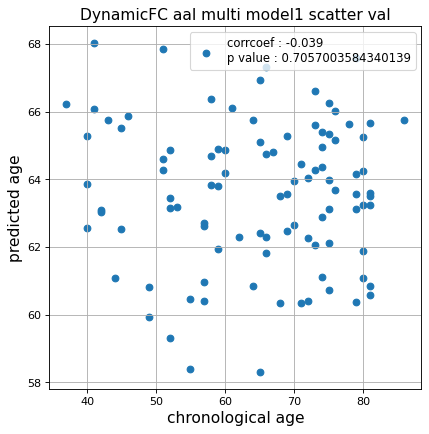

r^2 val data:  -0.0478540804288623


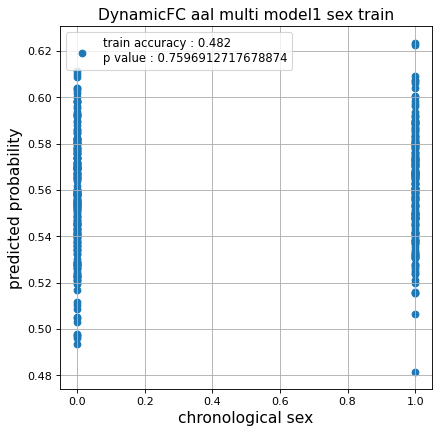

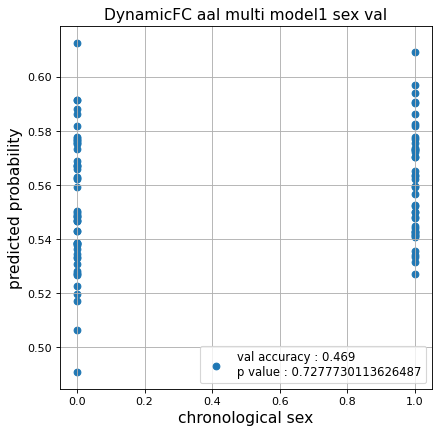

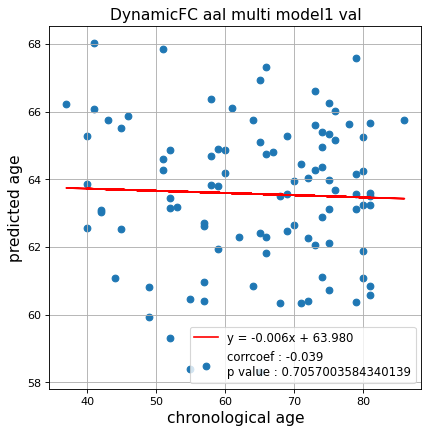

切片: 63.98001958747952
傾き: -0.006437836609729154
Nested Kfold ::: 2
save_epochs:0


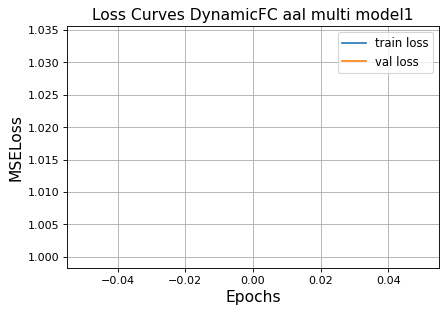

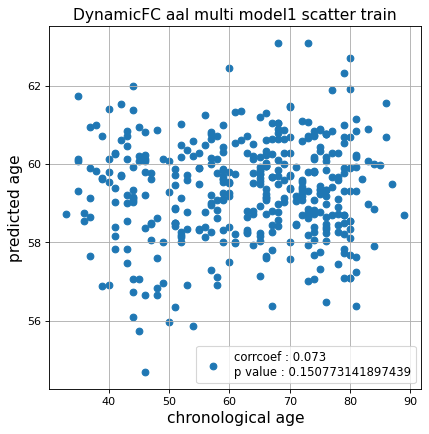

r^2 train data:  -0.06271684952414658


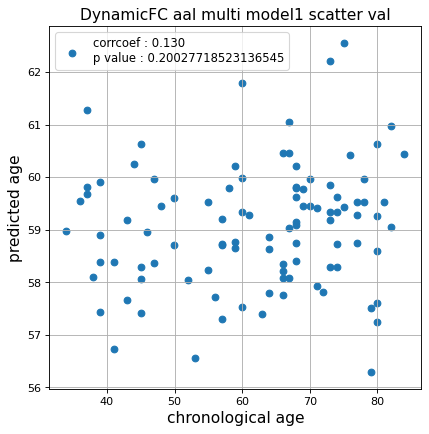

r^2 val data:  -0.03193497355153685


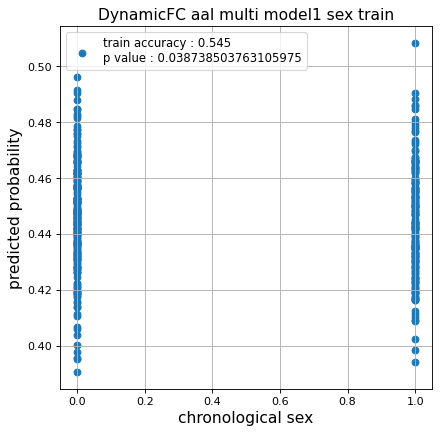

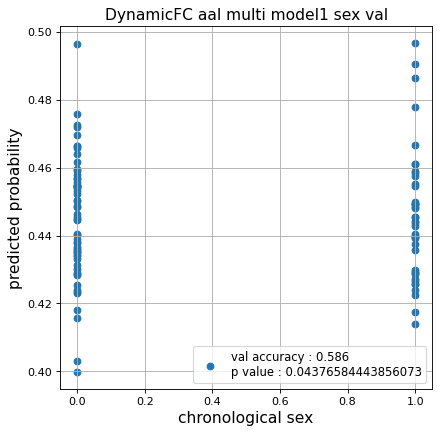

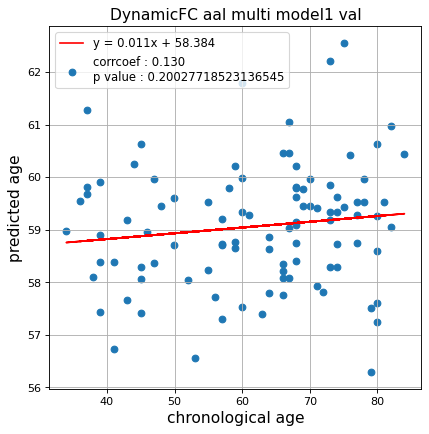

切片: 58.38366677145308
傾き: 0.01095875778678332
save_epochs:0


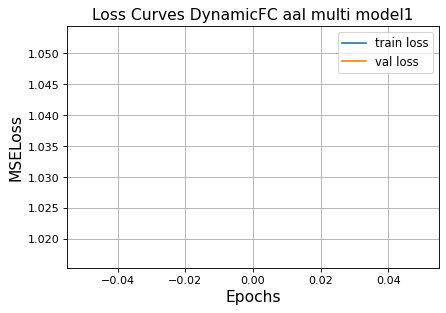

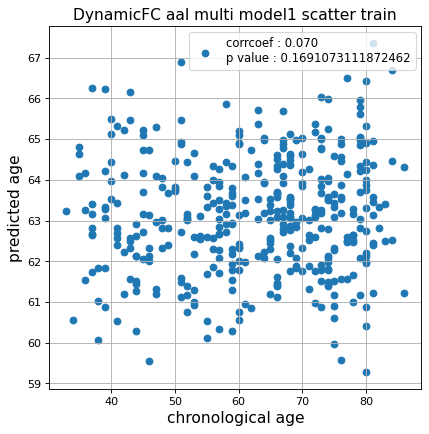

r^2 train data:  -1.2638994946634341e-05


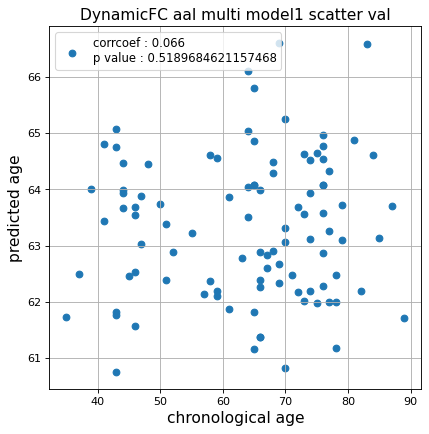

r^2 val data:  0.0020981971261413435


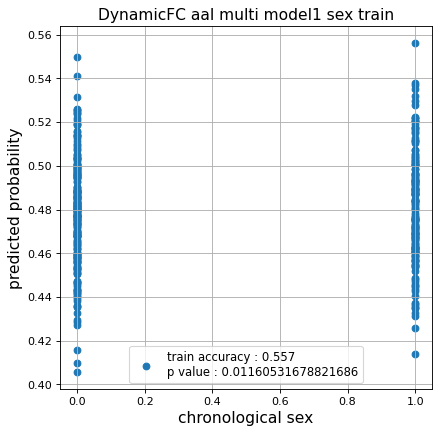

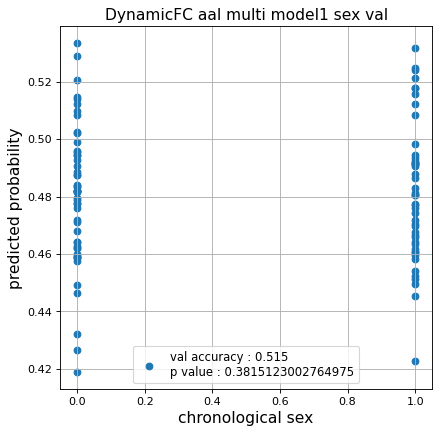

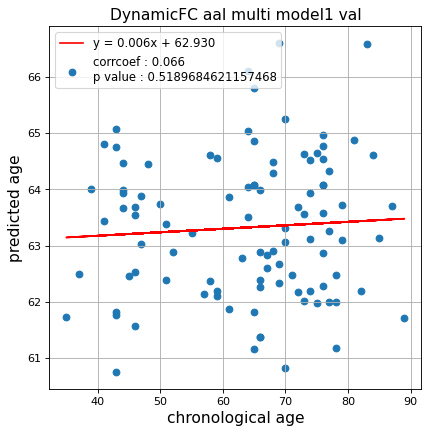

切片: 62.92967541805334
傾き: 0.006182704261549725
save_epochs:0


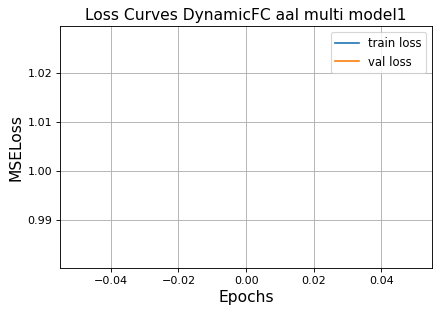

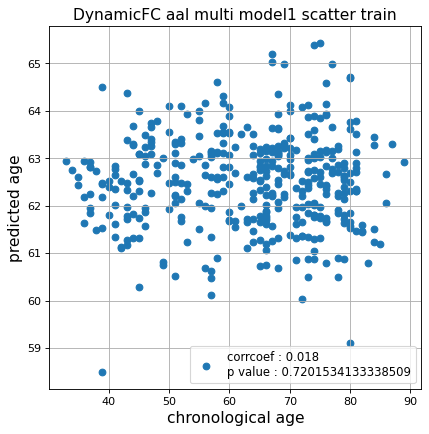

r^2 train data:  -0.004916734245482779


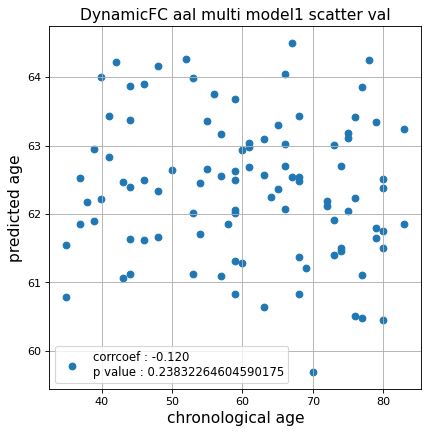

r^2 val data:  -0.040344771146077596


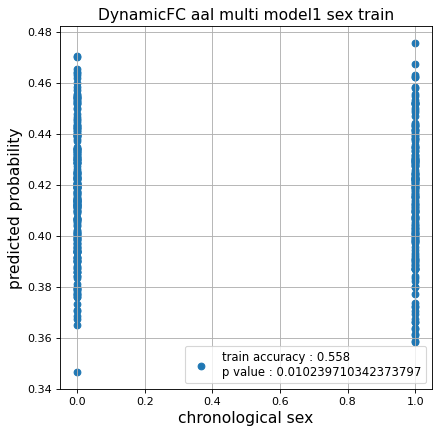

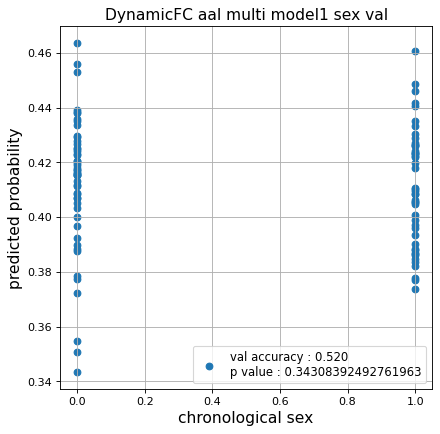

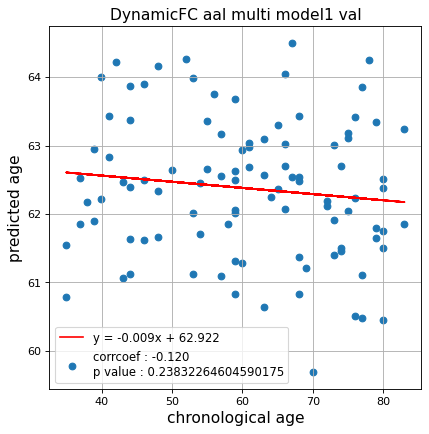

切片: 62.92200142126853
傾き: -0.009019963137731048
save_epochs:0


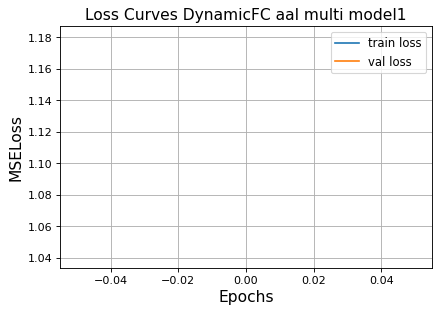

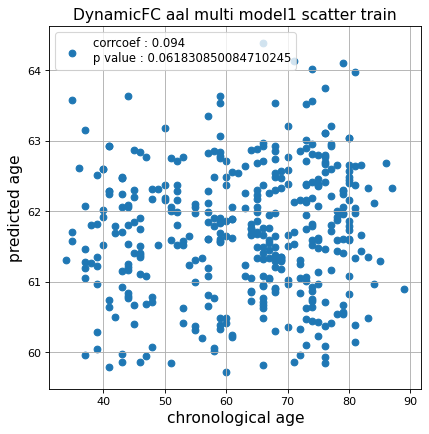

r^2 train data:  0.0018919480562528124


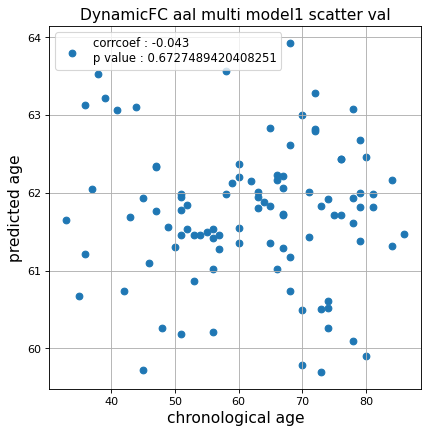

r^2 val data:  -0.010670909641891546


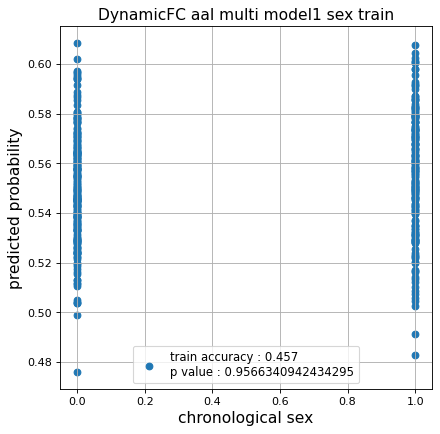

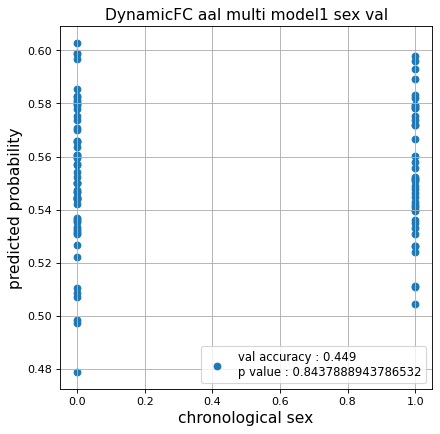

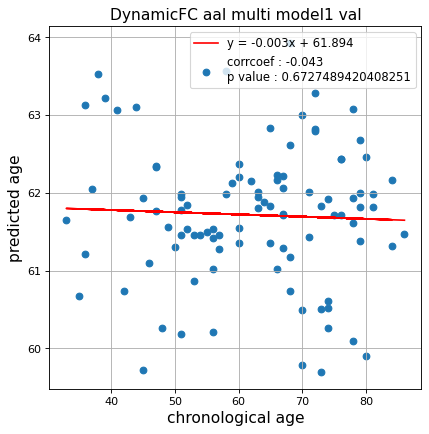

切片: 61.89360510620478
傾き: -0.0028550670157352098
save_epochs:0


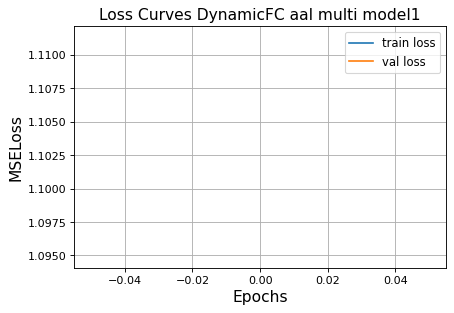

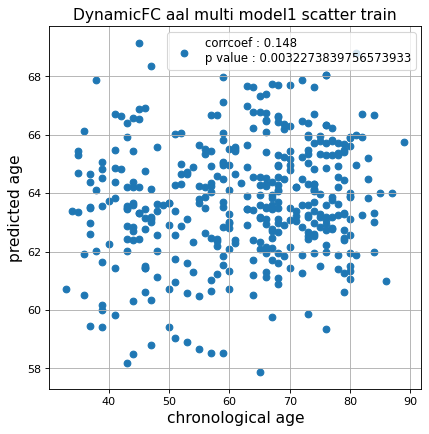

r^2 train data:  0.007774423395121688


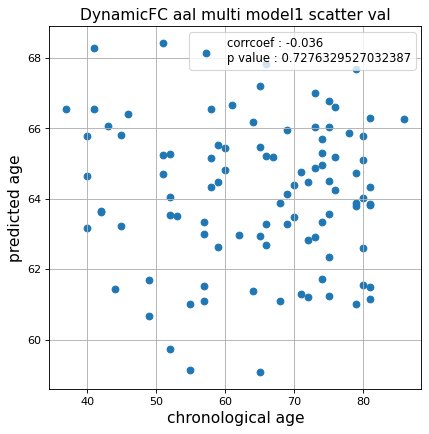

r^2 val data:  -0.03880861034036154


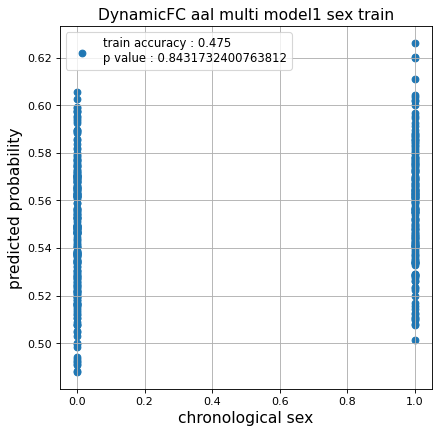

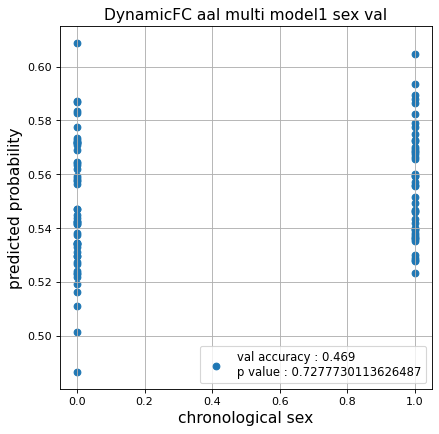

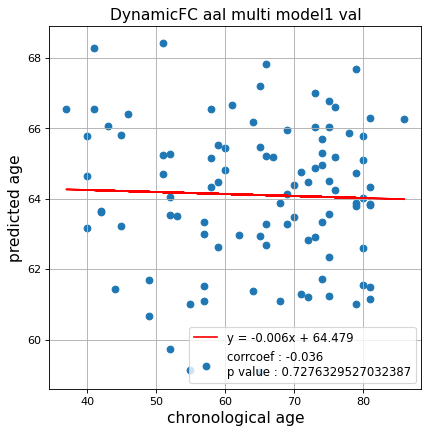

切片: 64.47895581298567
傾き: -0.0057045819625161035
Nested Kfold ::: 3
save_epochs:0


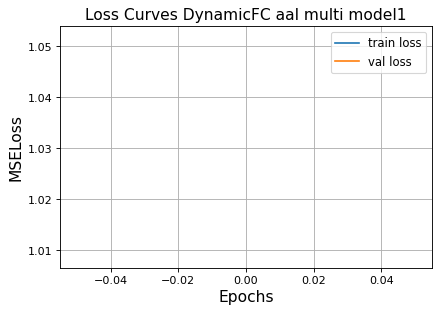

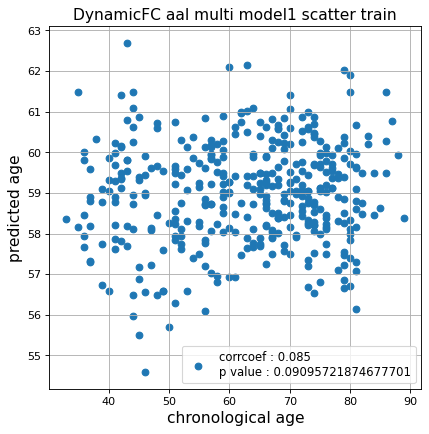

r^2 train data:  -0.06862516214889358


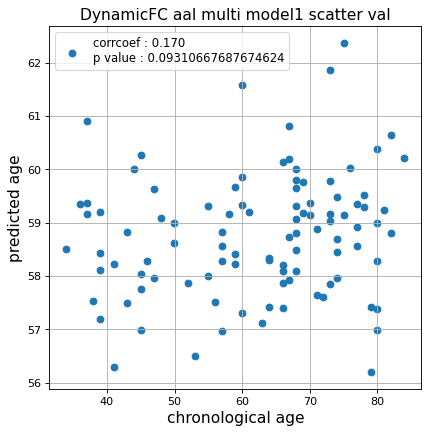

r^2 val data:  -0.0349384149404095


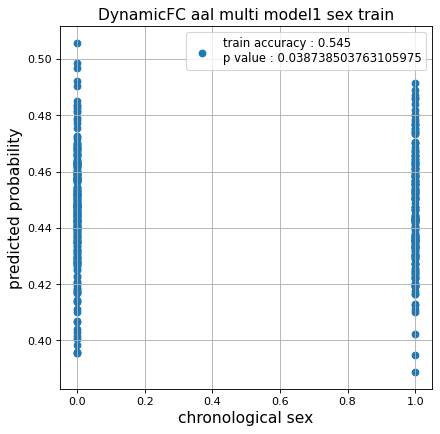

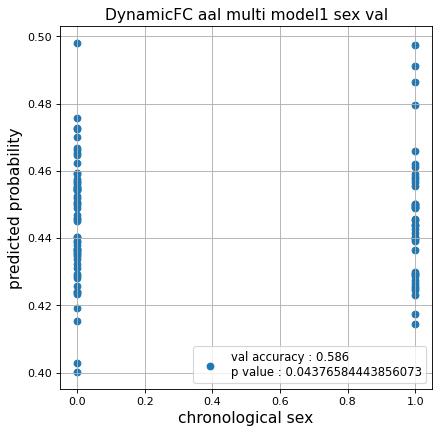

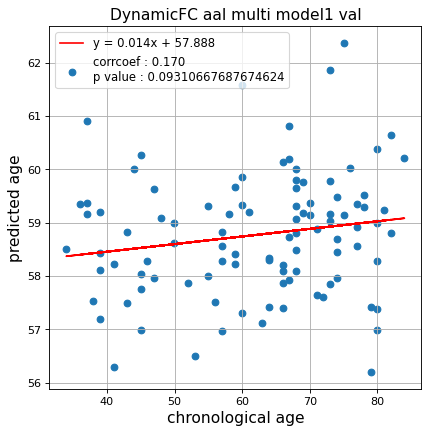

切片: 57.8879588763458
傾き: 0.014253581439230152
save_epochs:0


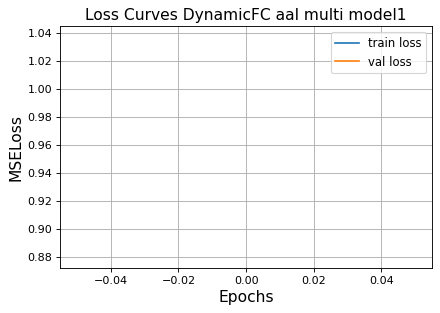

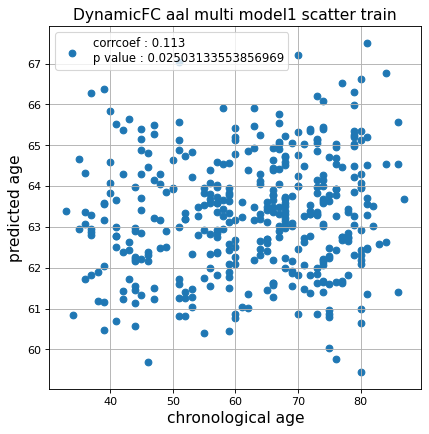

r^2 train data:  0.009522123744133748


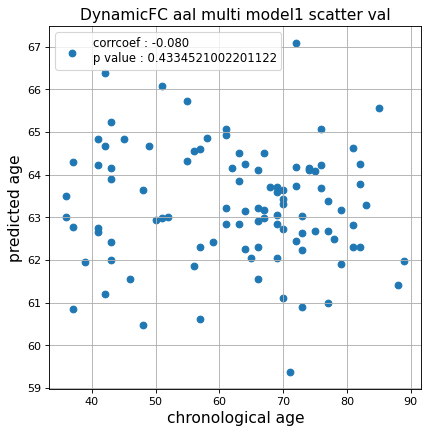

r^2 val data:  -0.026458430342195527


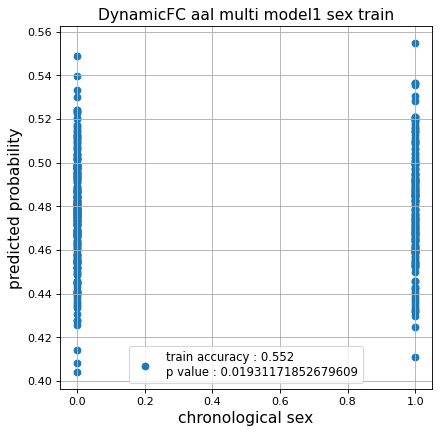

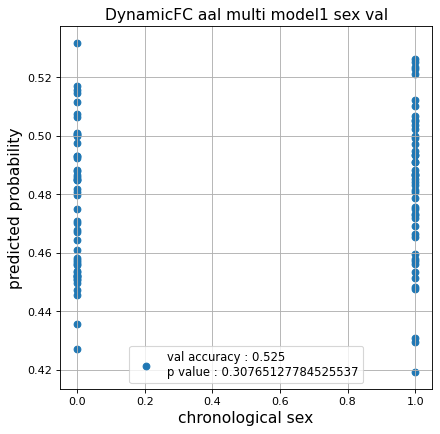

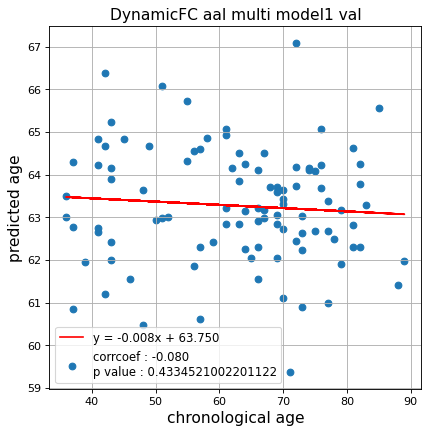

切片: 63.74978426843221
傾き: -0.007621151140932979
save_epochs:0


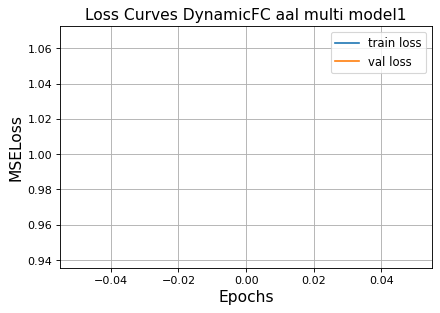

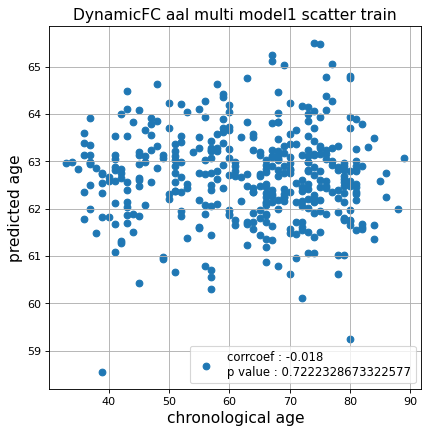

r^2 train data:  -0.007778164629554496


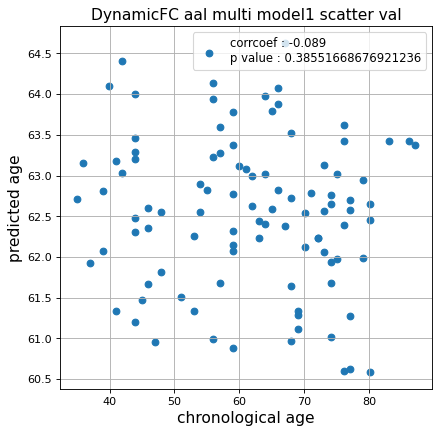

r^2 val data:  -0.024657353256570147


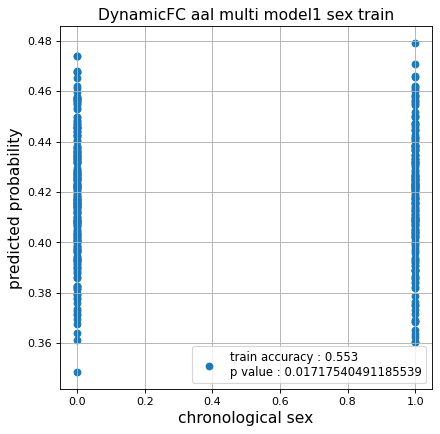

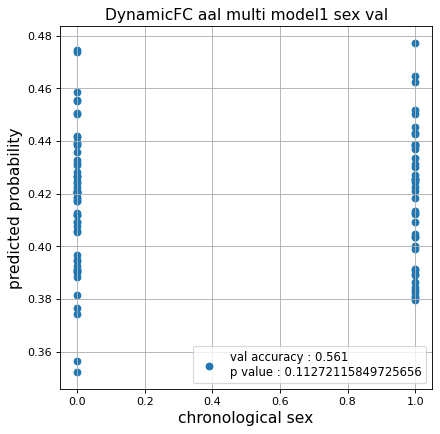

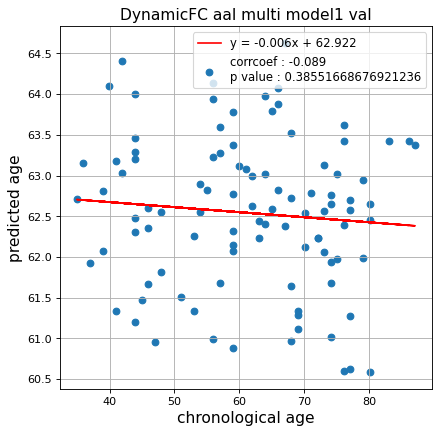

切片: 62.92156268395409
傾き: -0.006194338121764329
save_epochs:0


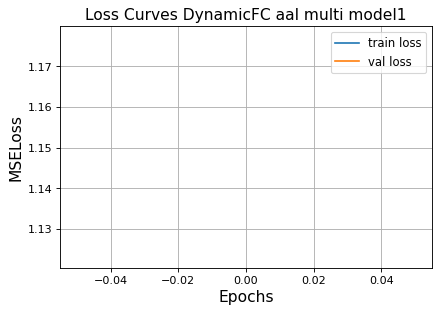

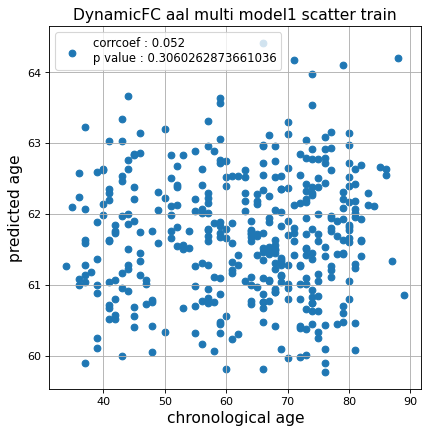

r^2 train data:  -0.002831918190757454


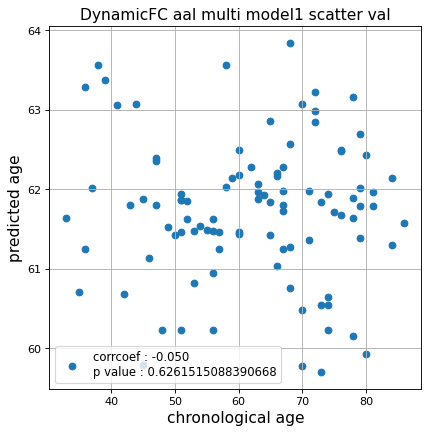

r^2 val data:  -0.01157217202155758


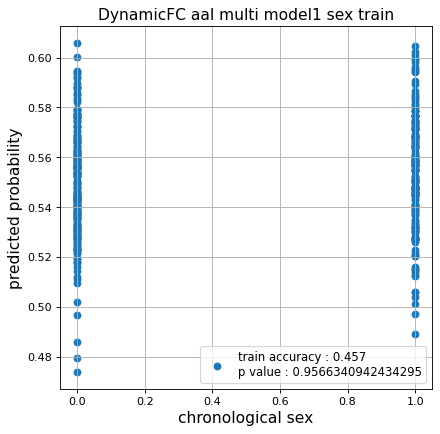

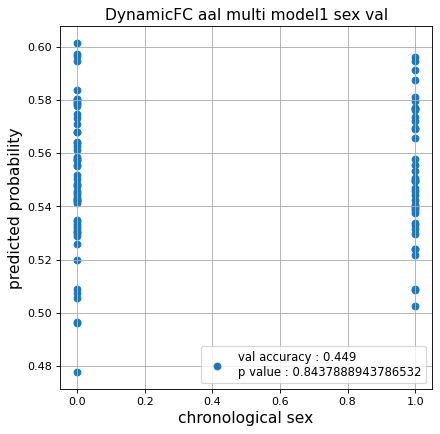

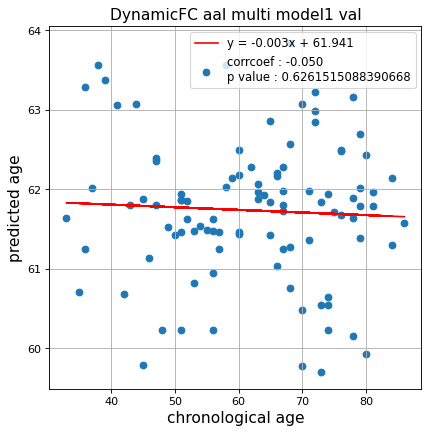

切片: 61.94139280001342
傾き: -0.0033128686883682314
save_epochs:0


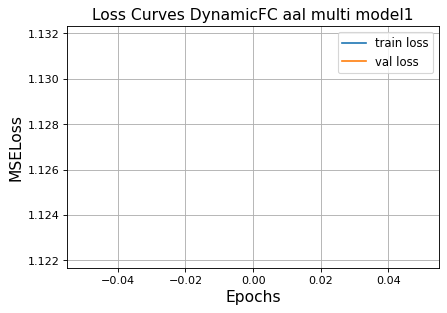

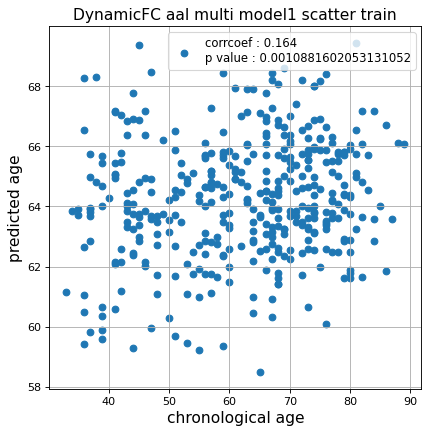

r^2 train data:  -0.0001013290415194934


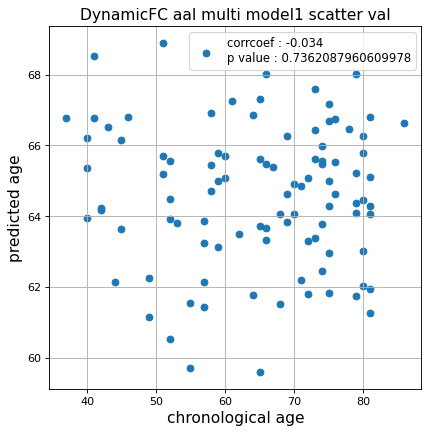

r^2 val data:  -0.03471077646512488


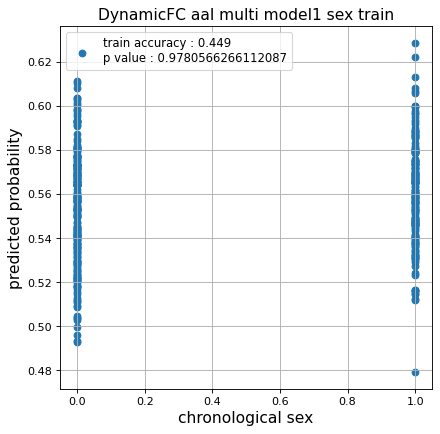

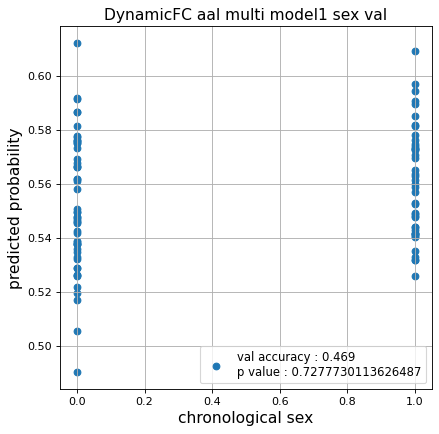

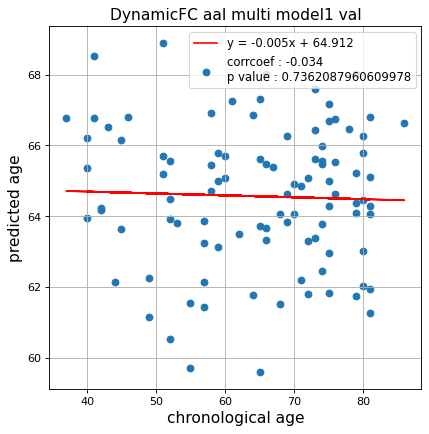

切片: 64.91166210366214
傾き: -0.005338406135442826
Nested Kfold ::: 4
save_epochs:0


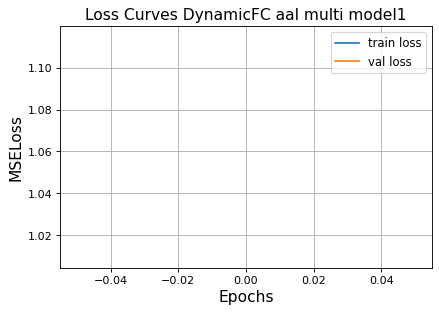

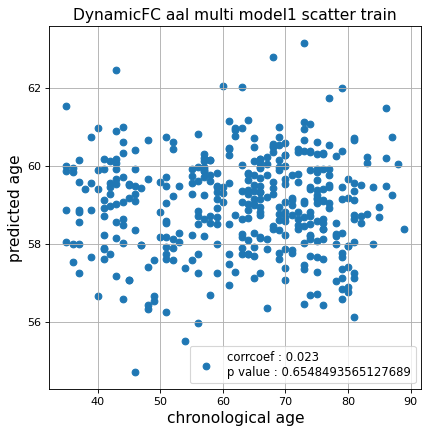

r^2 train data:  -0.07563477445298461


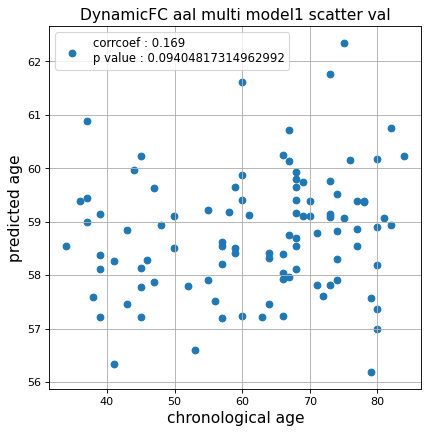

r^2 val data:  -0.03537307137539436


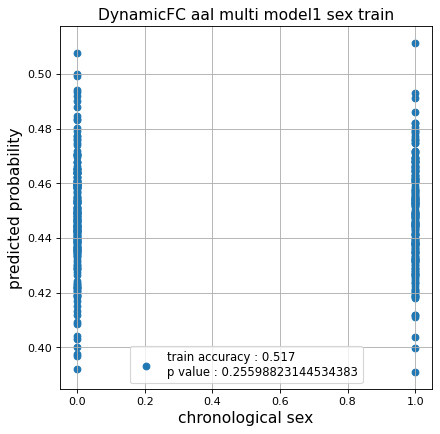

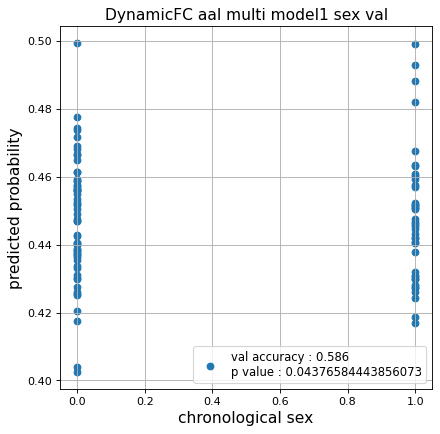

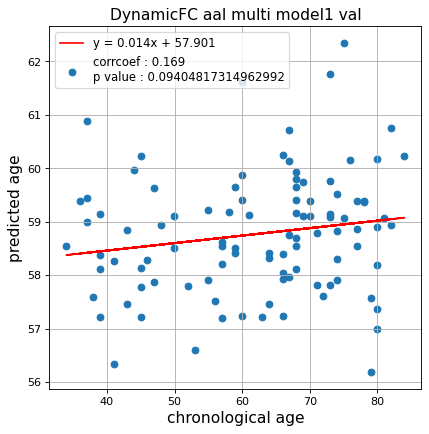

切片: 57.90061363621135
傾き: 0.01399026939141754
save_epochs:0


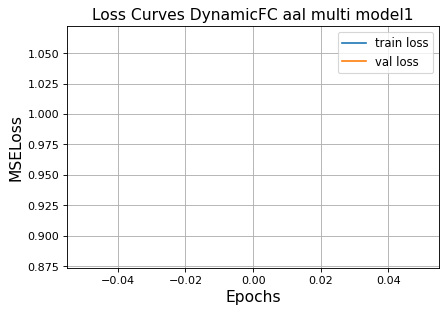

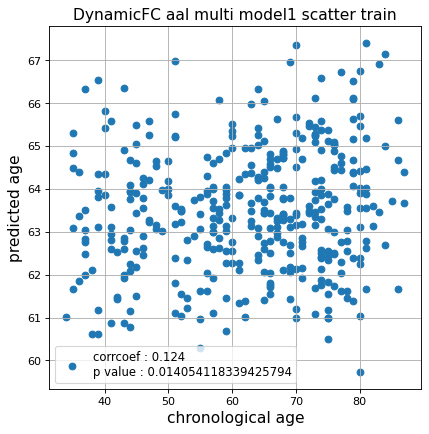

r^2 train data:  0.009228469744807621


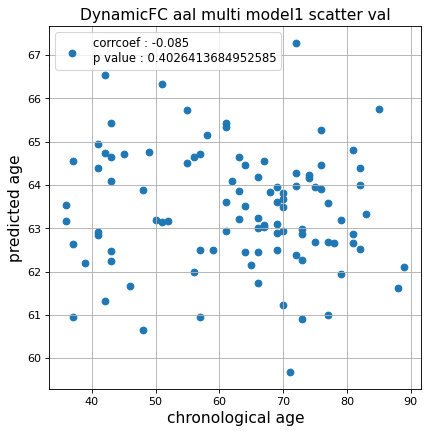

r^2 val data:  -0.028675869834219547


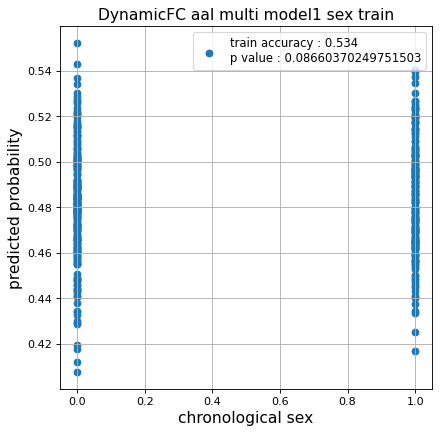

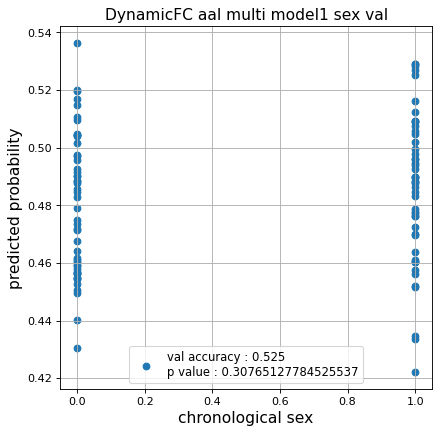

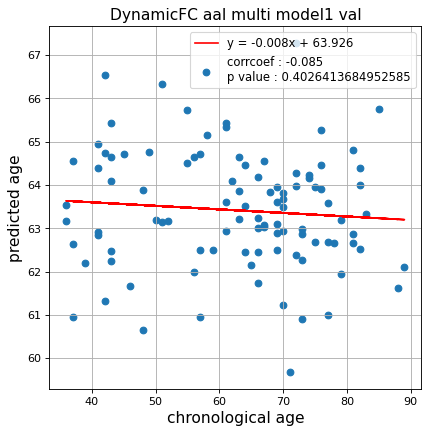

切片: 63.925991041469985
傾き: -0.008179791992046177
save_epochs:0


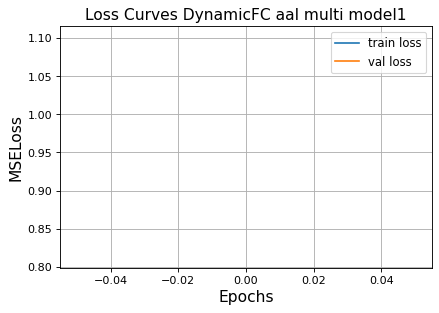

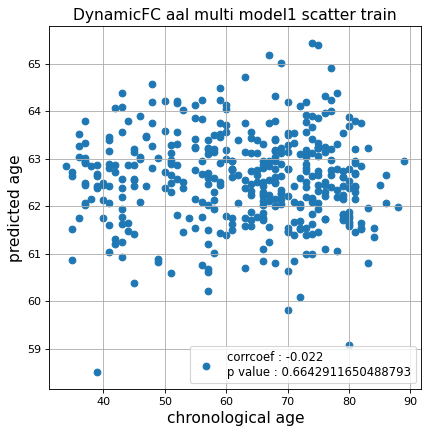

r^2 train data:  -0.008163843780685909


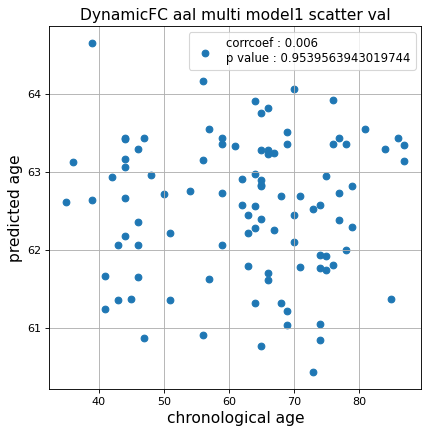

r^2 val data:  -0.0037560812165509105


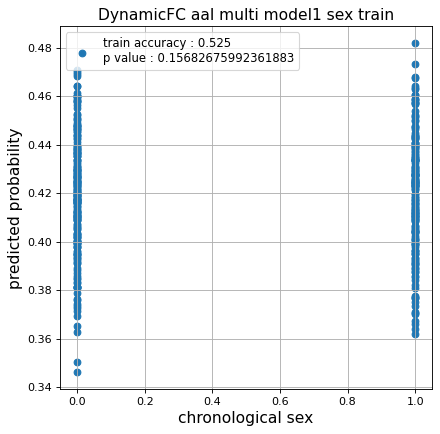

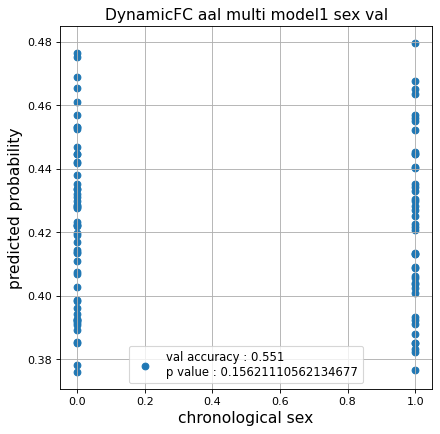

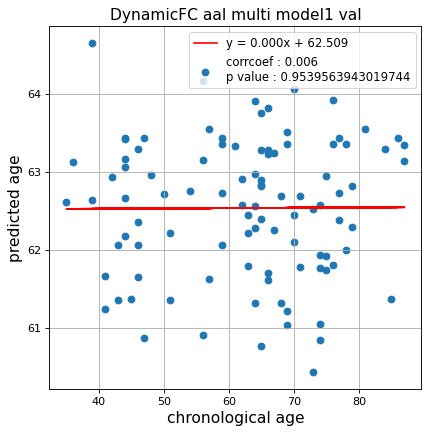

切片: 62.509315775243785
傾き: 0.0003961607697451025
save_epochs:0


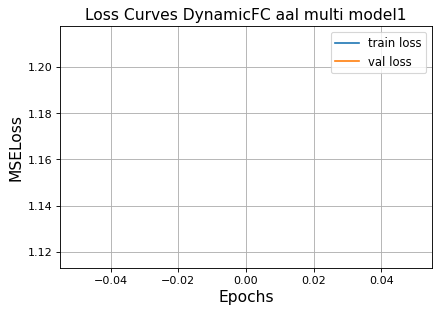

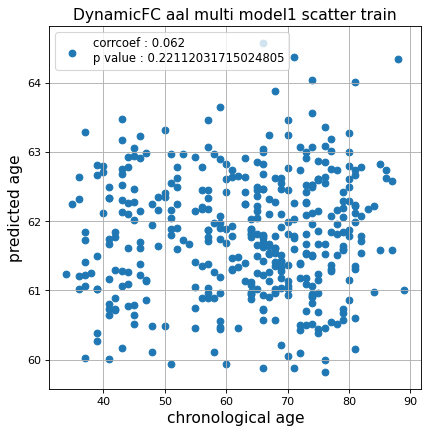

r^2 train data:  -0.003319927903557174


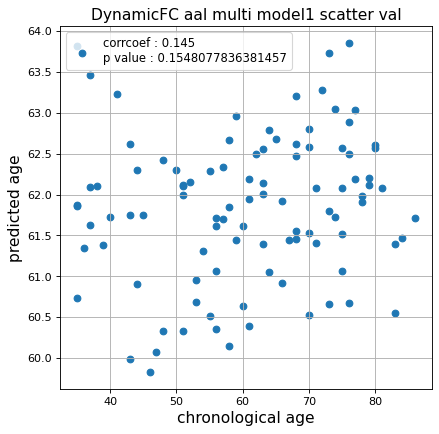

r^2 val data:  0.00918208443425228


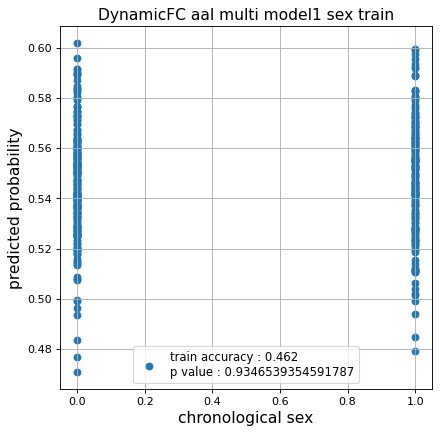

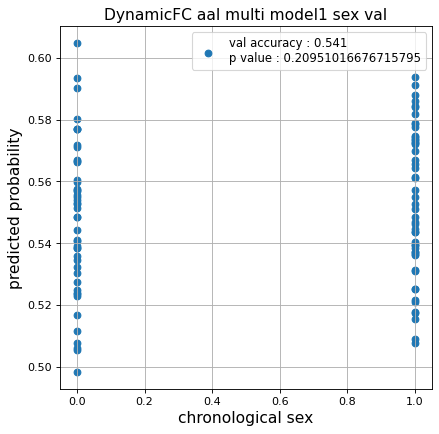

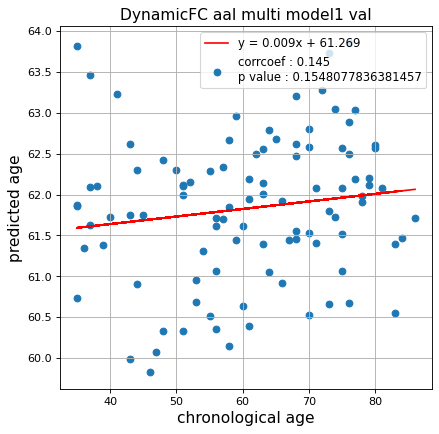

切片: 61.269245851302564
傾き: 0.009233320292989306
save_epochs:0


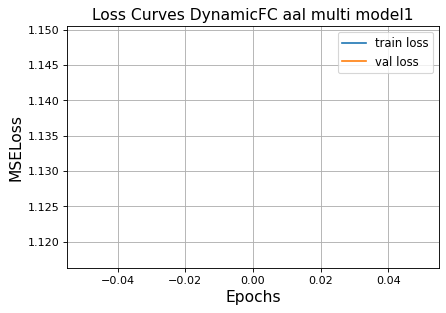

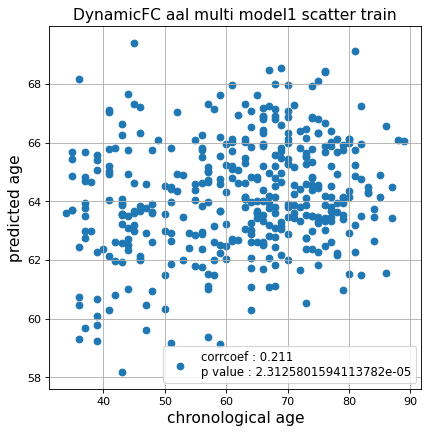

r^2 train data:  0.014127278091783046


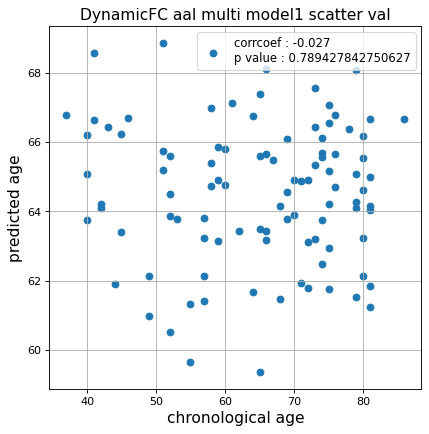

r^2 val data:  -0.03352760789888931


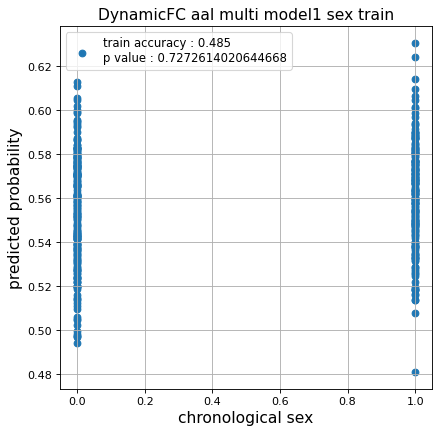

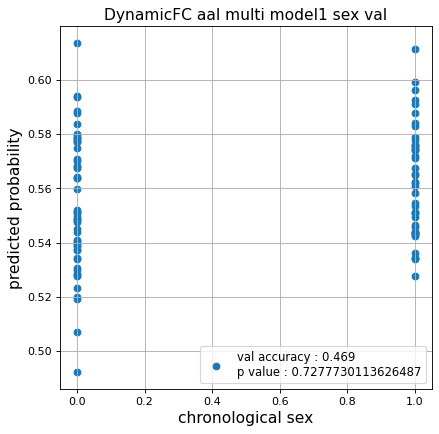

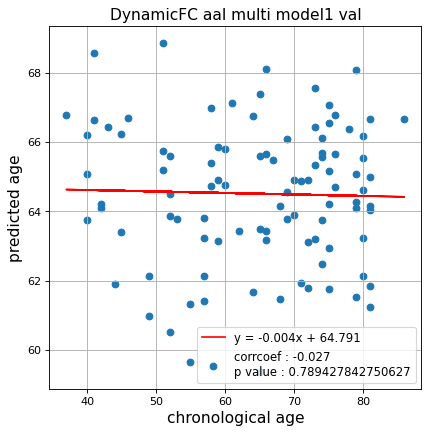

切片: 64.79122925988047
傾き: -0.004303804510319676
Nested Kfold ::: 5
save_epochs:0


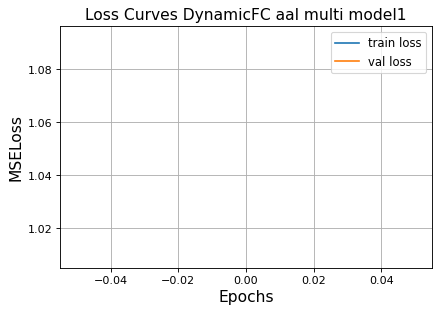

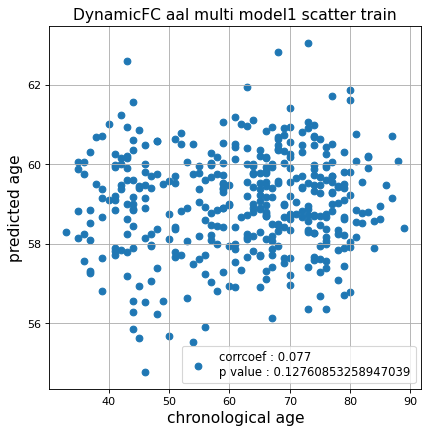

r^2 train data:  -0.042780501022328776


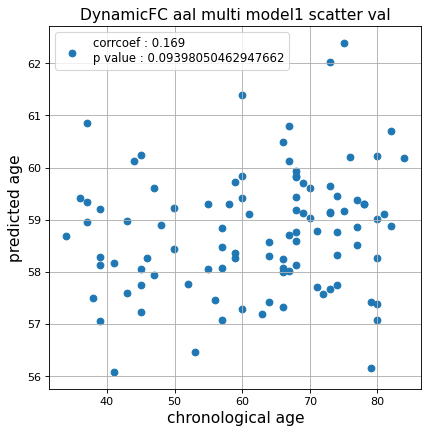

r^2 val data:  -0.034869301474556025


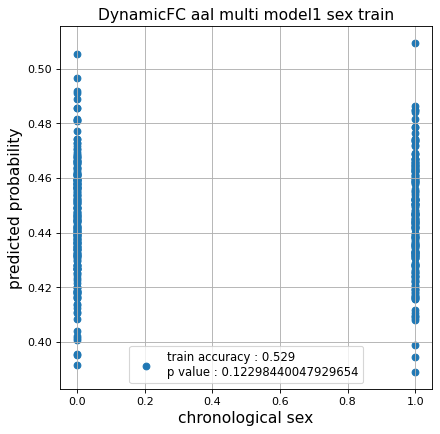

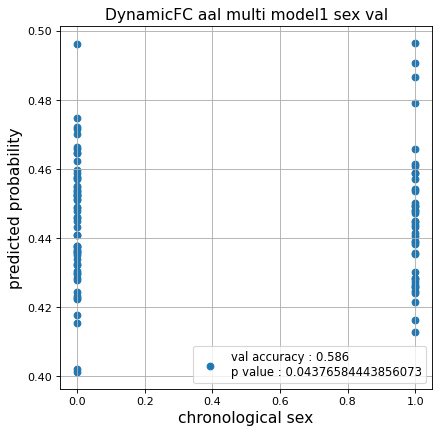

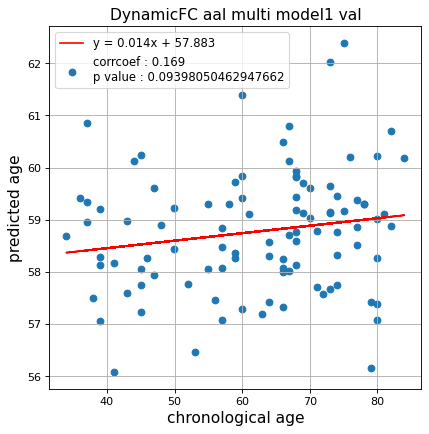

切片: 57.88271742721515
傾き: 0.014344940423614415
save_epochs:0


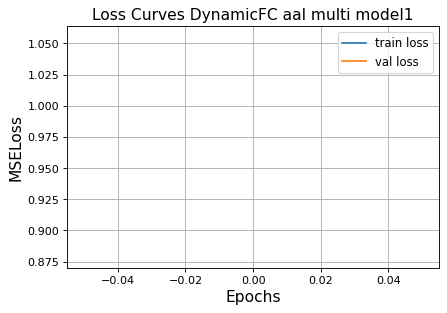

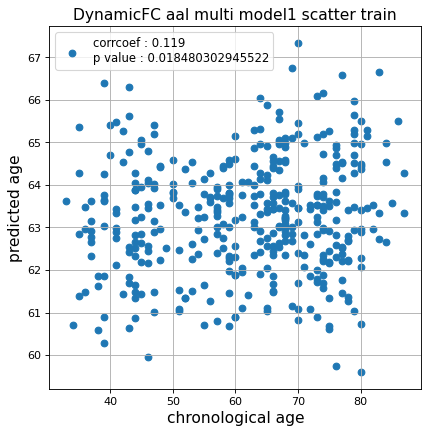

r^2 train data:  0.002659222676163253


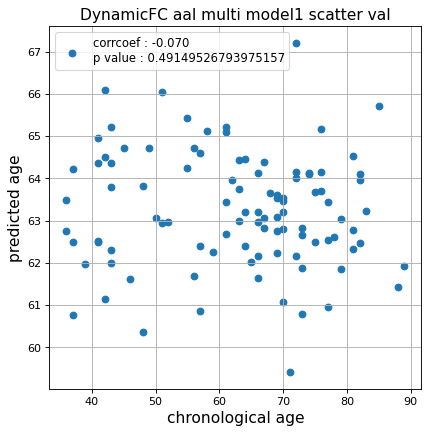

r^2 val data:  -0.024780139846875215


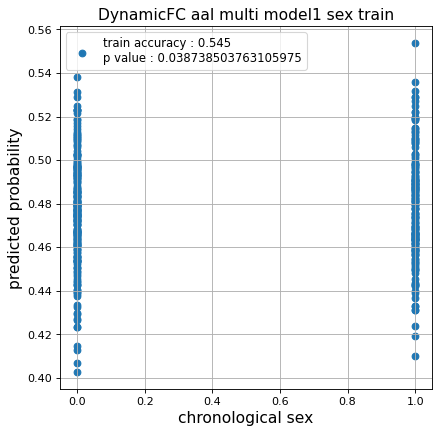

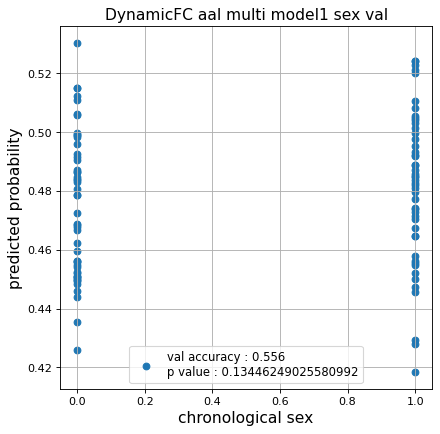

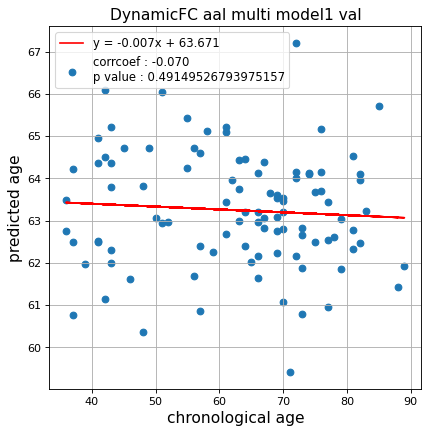

切片: 63.67071795254018
傾き: -0.006765978045003441
save_epochs:0


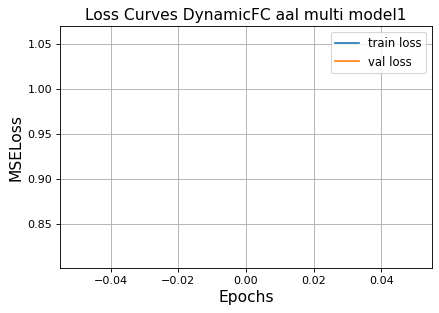

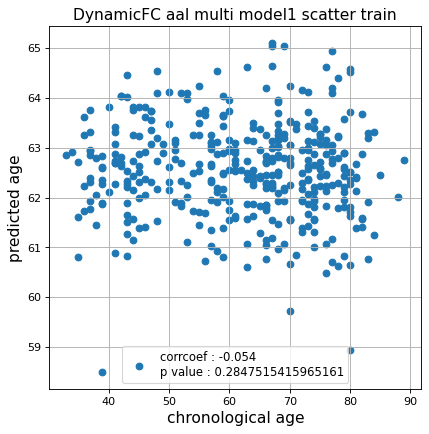

r^2 train data:  -0.014829540032518906


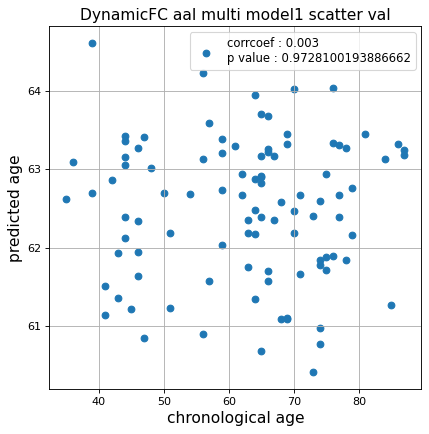

r^2 val data:  -0.004157030069883216


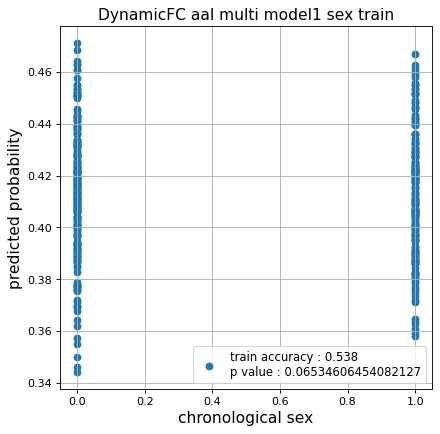

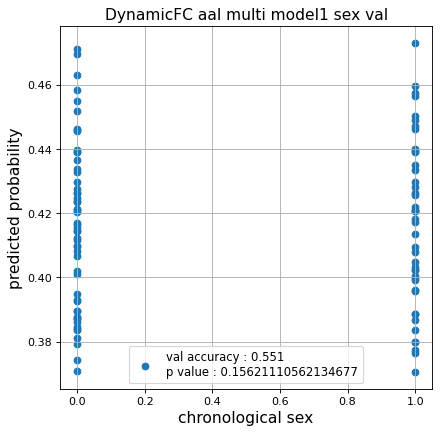

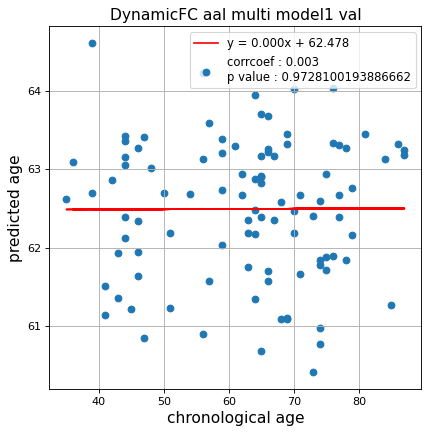

切片: 62.47835057766103
傾き: 0.00023690326853994785
save_epochs:0


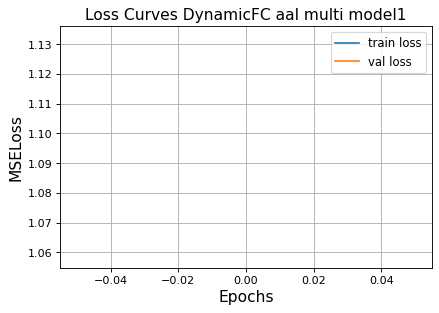

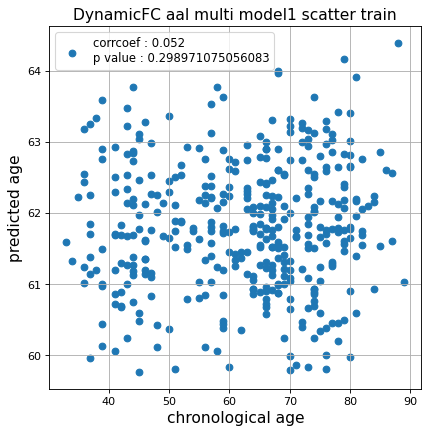

r^2 train data:  0.0015746752877876524


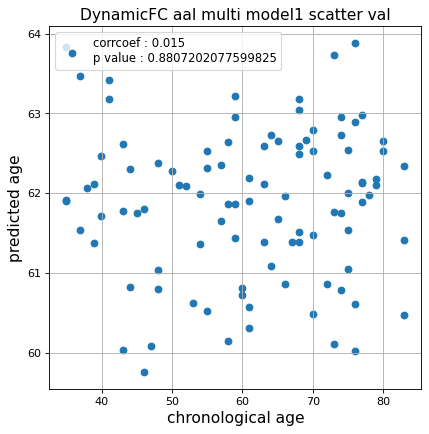

r^2 val data:  -0.005819055116855321


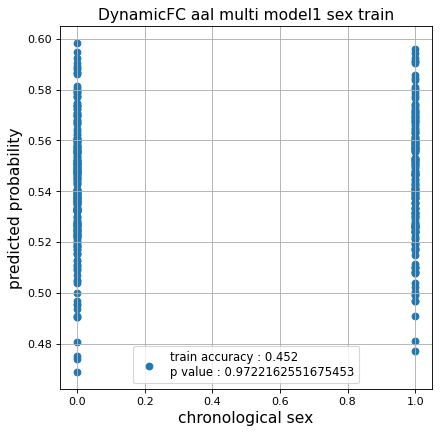

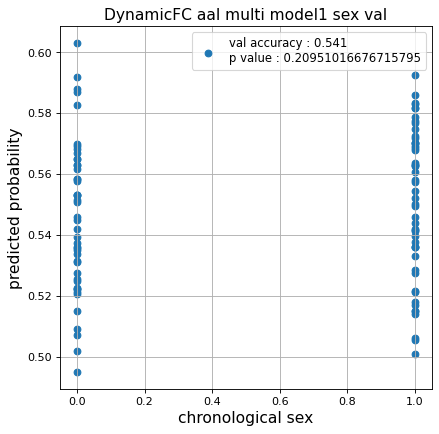

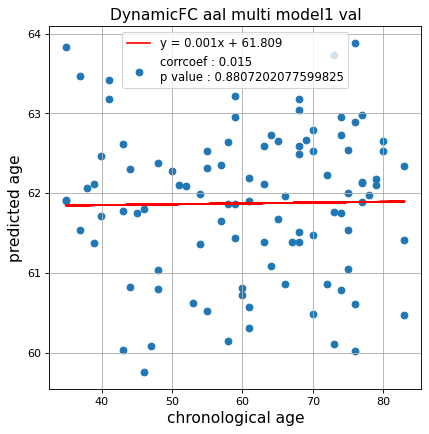

切片: 61.808797019140115
傾き: 0.001049593632627951
save_epochs:0


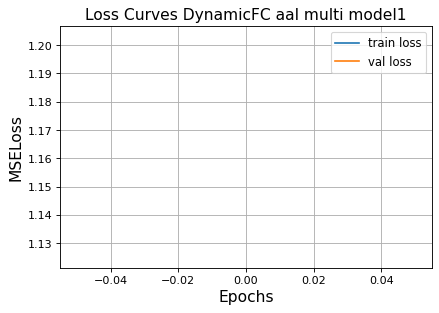

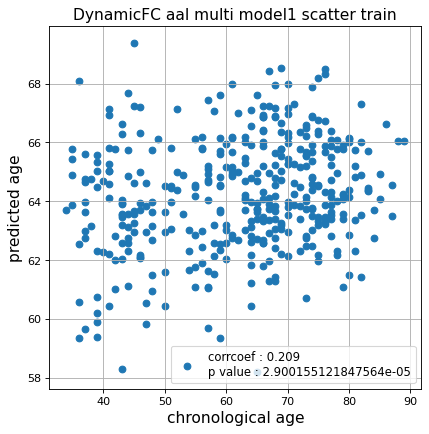

r^2 train data:  0.013101758178097556


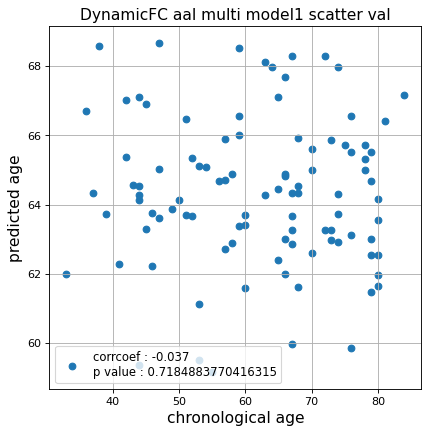

r^2 val data:  -0.07576994195974551


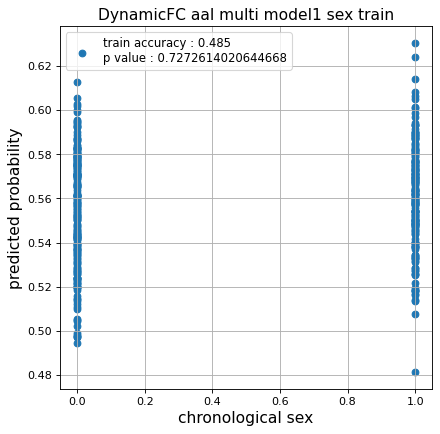

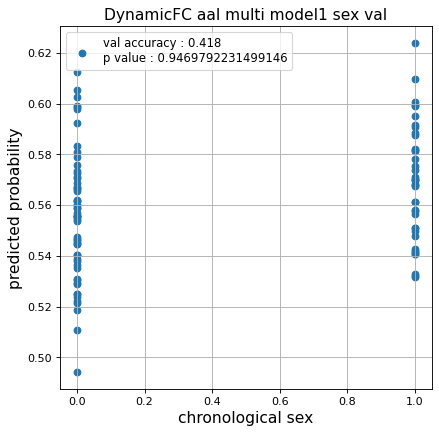

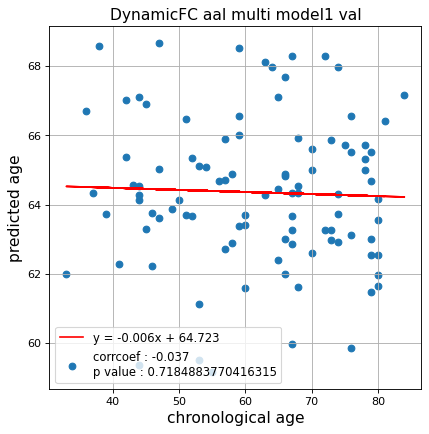

切片: 64.72285331798227
傾き: -0.005973156431849918
CPU times: user 17min 4s, sys: 20.5 s, total: 17min 25s
Wall time: 2min 49s


In [24]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_all_dynamic_1  = []
test_pred_aal_all_dynamic_inverse_1  = []
test_label_aal_all_dynamic_1 = []

test_idx_aal_all_dynamic_1   = []
train_idx_aal_all_dynamic_1  = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_inverse,test_label = train_model(data_dynamic_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1,
                                                           d_model    = 64,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 256,
                                                           nhead      = 2,#4
                                                           hidden_dim_transformer = 1,#2
                                                           pos_drop    = 0.3,
                                                           trans_drop = 0.5,
                                                           fc_drop = 0.3,
                                                           title = 'DynamicFC aal multi model1'
                                                          )
    
    test_pred_aal_all_dynamic_1.append(test_pred)
    test_pred_aal_all_dynamic_inverse_1.append(test_pred_inverse)
    test_label_aal_all_dynamic_1.append(test_label)

    test_idx_aal_all_dynamic_1.append(test_idx)
    train_idx_aal_all_dynamic_1.append(train_idx)

### Dynamic FC 2

Nested Kfold ::: 1
save_epochs:0


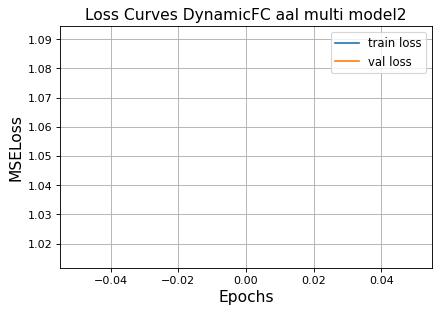

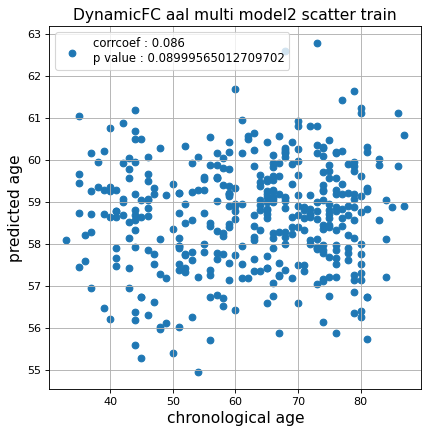

r^2 train data:  -0.06902487665858459


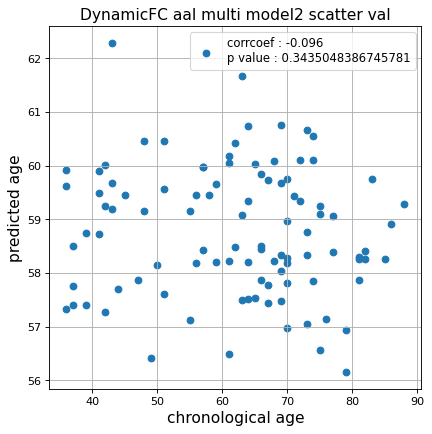

r^2 val data:  -0.07589063515947969


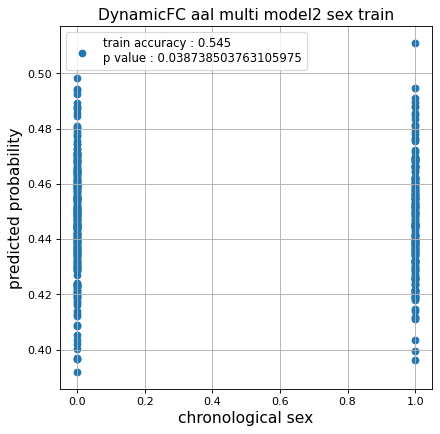

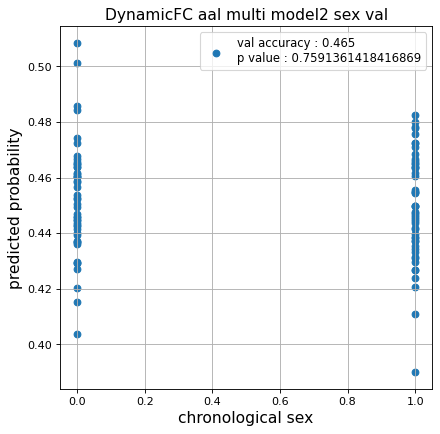

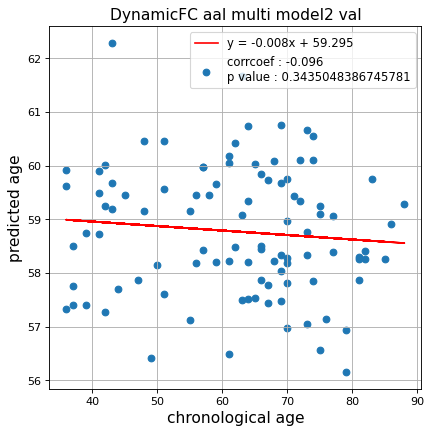

切片: 59.29462032678888
傾き: -0.0083640942884789
save_epochs:0


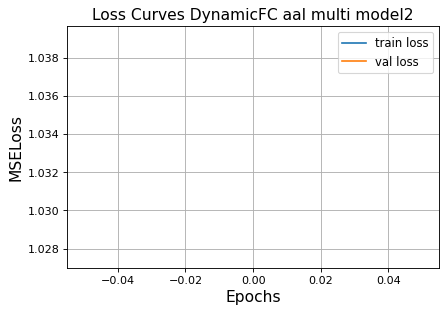

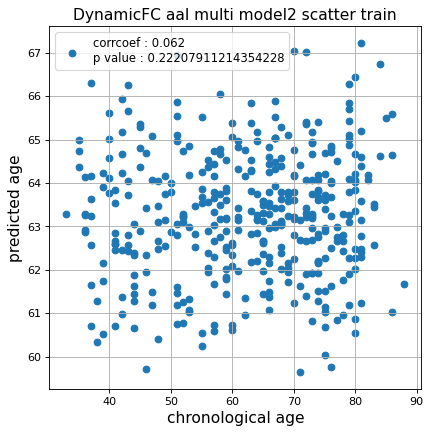

r^2 train data:  -0.0033680328581708885


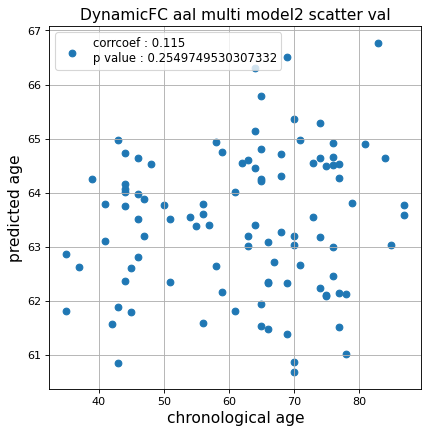

r^2 val data:  0.003051673438972613


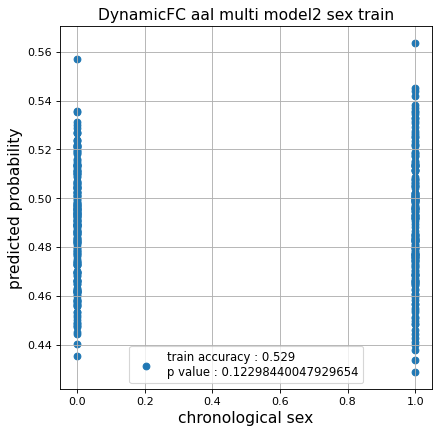

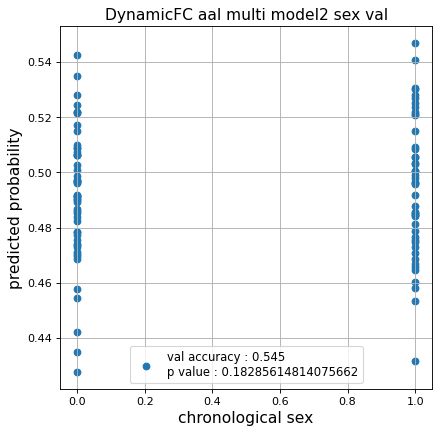

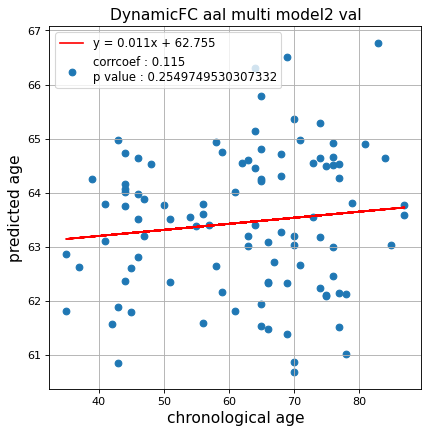

切片: 62.755019185802254
傾き: 0.011181346146098309
save_epochs:0


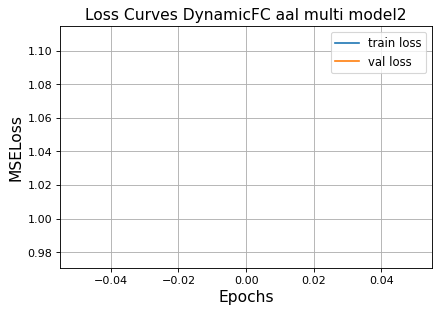

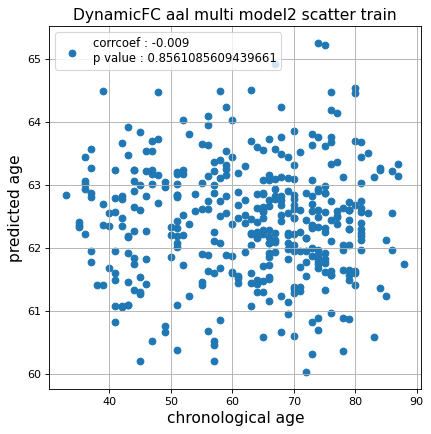

r^2 train data:  -0.006279050023934474


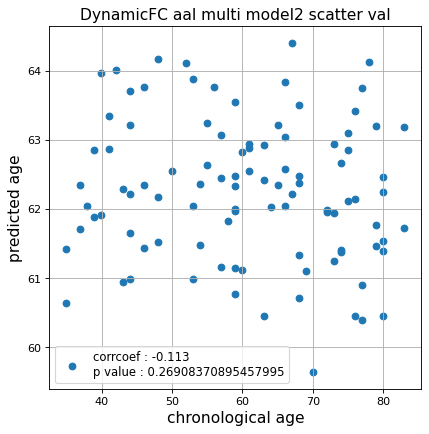

r^2 val data:  -0.037280930199313556


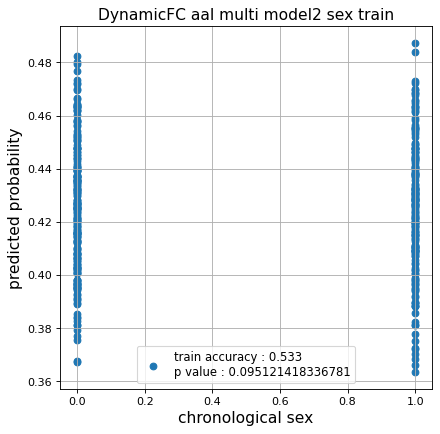

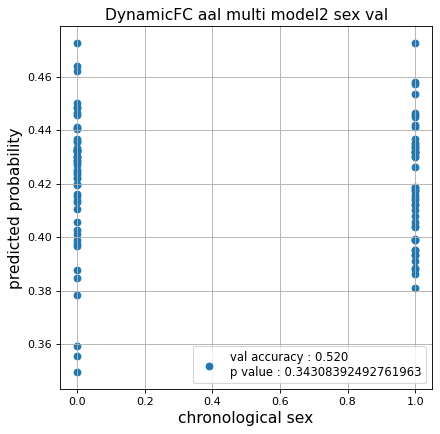

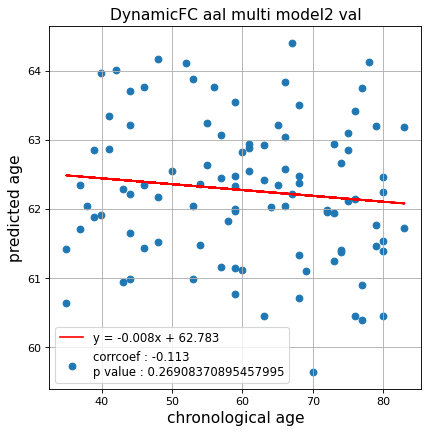

切片: 62.78326543173627
傾き: -0.00845847926883728
save_epochs:0


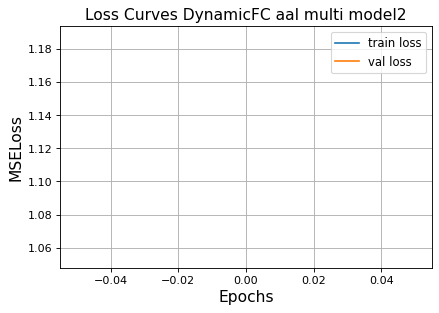

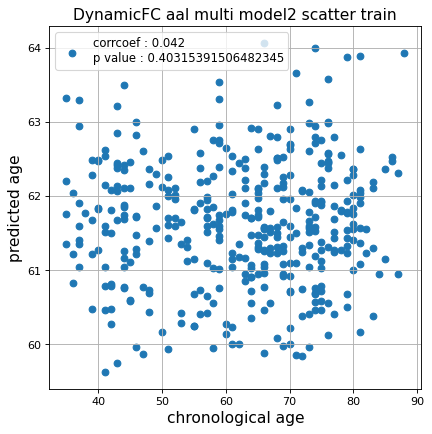

r^2 train data:  -0.0012115327059305514


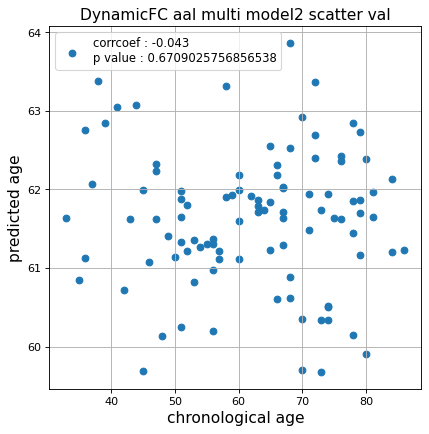

r^2 val data:  -0.010844627464248857


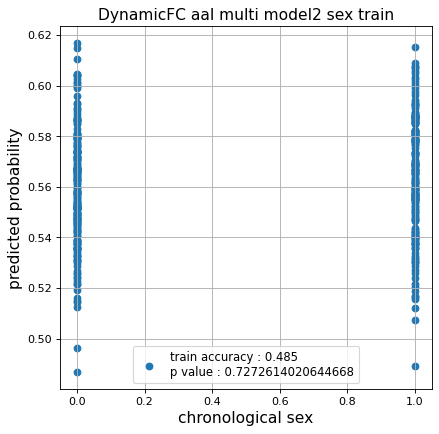

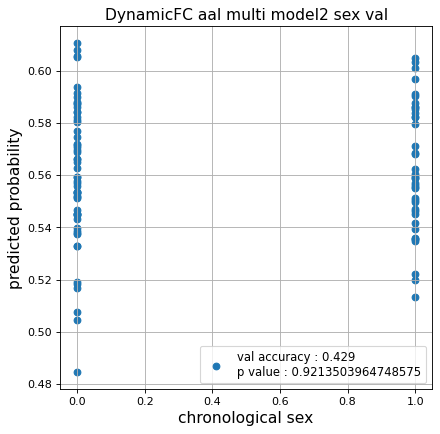

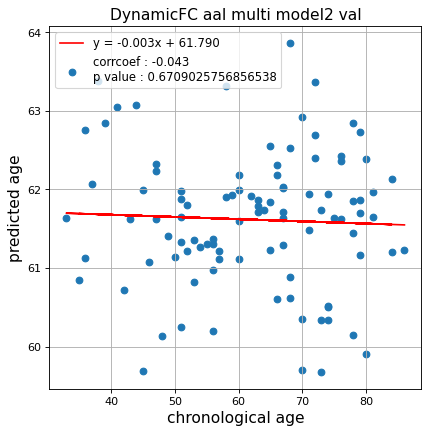

切片: 61.79006083275984
傾き: -0.0028146937919378
save_epochs:0


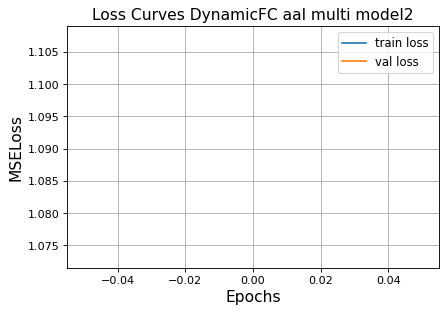

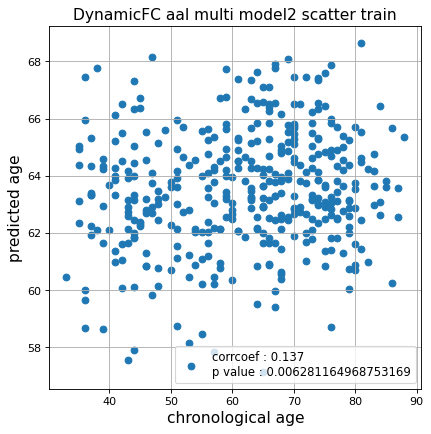

r^2 train data:  0.00014107075769964617


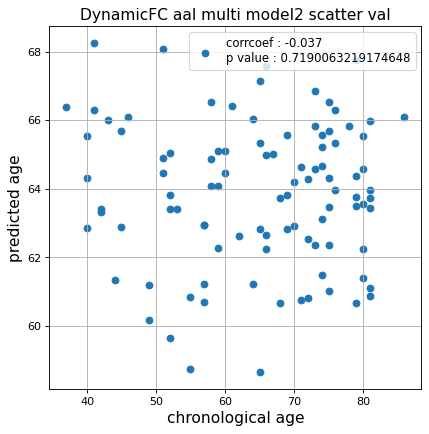

r^2 val data:  -0.04286748615929459


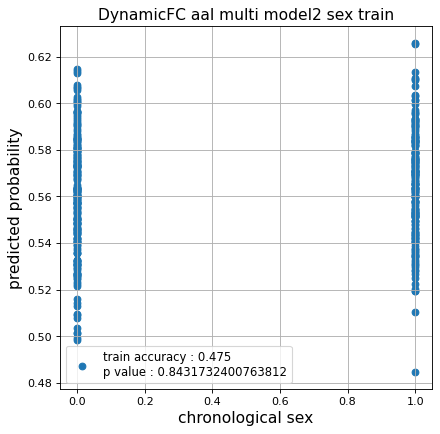

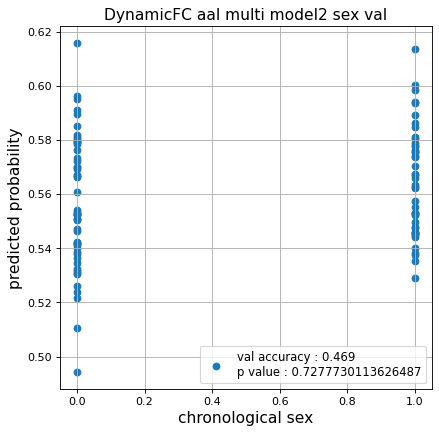

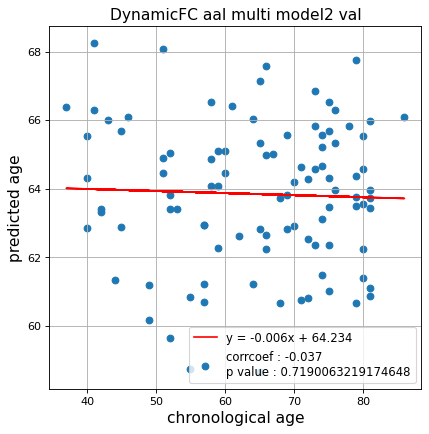

切片: 64.23353526003015
傾き: -0.006030707059189768
Nested Kfold ::: 2
save_epochs:0


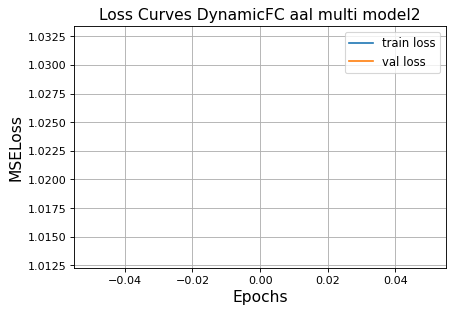

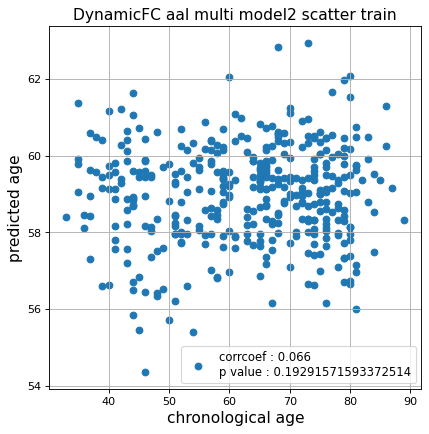

r^2 train data:  -0.07782396169067352


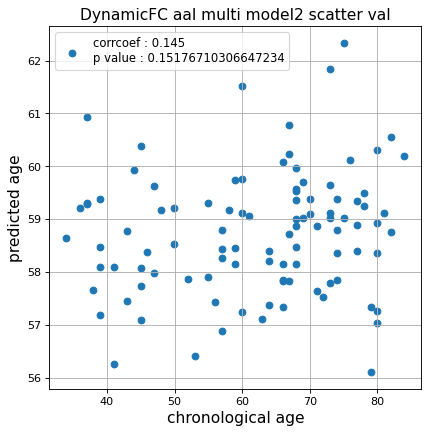

r^2 val data:  -0.04022452747867766


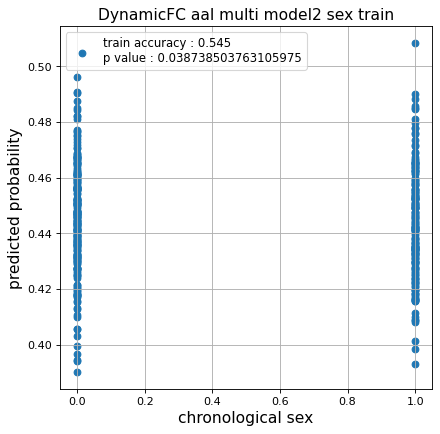

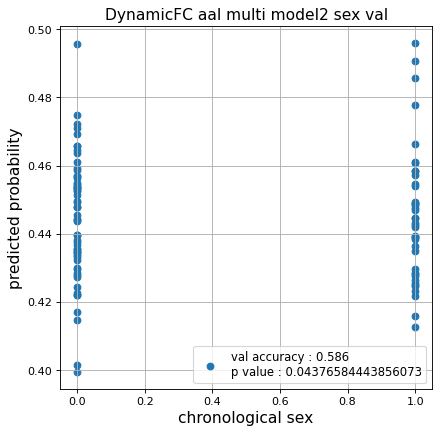

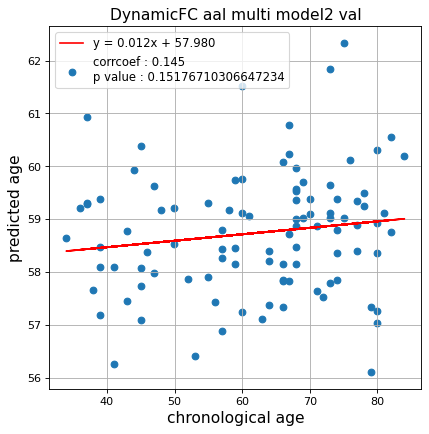

切片: 57.98034669761289
傾き: 0.012217666714414111
save_epochs:0


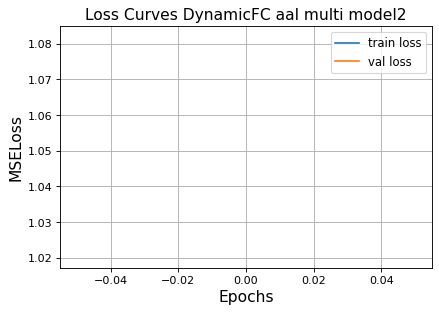

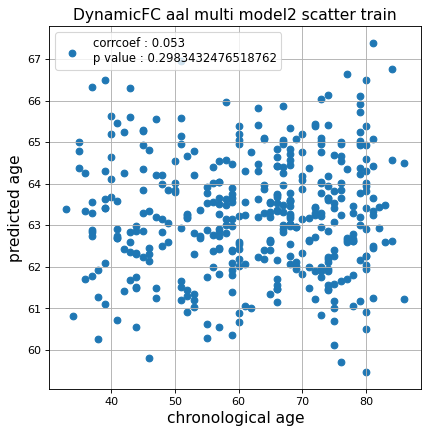

r^2 train data:  -0.0046952919118614656


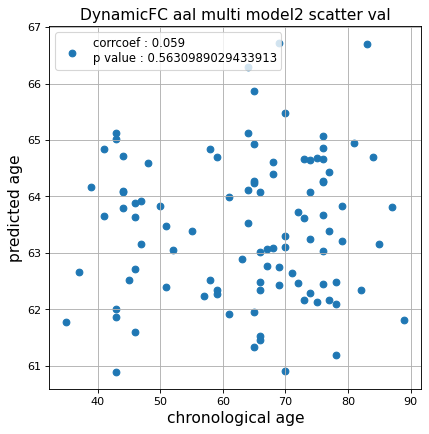

r^2 val data:  0.0013645252597025426


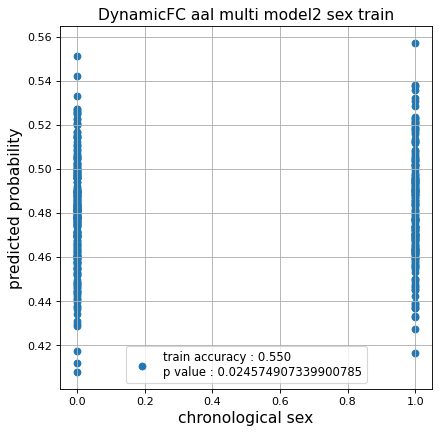

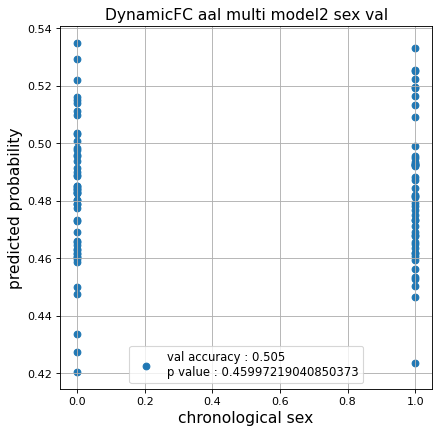

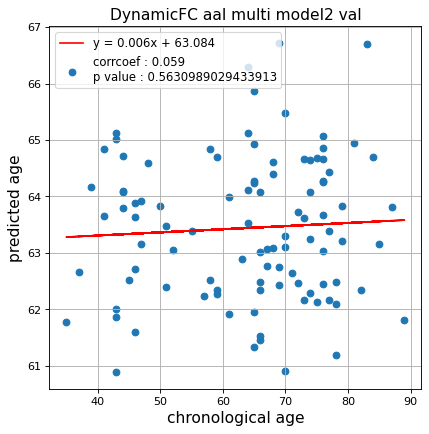

切片: 63.08409940221885
傾き: 0.005563890009882366
save_epochs:0


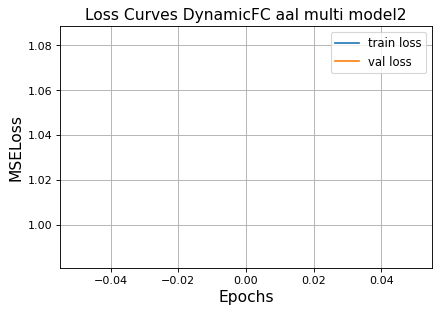

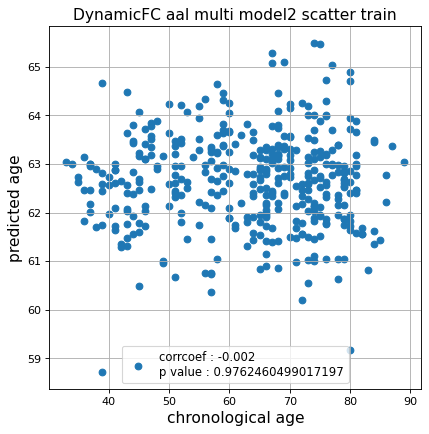

r^2 train data:  -0.006826539352690952


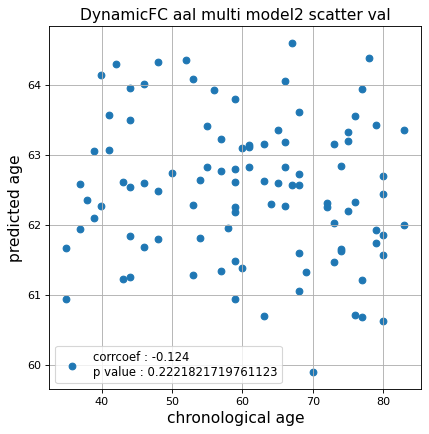

r^2 val data:  -0.04317941468902742


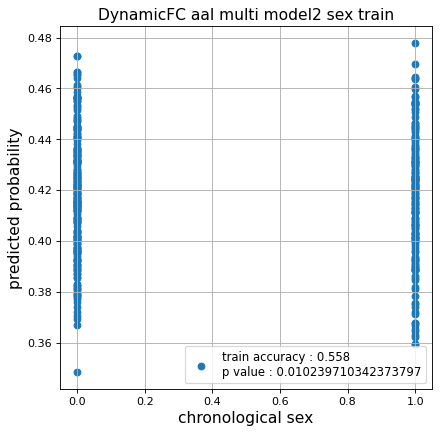

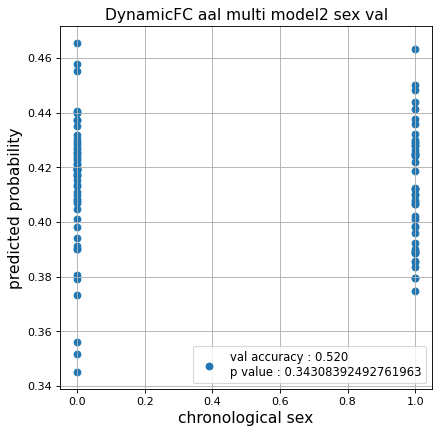

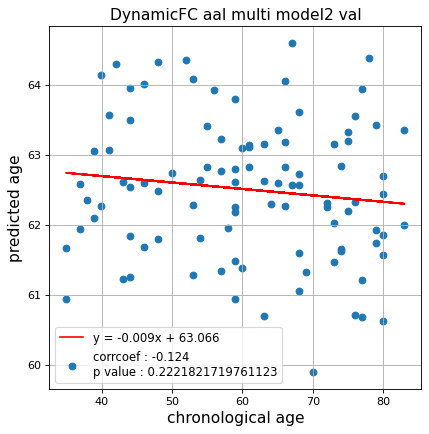

切片: 63.066223555922484
傾き: -0.009194669608204784
save_epochs:0


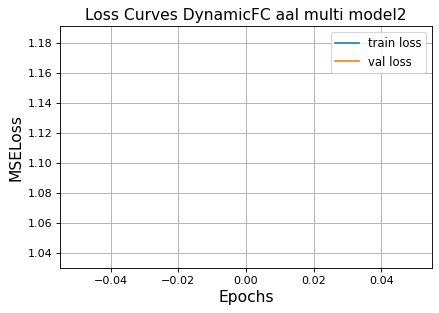

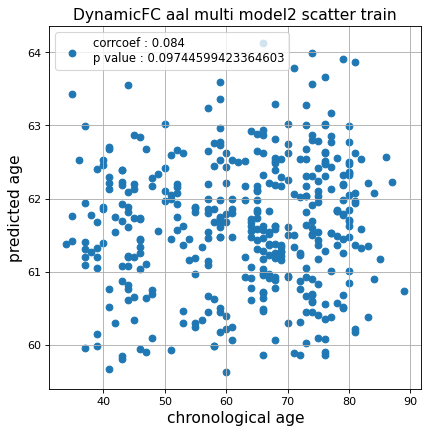

r^2 train data:  -0.0006546609608562015


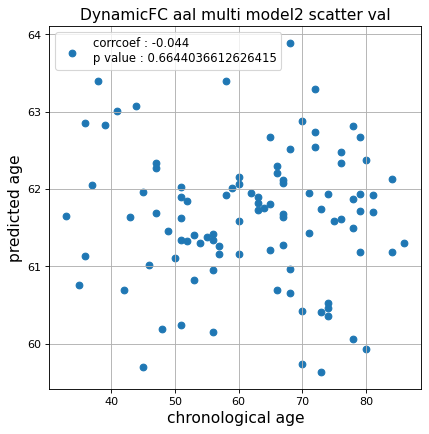

r^2 val data:  -0.010908541539090377


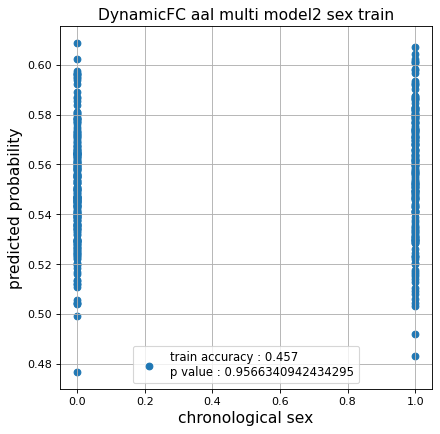

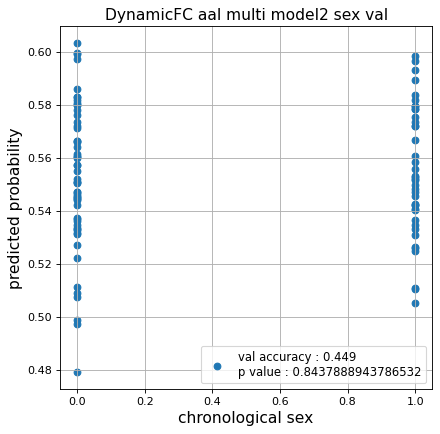

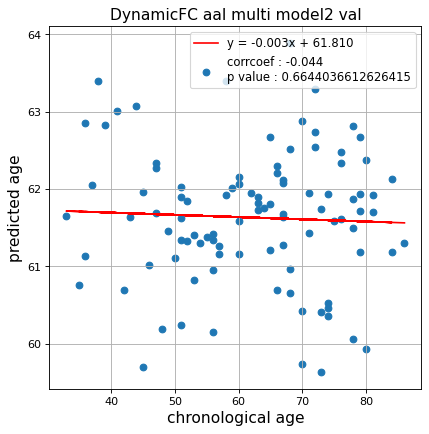

切片: 61.809711135929184
傾き: -0.002877832021384284
save_epochs:0


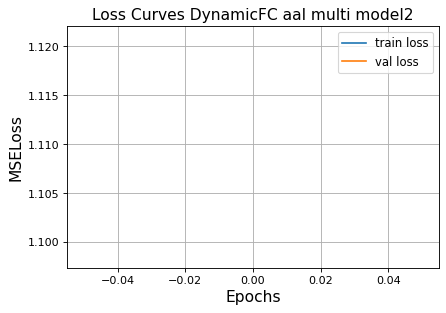

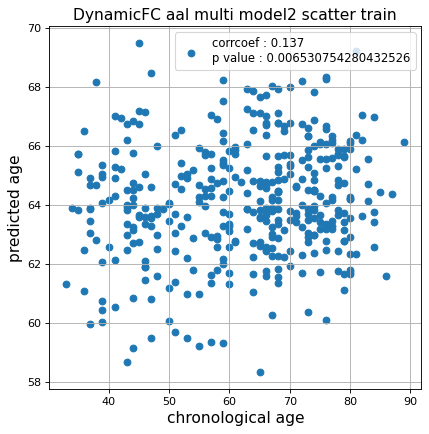

r^2 train data:  -0.0030303078298630215


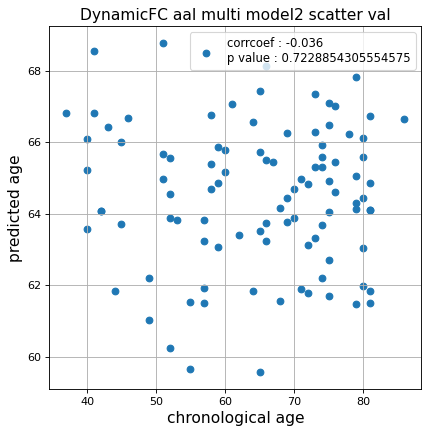

r^2 val data:  -0.035689373462812535


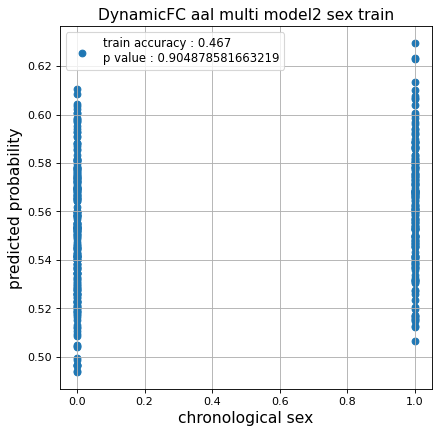

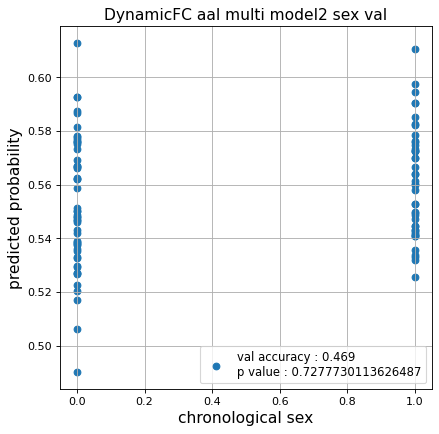

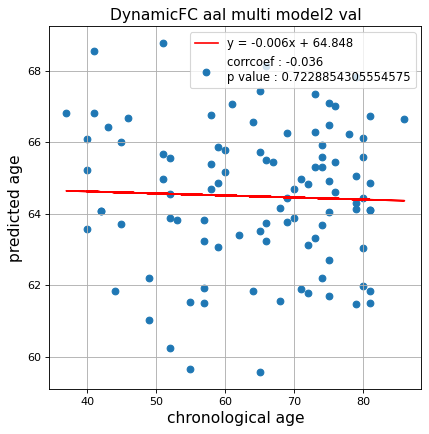

切片: 64.84800136777636
傾き: -0.005646916716515295
Nested Kfold ::: 3
save_epochs:0


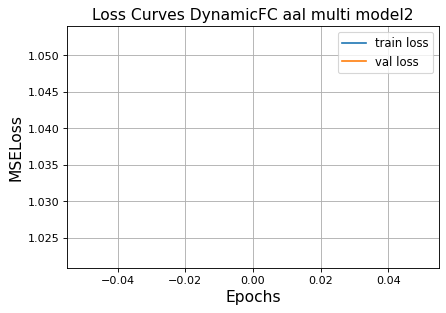

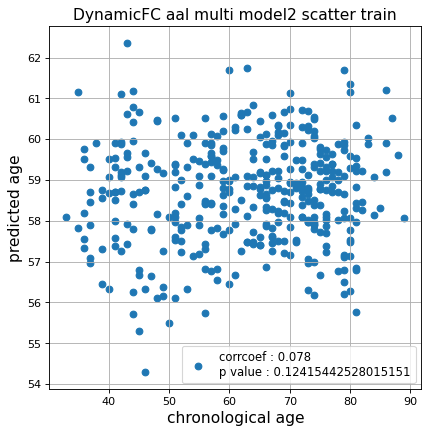

r^2 train data:  -0.08293627678243598


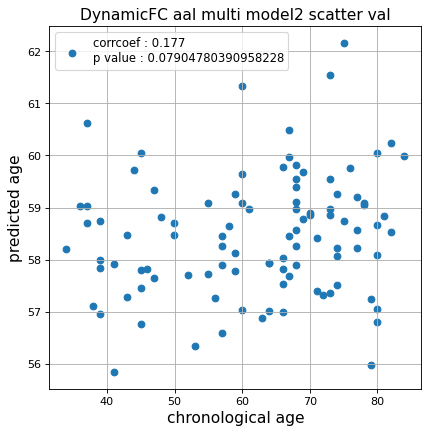

r^2 val data:  -0.044467962647692705


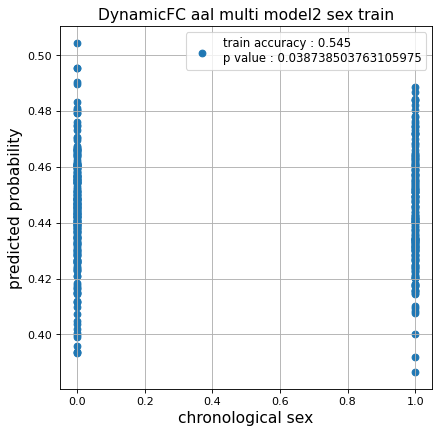

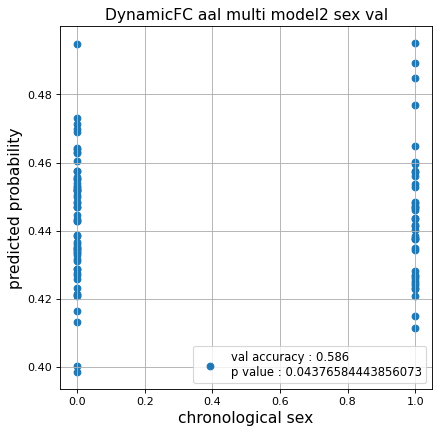

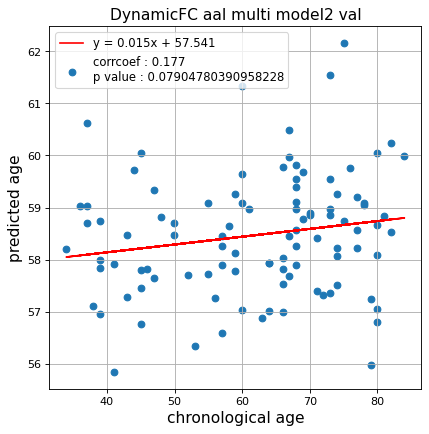

切片: 57.54115695936261
傾き: 0.01499796492214664
save_epochs:0


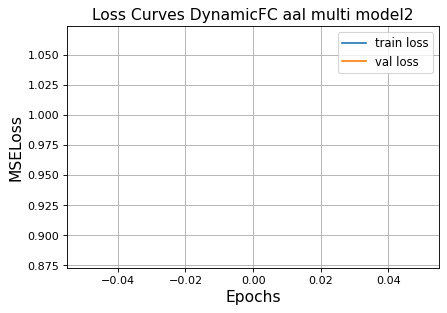

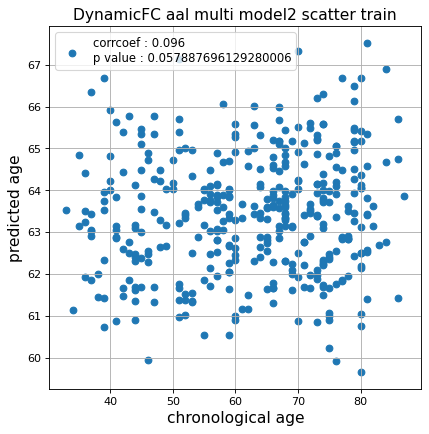

r^2 train data:  0.004492168401915464


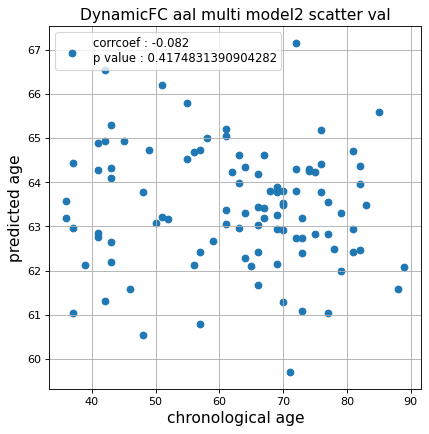

r^2 val data:  -0.02757143794739414


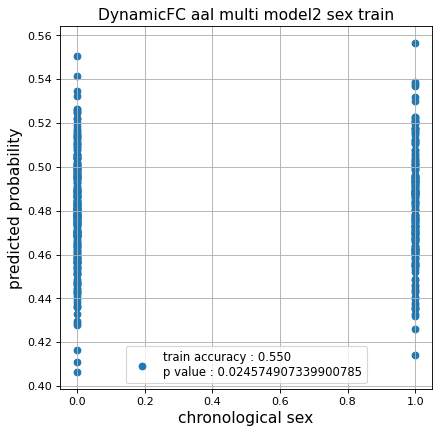

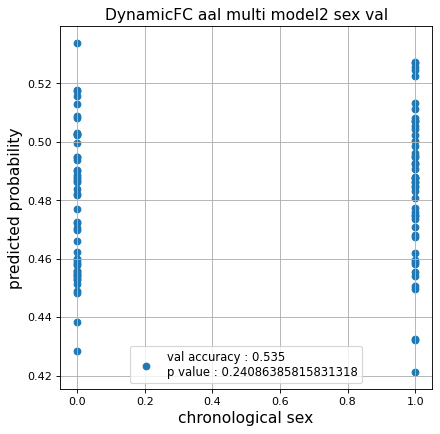

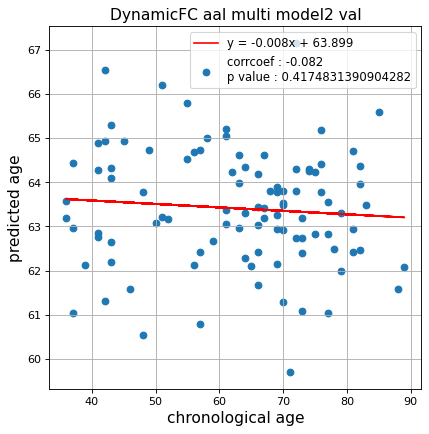

切片: 63.898981756954456
傾き: -0.0077923594617761915
save_epochs:0


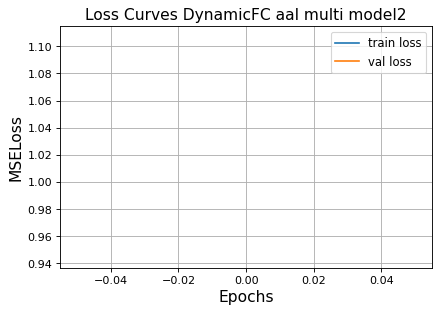

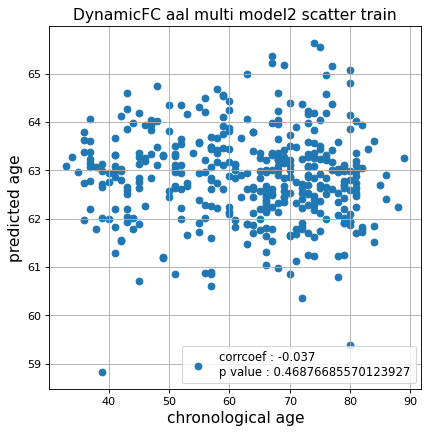

r^2 train data:  -0.010072955920649829


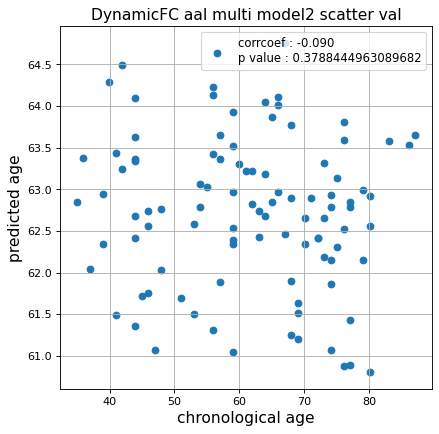

r^2 val data:  -0.026783796255832604


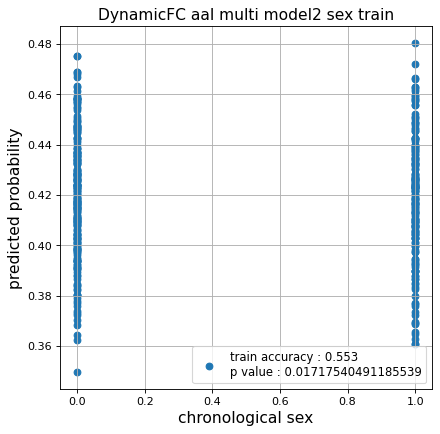

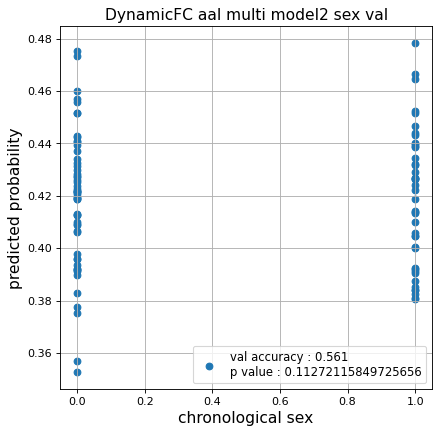

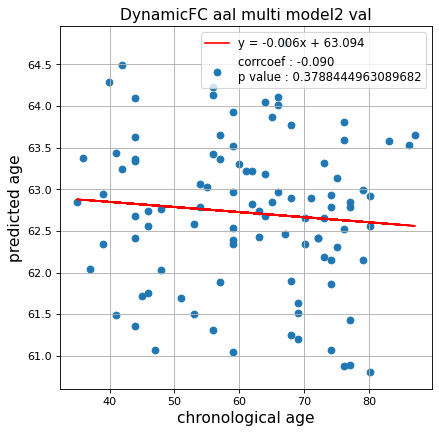

切片: 63.09405885109612
傾き: -0.006134261785435112
save_epochs:0


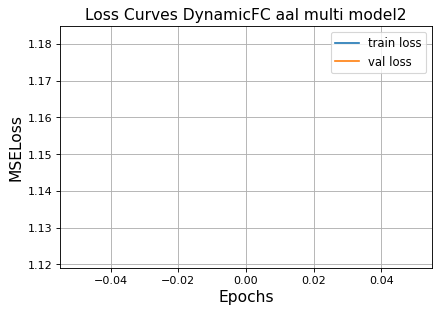

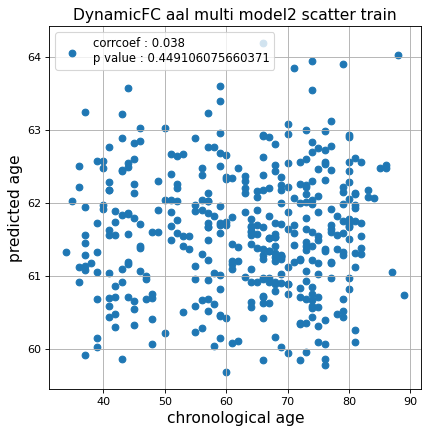

r^2 train data:  -0.00565004914156475


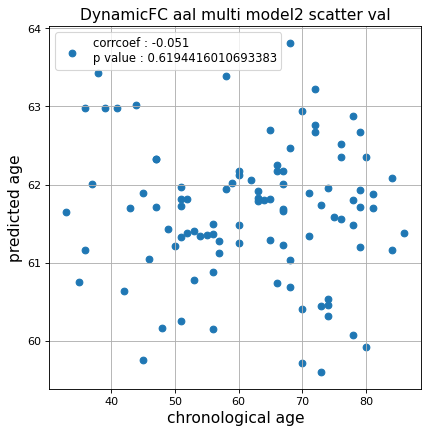

r^2 val data:  -0.011755398045060428


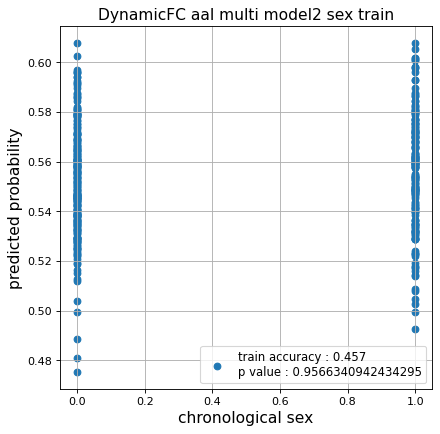

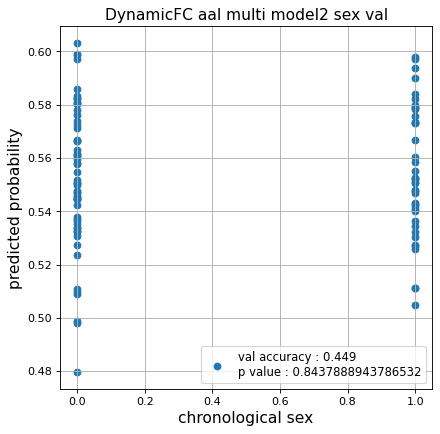

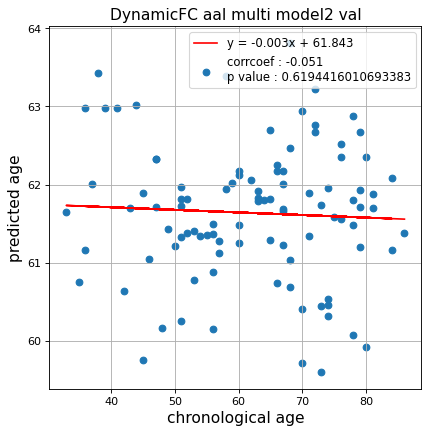

切片: 61.842923565523606
傾き: -0.003303954513812919
save_epochs:0


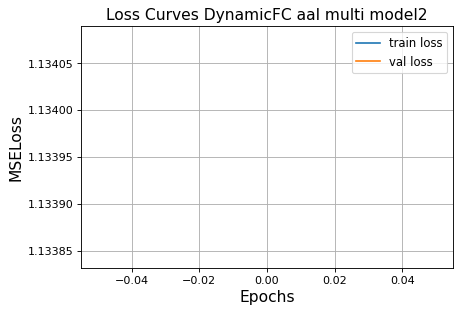

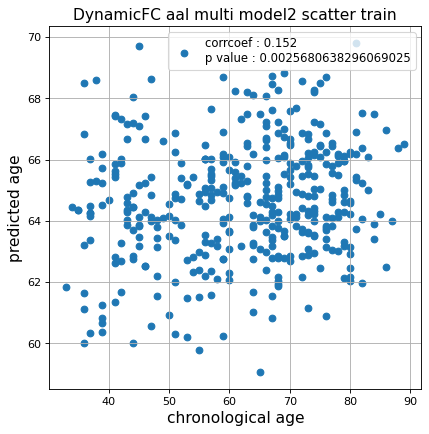

r^2 train data:  -0.014069849348202546


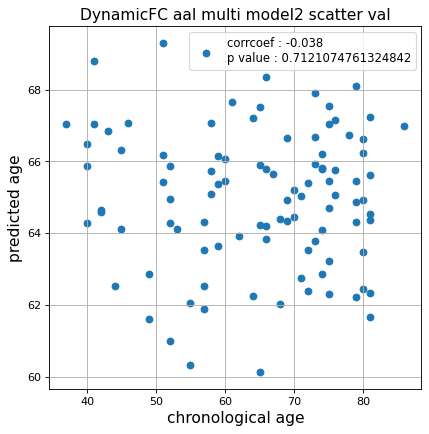

r^2 val data:  -0.03451703541738671


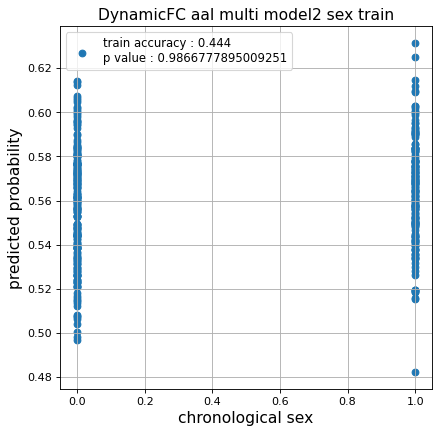

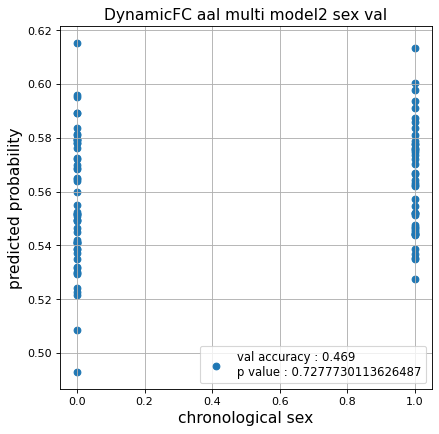

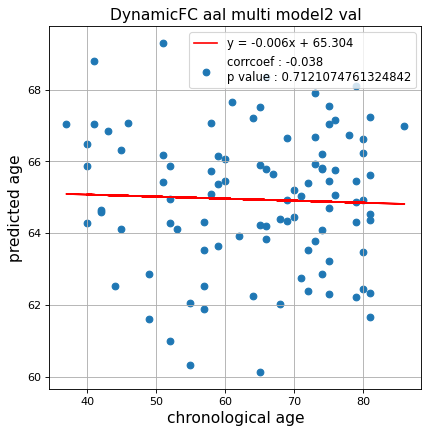

切片: 65.30372061263998
傾き: -0.005679002283207022
Nested Kfold ::: 4
save_epochs:0


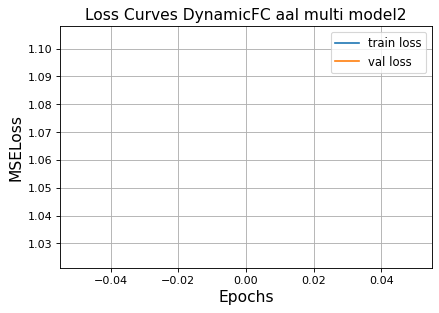

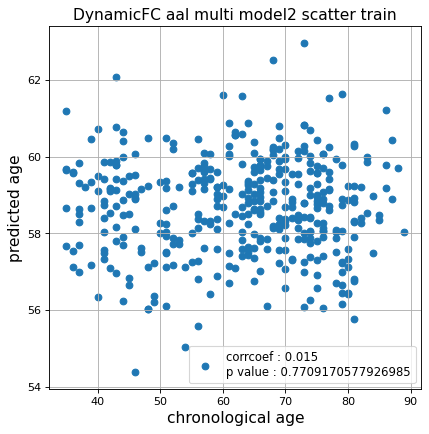

r^2 train data:  -0.09072535165285167


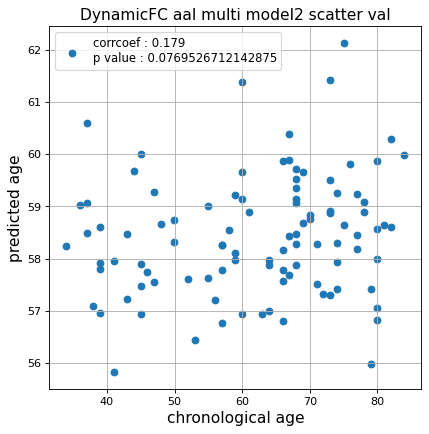

r^2 val data:  -0.04556499466198627


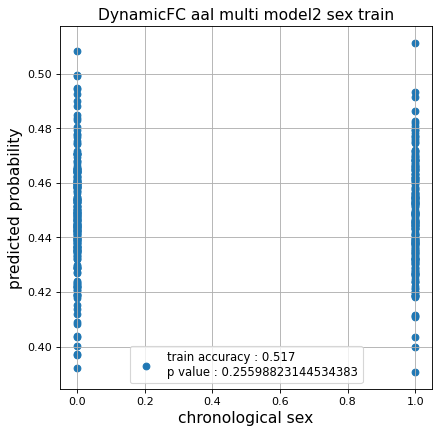

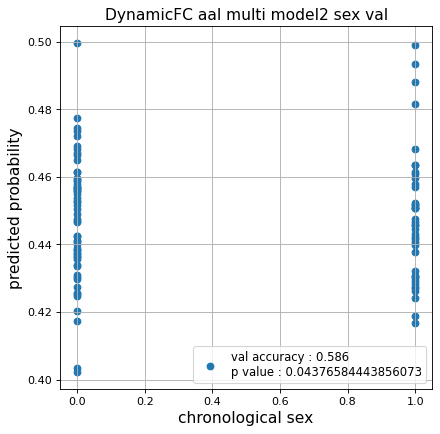

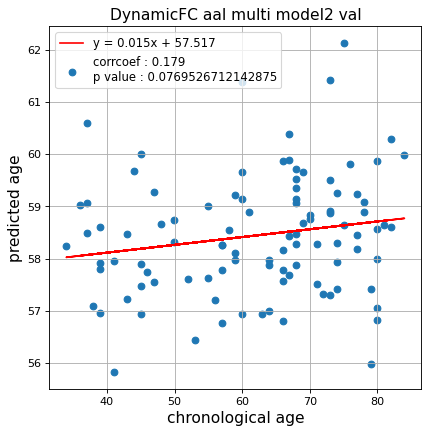

切片: 57.516504208815135
傾き: 0.014923120378930003
save_epochs:0


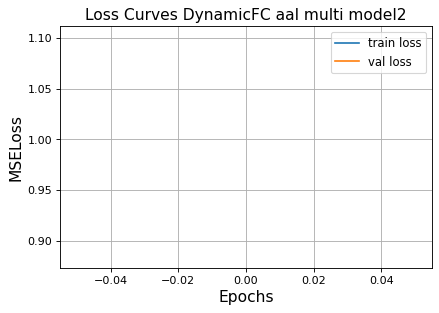

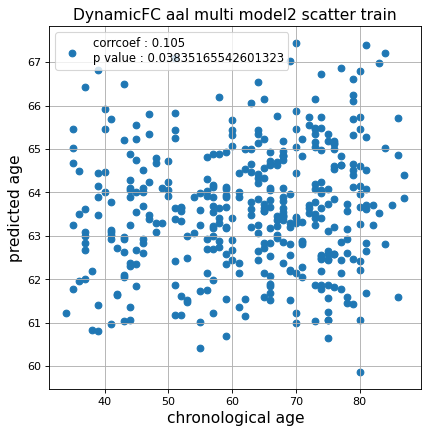

r^2 train data:  0.0038913342131247086


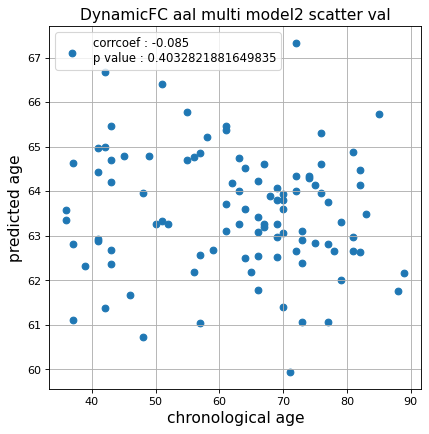

r^2 val data:  -0.029183770662077002


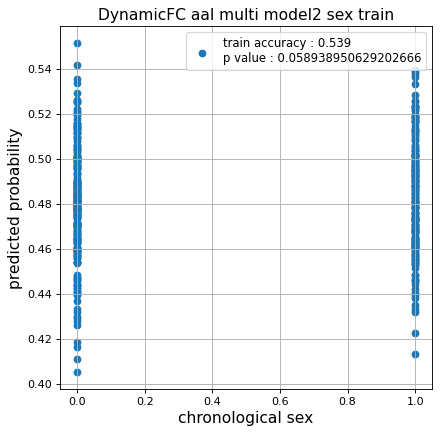

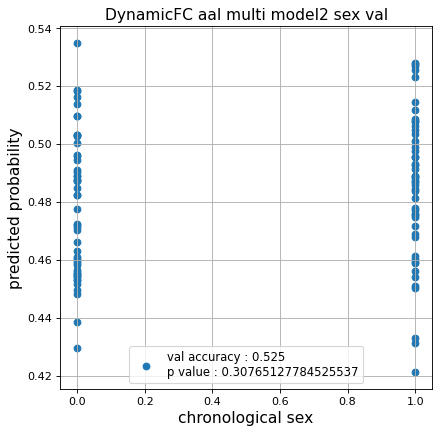

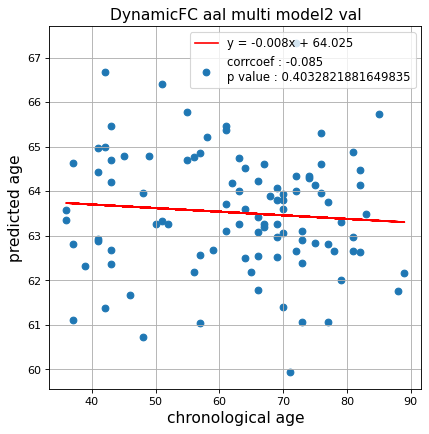

切片: 64.02494934266028
傾き: -0.008085778345094052
save_epochs:0


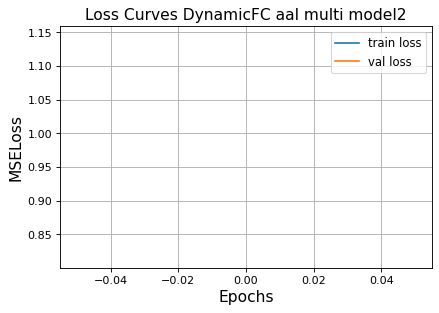

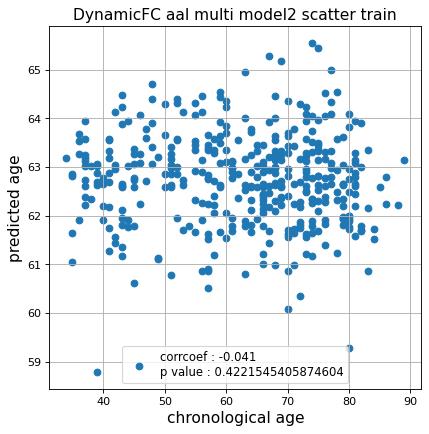

r^2 train data:  -0.010839930722682523


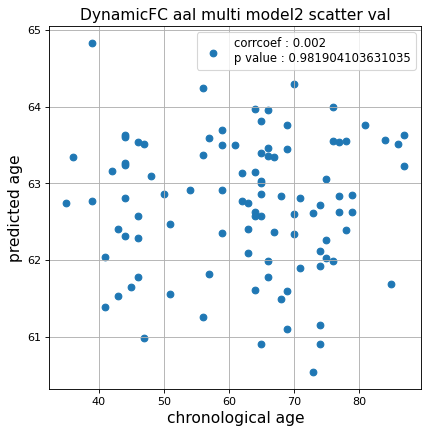

r^2 val data:  -0.004473495748156253


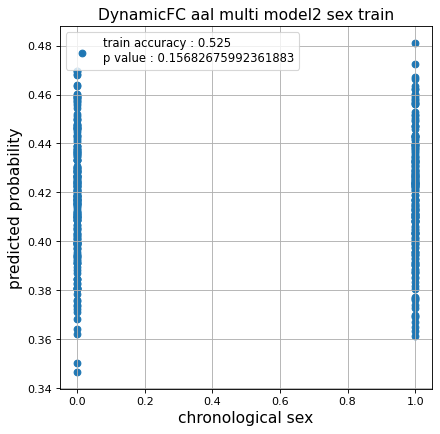

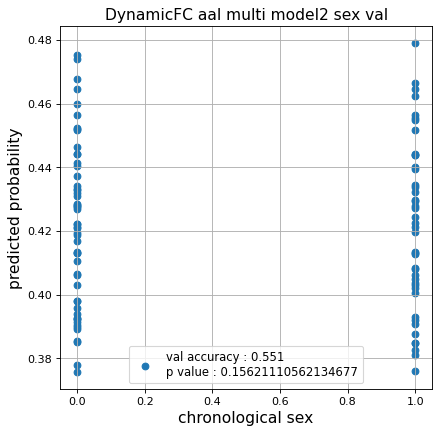

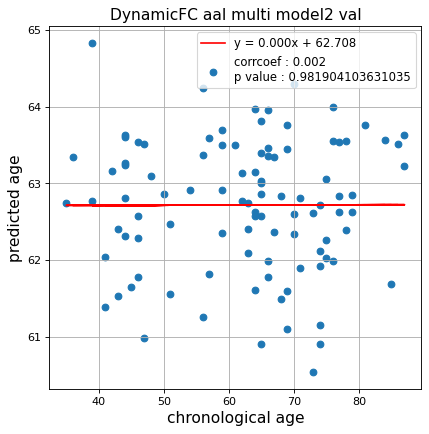

切片: 62.70754228233742
傾き: 0.00015272652155501424
save_epochs:0


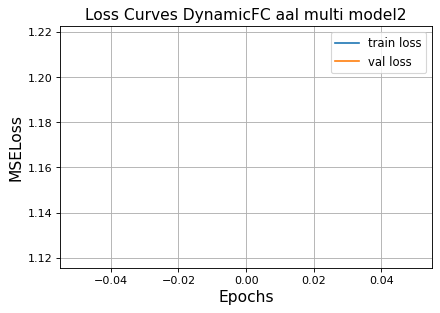

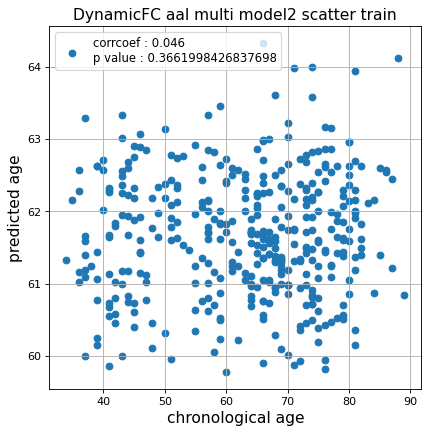

r^2 train data:  -0.00698887954914551


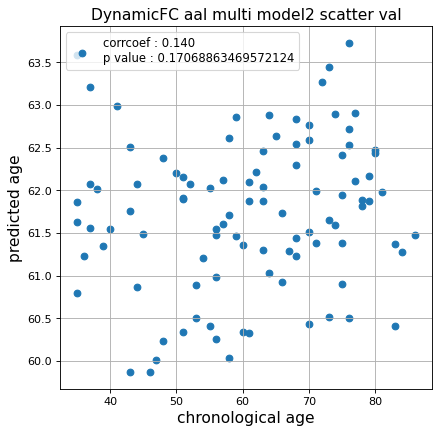

r^2 val data:  0.009434954237052873


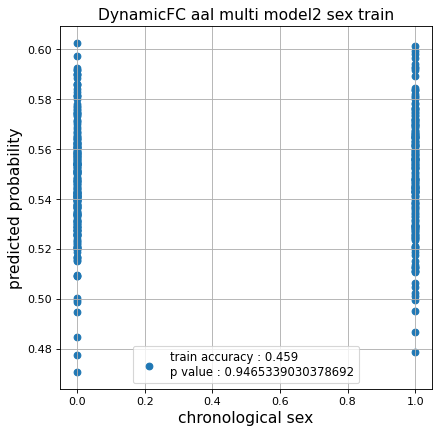

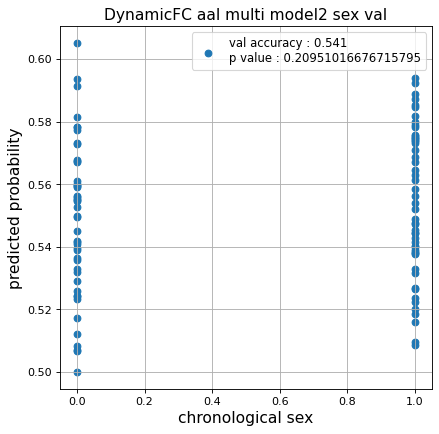

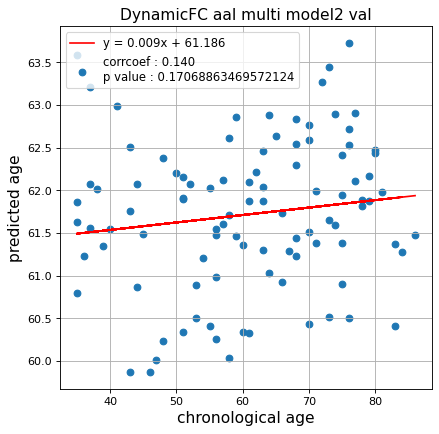

切片: 61.18622439663214
傾き: 0.00872573764348281
save_epochs:0


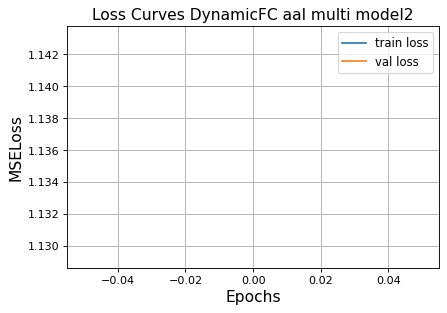

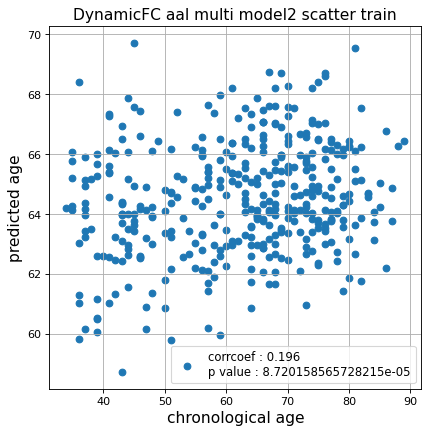

r^2 train data:  0.0005218250902655486


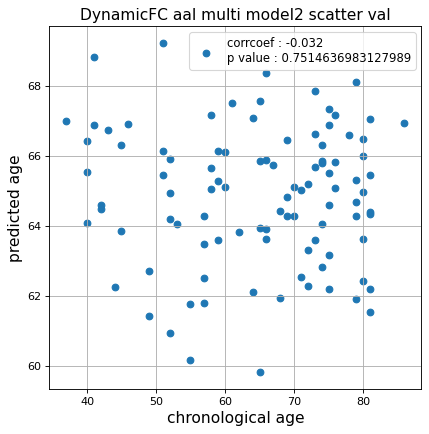

r^2 val data:  -0.033565732863869435


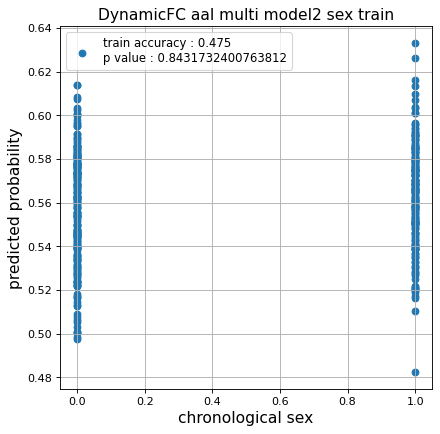

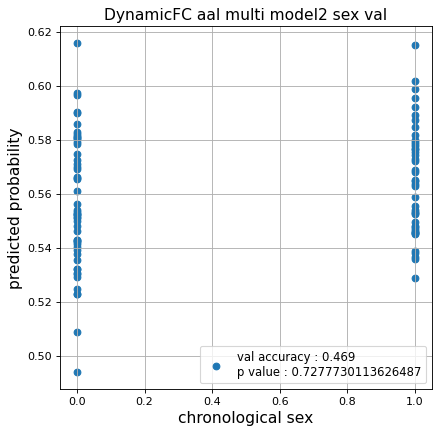

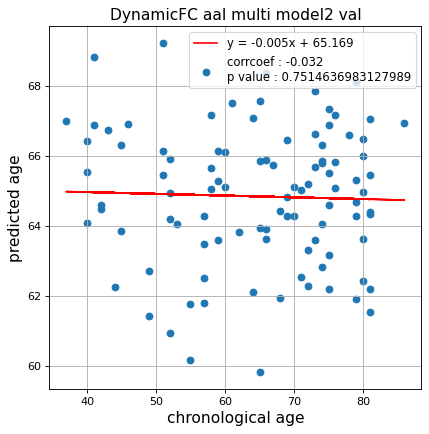

切片: 65.16949868652023
傾き: -0.00495580235767277
Nested Kfold ::: 5
save_epochs:0


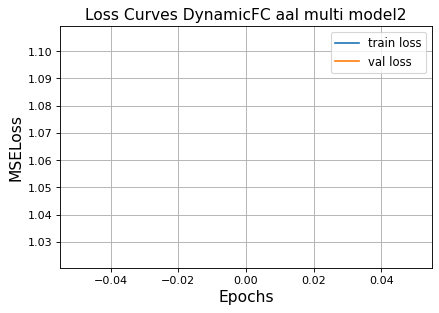

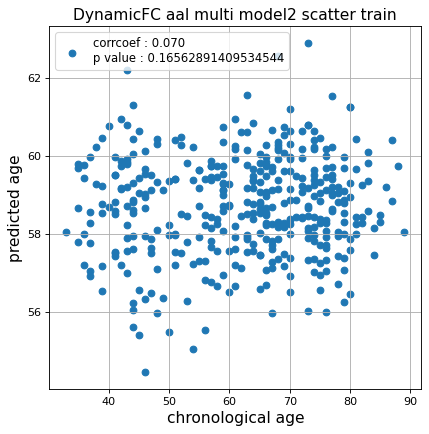

r^2 train data:  -0.05498590750478227


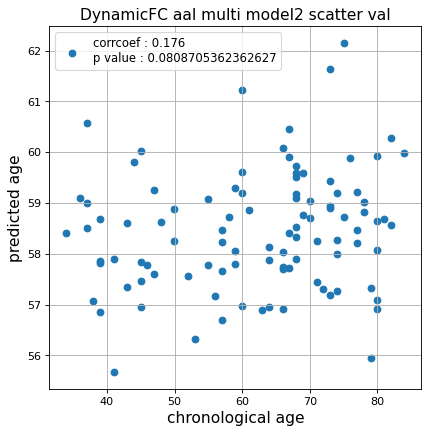

r^2 val data:  -0.0451613055829263


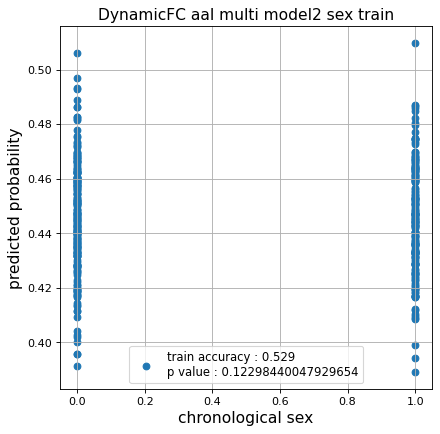

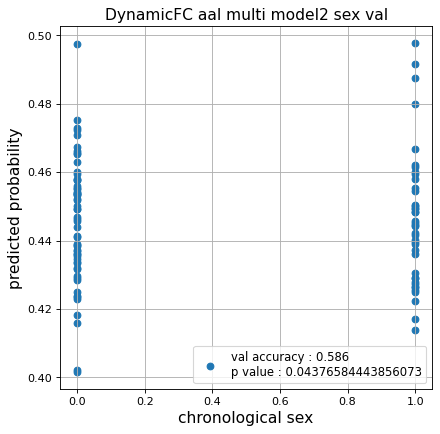

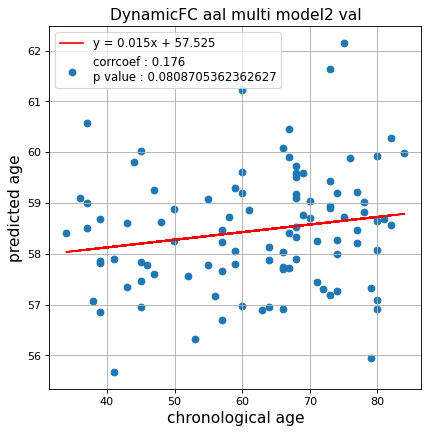

切片: 57.52461659713837
傾き: 0.015004198761076955
save_epochs:0


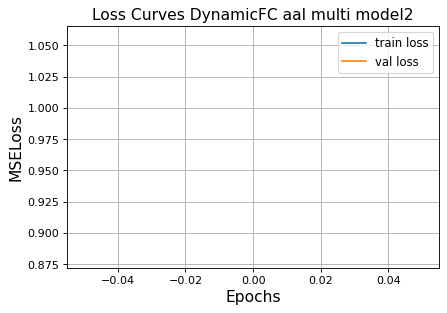

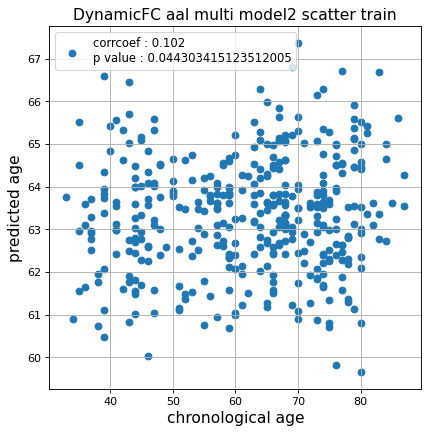

r^2 train data:  -0.002445556255647352


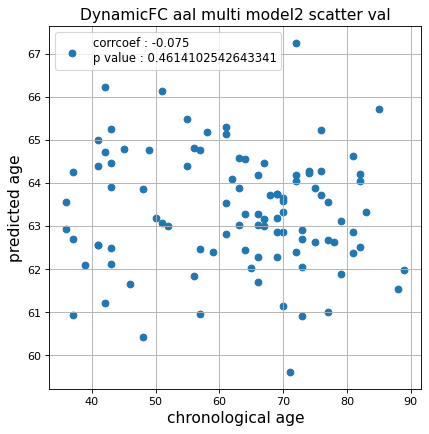

r^2 val data:  -0.02618448189050593


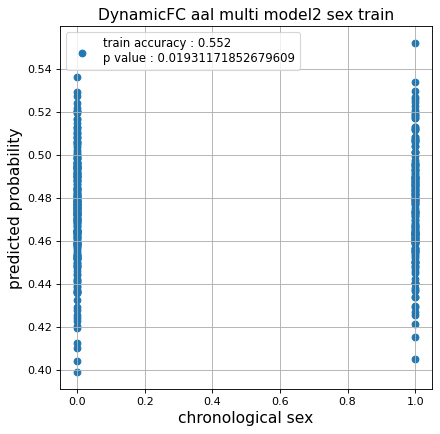

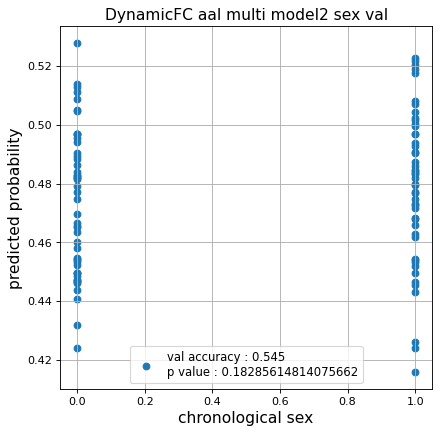

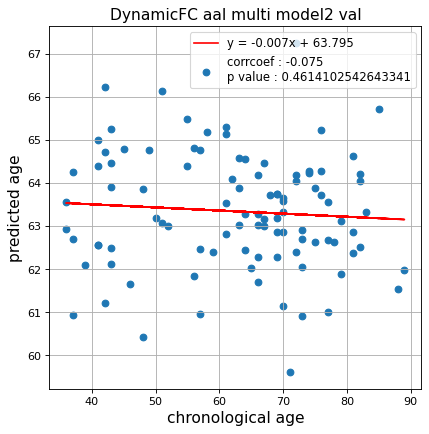

切片: 63.795107775154186
傾き: -0.007199040173182481
save_epochs:0


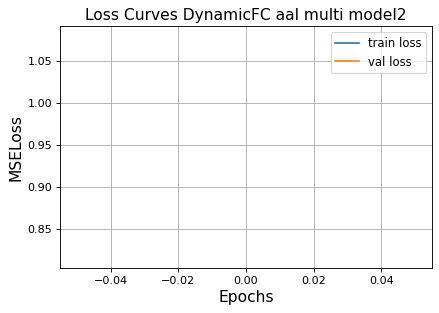

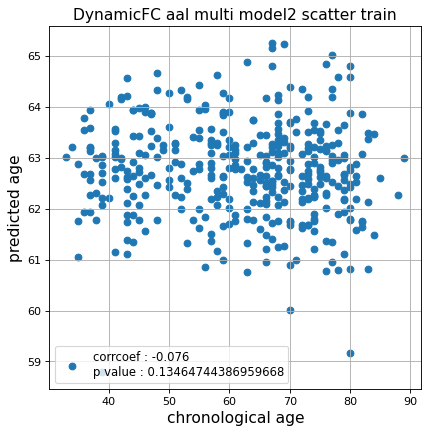

r^2 train data:  -0.01912087728280687


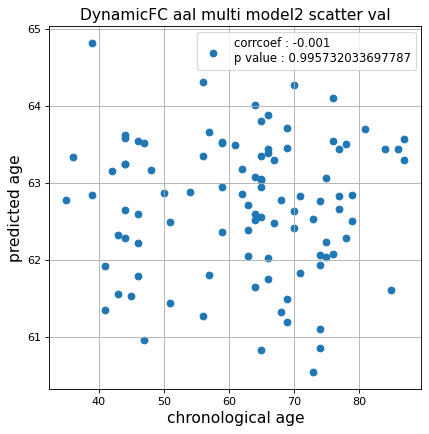

r^2 val data:  -0.004885316835050224


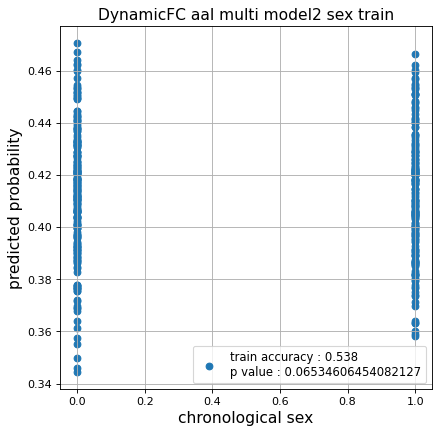

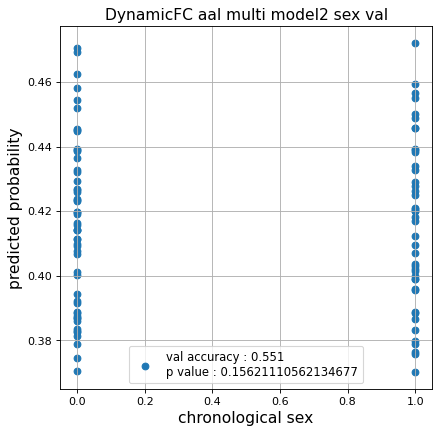

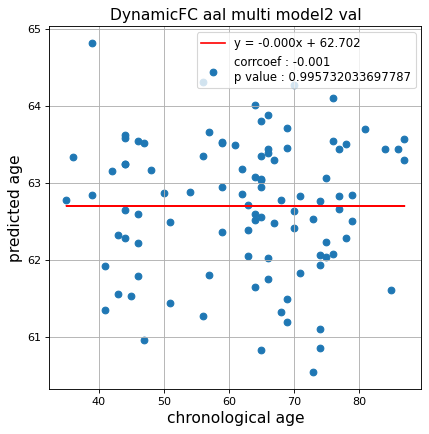

切片: 62.70227386460569
傾き: -3.636661480398704e-05
save_epochs:0


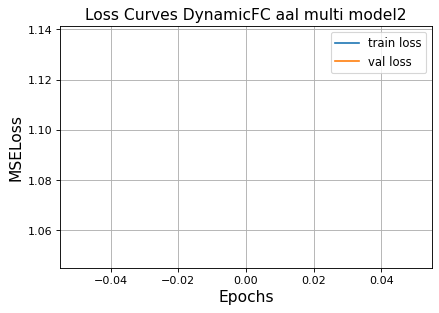

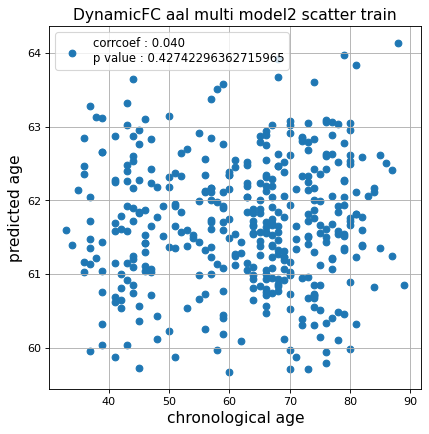

r^2 train data:  -0.0006678578416889902


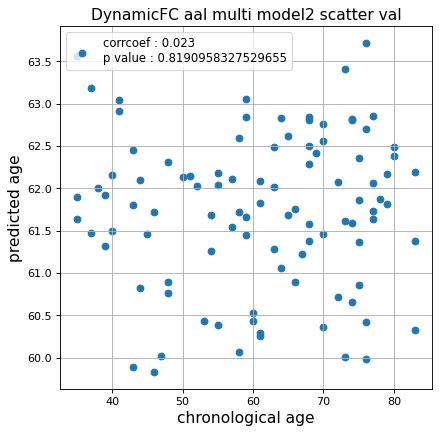

r^2 val data:  -0.00350321920827934


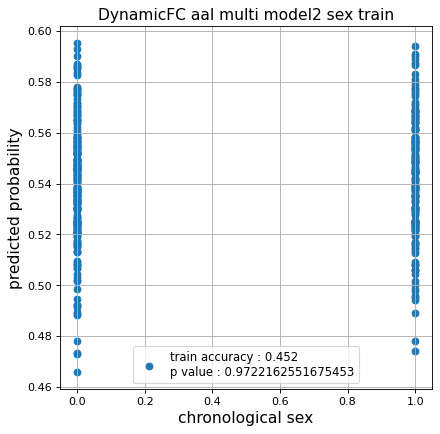

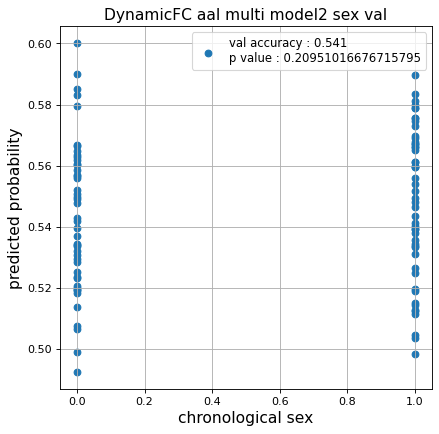

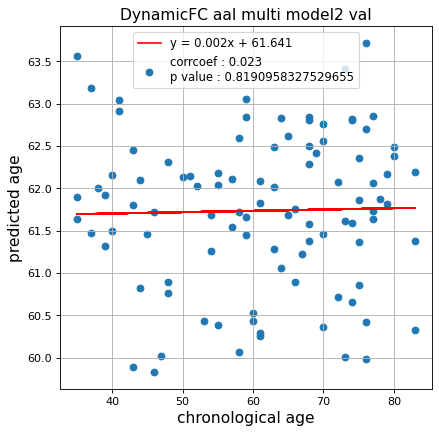

切片: 61.64068545223815
傾き: 0.0015557670327857342
save_epochs:0


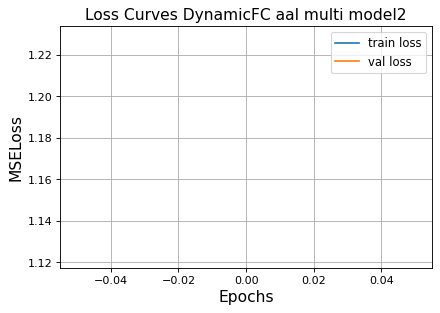

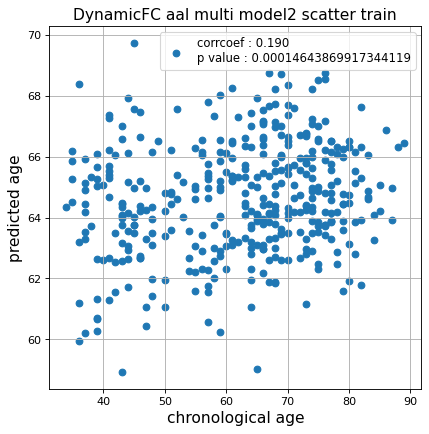

r^2 train data:  -0.0026114567077091255


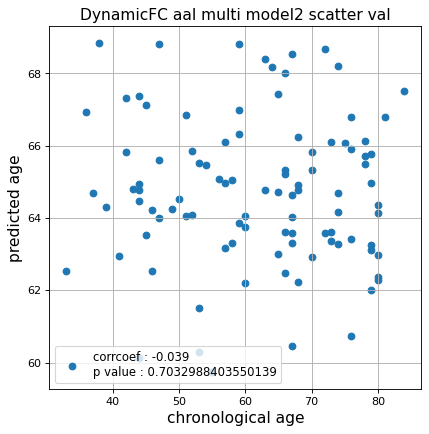

r^2 val data:  -0.08601662319961312


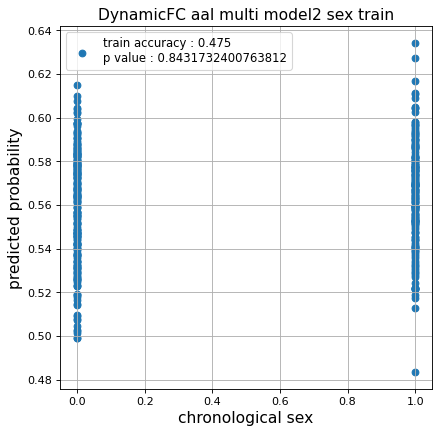

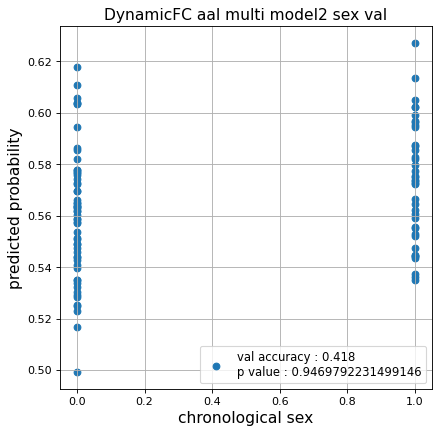

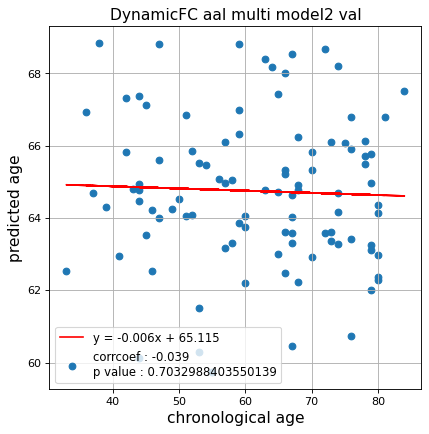

切片: 65.11467588665893
傾き: -0.0060411493051192805
CPU times: user 7min 3s, sys: 19.1 s, total: 7min 22s
Wall time: 1min 56s


In [25]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_aal_all_dynamic_2  = []
test_pred_aal_all_dynamic_inverse_2  = []
test_label_aal_all_dynamic_2 = []

test_idx_aal_all_dynamic_2   = []
train_idx_aal_all_dynamic_2  = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_aal)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_inverse,test_label = train_model(data_dynamic_aal,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1,
                                                           d_model    = 64,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 256,
                                                           nhead      = 2,#4
                                                           hidden_dim_transformer = 1,#2
                                                           pos_drop    = 0.5,
                                                           trans_drop = 0.5,
                                                           fc_drop = 0.3,
                                                           title = 'DynamicFC aal multi model2'
                                                          )
    
    test_pred_aal_all_dynamic_2.append(test_pred)
    test_pred_aal_all_dynamic_inverse_2.append(test_pred_inverse)
    test_label_aal_all_dynamic_2.append(test_label)

    test_idx_aal_all_dynamic_2.append(test_idx)
    train_idx_aal_all_dynamic_2.append(train_idx)

## 学習(Harvard-Oxford)

### Bold 1

Nested Kfold ::: 1
save_epochs:0


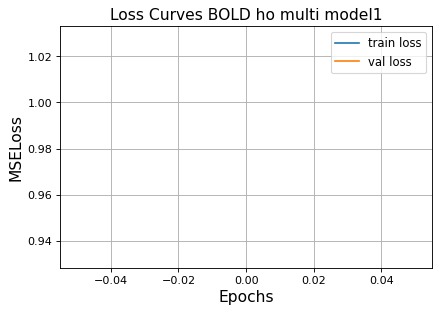

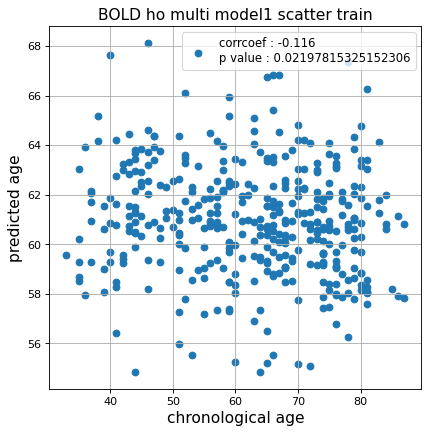

r^2 train data:  -0.07871476817870193


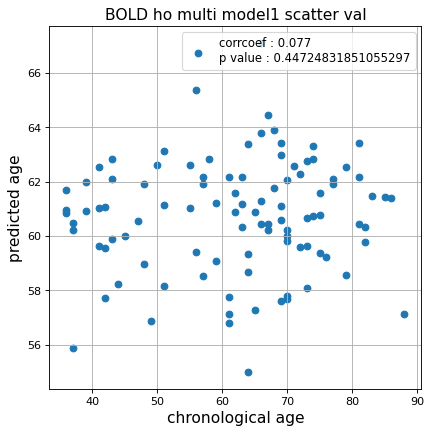

r^2 val data:  -0.006628728008124751


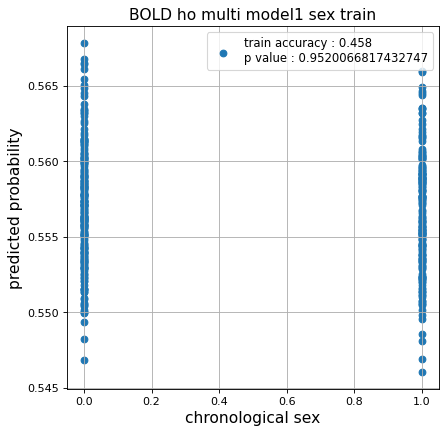

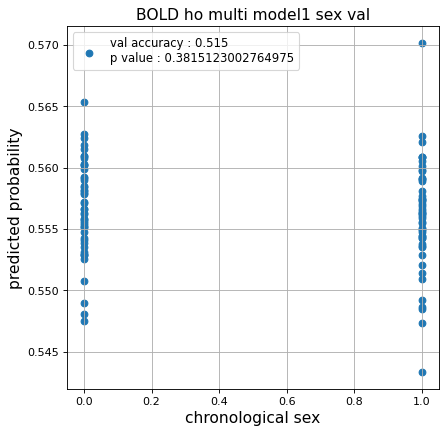

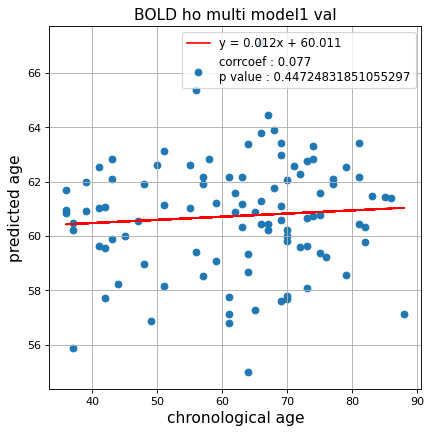

切片: 60.011213841535174
傾き: 0.011635257221705818
save_epochs:0


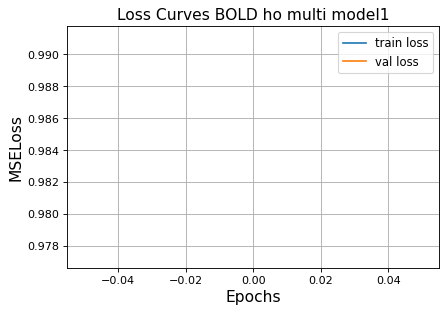

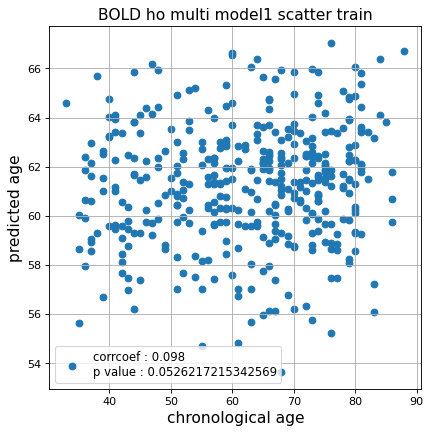

r^2 train data:  -0.0029794168605106197


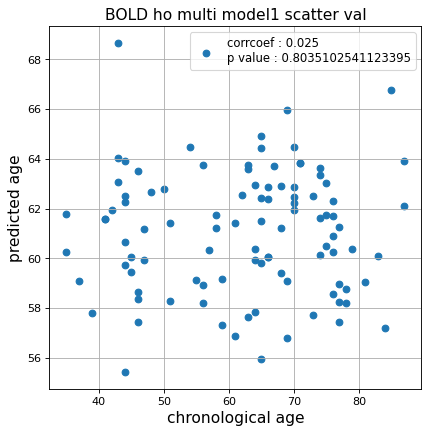

r^2 val data:  -0.030229474536086487


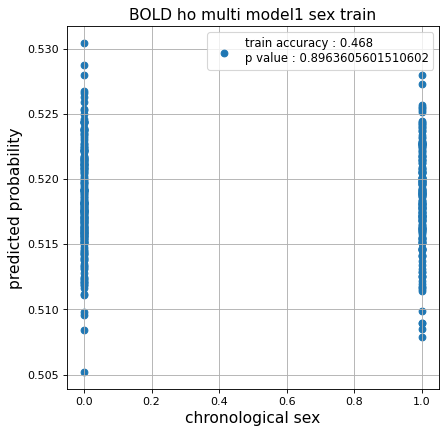

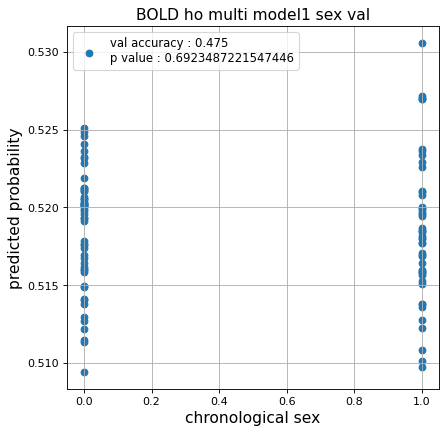

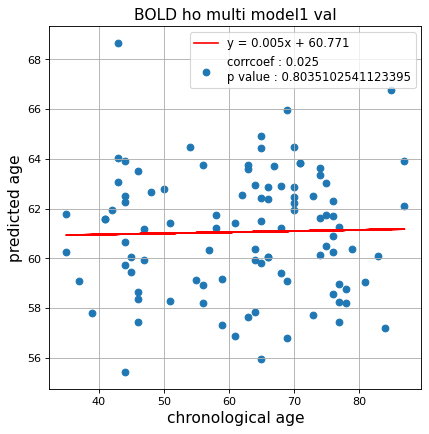

切片: 60.771337799755514
傾き: 0.004623526230732535
save_epochs:0


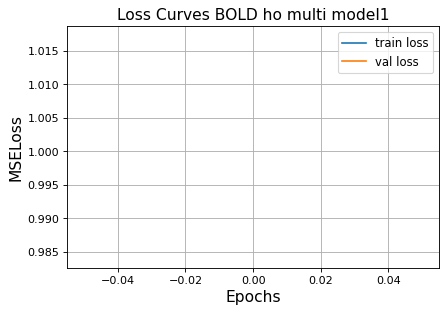

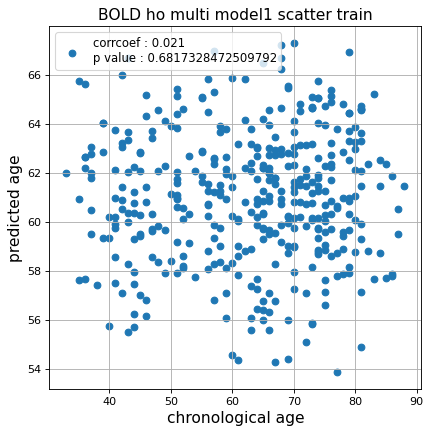

r^2 train data:  -0.04782279174964188


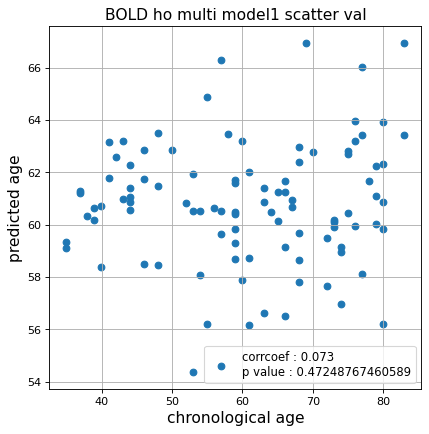

r^2 val data:  -0.004297450844214179


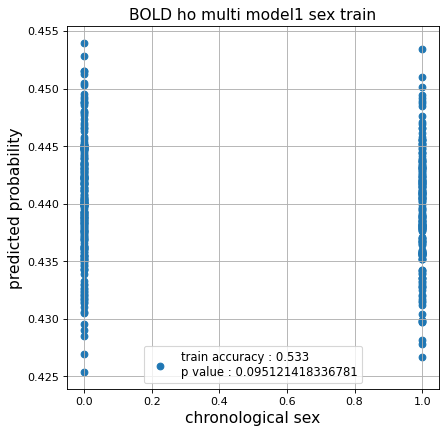

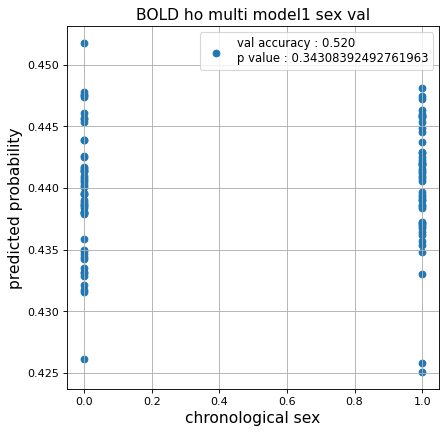

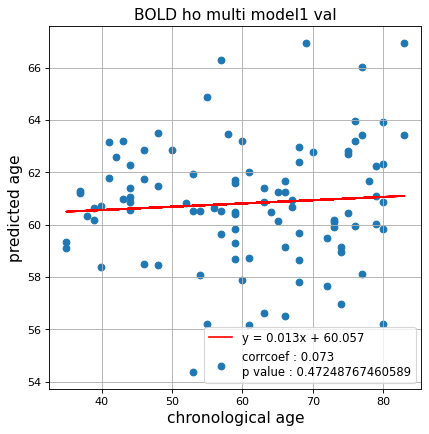

切片: 60.05719072135007
傾き: 0.012544617486881404
save_epochs:0


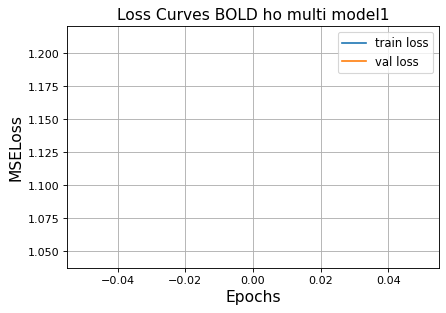

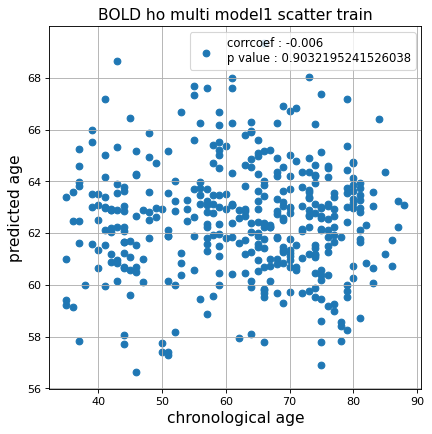

r^2 train data:  -0.028376813894034125


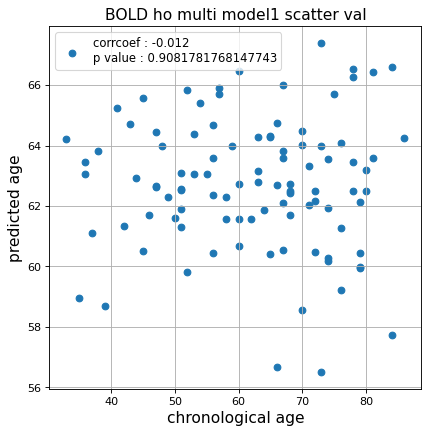

r^2 val data:  -0.03310493571912265


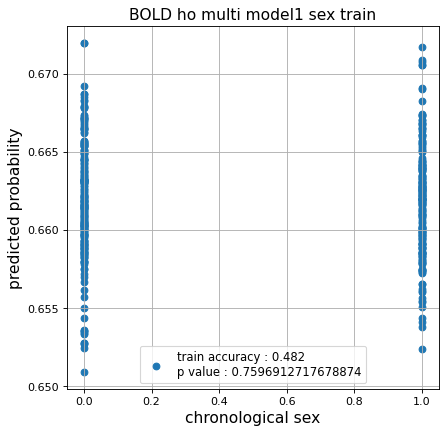

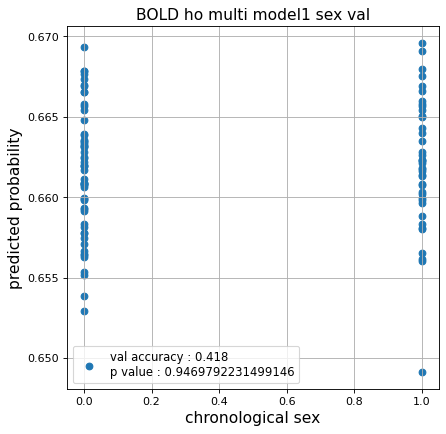

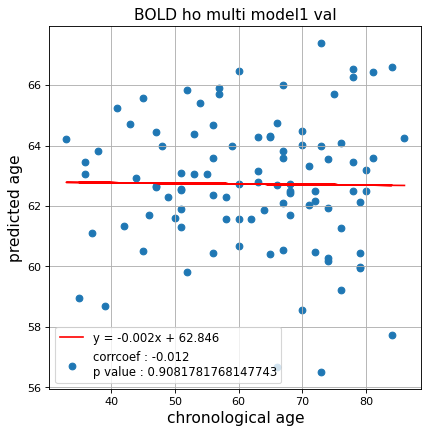

切片: 62.846005353792826
傾き: -0.0019246963582725727
save_epochs:0


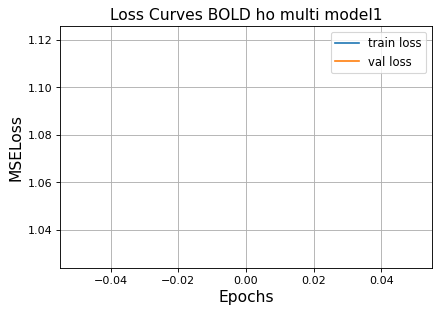

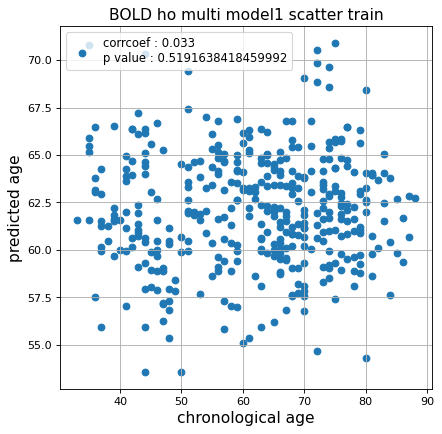

r^2 train data:  -0.0363230504972718


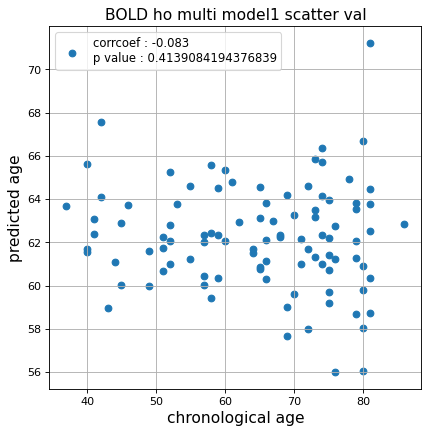

r^2 val data:  -0.10324891608257136


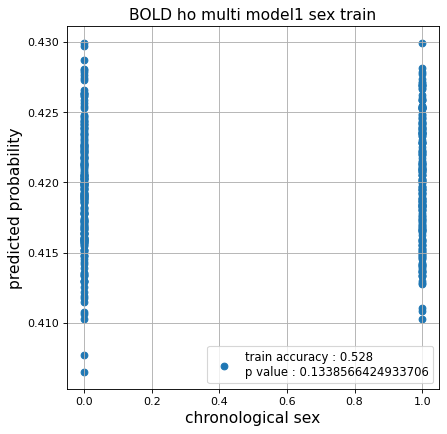

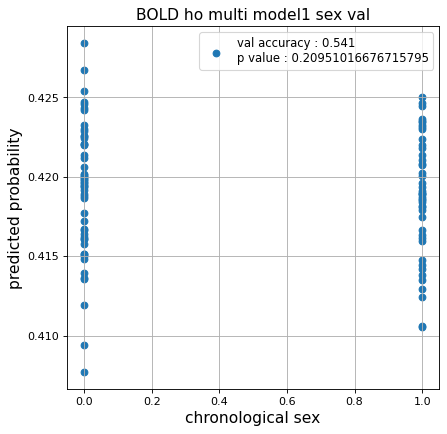

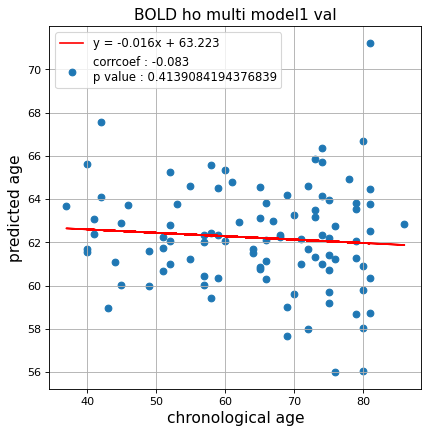

切片: 63.223388077127815
傾き: -0.015684277100715814
Nested Kfold ::: 2
save_epochs:0


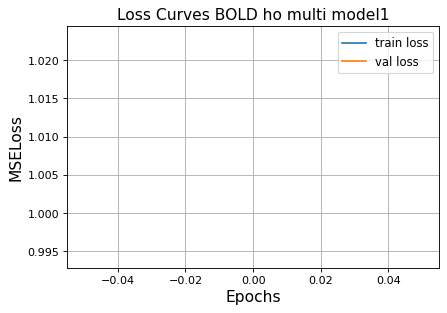

In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_all_1  = []
test_pred_ho_all_inverse_1  = []
test_label_ho_all_1 = []

test_idx_ho_all_1   = []
train_idx_ho_all_1  = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_inverse,test_label = train_model(data_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1,
                                                           d_model    = 256,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 1024,
                                                           nhead      = 32,
                                                           hidden_dim_transformer = 2,
                                                           pos_drop    = 0.1,
                                                           trans_drop = 0.2,
                                                           fc_drop = 0.1,
                                                           title = 'BOLD ho multi model1'
                                                          )
    
    test_pred_ho_all_1.append(test_pred)
    test_pred_ho_all_inverse_1.append(test_pred_inverse)
    test_label_ho_all_1.append(test_label)

    test_idx_ho_all_1.append(test_idx)
    train_idx_ho_all_1.append(train_idx)

### Bold 2

In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_all_2  = []
test_pred_ho_all_inverse_2  = []
test_label_ho_all_2 = []

test_idx_ho_all_2   = []
train_idx_ho_all_2  = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_inverse,test_label = train_model(data_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1,
                                                           d_model    = 128,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 128,
                                                           nhead      = 32,
                                                           hidden_dim_transformer = 2,
                                                           pos_drop    = 0.1,
                                                           trans_drop = 0.1,
                                                           fc_drop = 0.1,
                                                           title = 'BOLD ho multi model2'
                                                          )
    
    test_pred_ho_all_2.append(test_pred)
    test_pred_ho_all_inverse_2.append(test_pred_inverse)
    test_label_ho_all_2.append(test_label)

    test_idx_ho_all_2.append(test_idx)
    train_idx_ho_all_2.append(train_idx)

### Data定義(dynamic FC)

In [ ]:
%%time
df_dynamic_ho = pd.read_csv('../02_data_analysis/dynamic_FC/dynamic_ho.csv')
data_dynamic_ho = make_data(df_dynamic_ho)
print(data_dynamic_ho.shape)

### Dynamic FC 1

In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_all_dynamic_1  = []
test_pred_ho_all_dynamic_inverse_1  = []
test_label_ho_all_dynamic_1 = []

test_idx_ho_all_dynamic_1   = []
train_idx_ho_all_dynamic_1  = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_inverse,test_label = train_model(data_dynamic_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1,
                                                           d_model    = 64,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 256,
                                                           nhead      = 2,#4
                                                           hidden_dim_transformer = 1,#2
                                                           pos_drop    = 0.3,
                                                           trans_drop = 0.5,
                                                           fc_drop = 0.3,
                                                           title = 'DynamicFC ho multi model1'
                                                          )
    
    test_pred_ho_all_dynamic_1.append(test_pred)
    test_pred_ho_all_dynamic_inverse_1.append(test_pred_inverse)
    test_label_ho_all_dynamic_1.append(test_label)

    test_idx_ho_all_dynamic_1.append(test_idx)
    train_idx_ho_all_dynamic_1.append(train_idx)

### Dynamic FC 2

In [ ]:
%%time
fold = KFold(n_splits=n_splits,shuffle=False)

test_pred_ho_all_dynamic_2  = []
test_pred_ho_all_dynamic_inverse_2  = []
test_label_ho_all_dynamic_2 = []

test_idx_ho_all_dynamic_2   = []
train_idx_ho_all_dynamic_2  = []

for fold_idx, (train_idx, test_idx) in enumerate(fold.split(data_ho)):
    print(f'Nested Kfold ::: {fold_idx+1}')
    test_pred,test_pred_inverse,test_label = train_model(data_dynamic_ho,
                                                           data_label,
                                                           train_idx  = train_idx,
                                                           test_idx   = test_idx,
                                                           epochs     = 1,
                                                           d_model    = 64,
                                                           n_splits   = n_splits,
                                                           hidden_dim = 256,
                                                           nhead      = 2,#4
                                                           hidden_dim_transformer = 1,#2
                                                           pos_drop    = 0.5,
                                                           trans_drop = 0.5,
                                                           fc_drop = 0.3,
                                                           title = 'DynamicFC ho multi model2'
                                                          )
    
    test_pred_ho_all_dynamic_2.append(test_pred)
    test_pred_ho_all_dynamic_inverse_2.append(test_pred_inverse)
    test_label_ho_all_dynamic_2.append(test_label)

    test_idx_ho_all_dynamic_2.append(test_idx)
    train_idx_ho_all_dynamic_2.append(train_idx)